image.png


<h1><center><font size=10><a name='link6'>Data Science and Business Analytics</a></center></font></h1>


<h1><center> Practice Project I </center></h1>

<h1><center>Prediction of Diabetes Patient Based on Diagnostic Measurements</center></h1>



<h1><center> By </center></h1>



<h1><center>Hayford Osumanu </center></h1>



<h1><center>December  2022 </center></h1>


image.png


<h1><center><font size=10><a name='link6'>Artificial Intelligence and Machine Learning is the Oxgyen to Today's Business</a></center></font></h1>




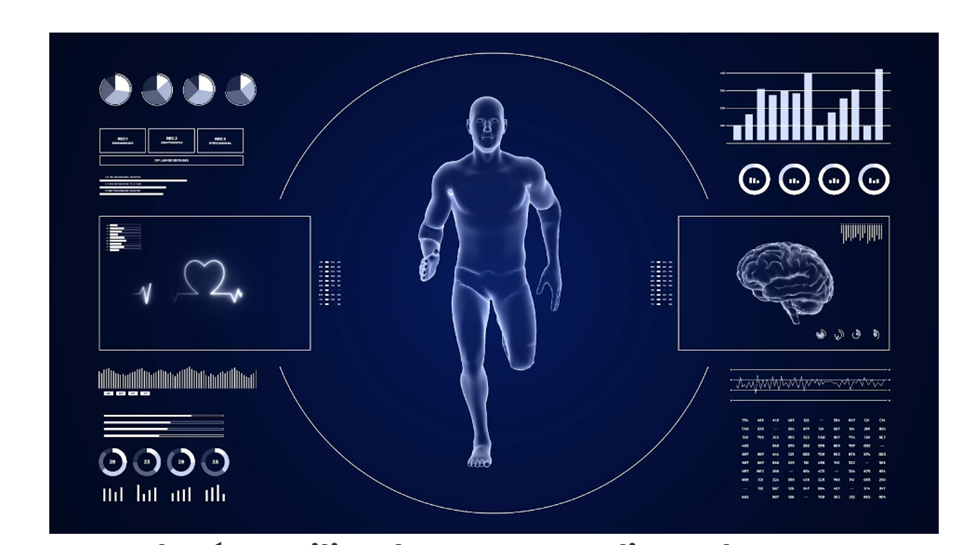

image.png

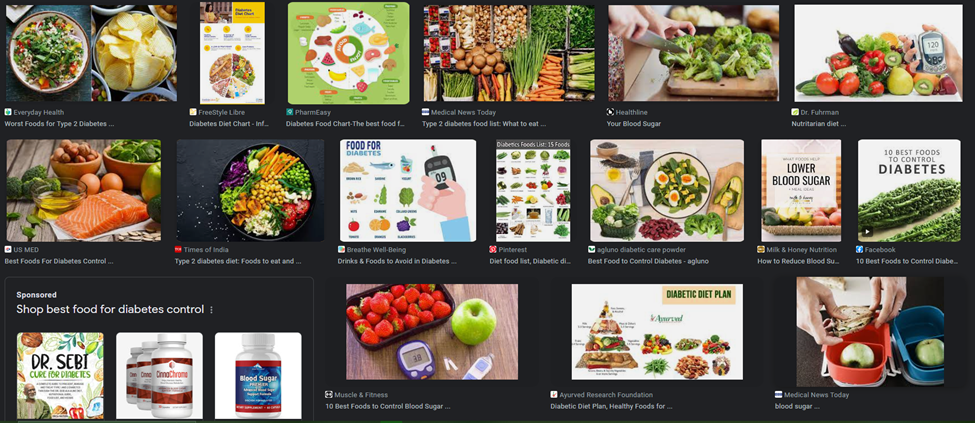

image.png

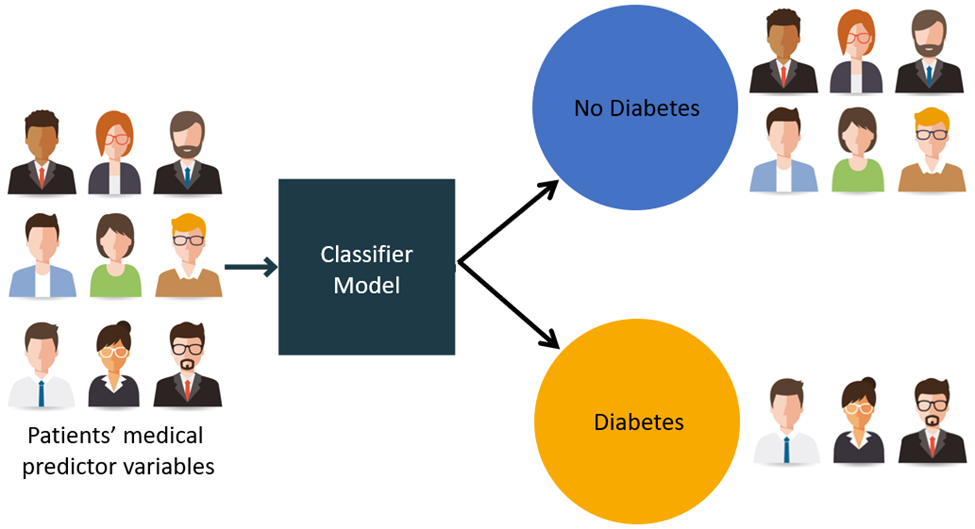

image.png

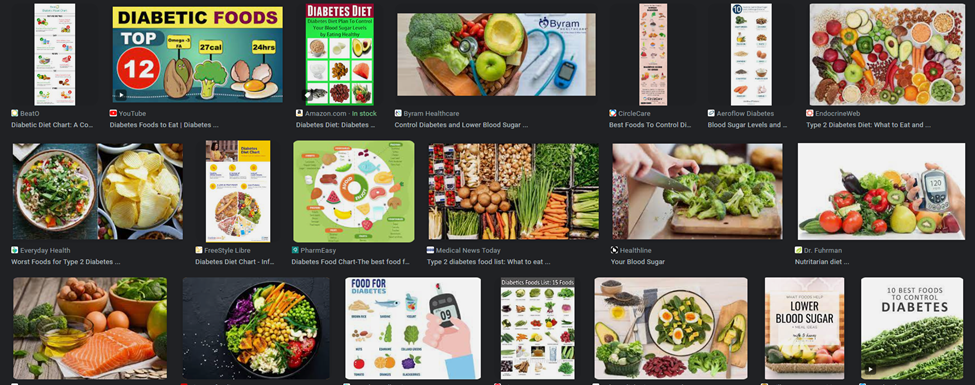

image.png

# Executive Summary



The primary objective of this study is to build machine learning or classification model that will help to predict diabetes patient based on certain diagnostic measurements. To achieve the above-mentioned objective, the analyst used Univariate, Multivariate Analysis, and Bagging & Boosting machine learning decision trees models. 


Univariate data analysis was used to explore all the variables and provide observations on the distributions of all the relevant variables in the dataset. Besides, Multivariate data analysis was also used to help explore relationships between the important variables in the dataset. Finally, Decision Tree Models (Bagging and Boosting) was used to identify a relationship between the independent variable(s) and the dependent variable to help predict the dependent/target/response variable using the independent/explanatory/regressor. The primary Statistical/ML software used for the analysis was Python.



From the analysis it was observed that the most important factors for prediction diabetes patients include Glucose level, BMI, Age, and Diabetes Pedigree Function. The decision model predicted that a person is less likely to have diabetes if he/she is less than 29 years, glucose level less than 127, BMI less than 32.3, and DPD of less than 0.67 and vice versa. This and more other interesting observations were discovered in the analysis.


image.png

# Problem Statement, Business Objectives and Data Description

## Content

Diabetes is one of the most frequent diseases worldwide and the number of diabetic patients is growing over the years. The main cause of diabetes remains unknown, yet scientists believe that both genetic factors and environmental lifestyle play a major role in diabetes.

Individuals with diabetes face a risk of developing some secondary health issues such as heart diseases and nerve damage. Thus, early detection and treatment of diabetes can prevent complications and assist in reducing the risk of severe health problems. Even though it's incurable, it can be managed by treatment and medication.

Researchers at the Bio-Solutions lab want to get better understanding of this disease among women and are planning to use machine learning models that will help them to identify patients who are at risk of diabetes.


## About the Dataset

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective of the dataset is to diagnostically predict whether or not a patient has diabetes, based on certain diagnostic measurements included in the dataset. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

## Data Description:

`Pregnancies`: Number of times pregnant

`Glucose`: Plasma glucose concentration over 2 hours in an oral glucose tolerance test

`BloodPressure`: Diastolic blood pressure (mm Hg)

`SkinThickness`: Triceps skinfold thickness (mm)

`Insulin`: 2-Hour serum insulin (mu U/ml)

`BMI`: Body mass index (weight in kg/(height in m)^2)

`Pedigree`: Diabetes pedigree function - A function that scores likelihood of diabetes based on family history.

`Age`: Age in years

`Outcome`: Outcome variable (0: the person is not diabetic or 1: the person is diabetic)


## Acknowledgements/Source of Data

Smith, J.W., Everhart, J.E., Dickson, W.C., Knowler, W.C., & Johannes, R.S. (1988). Using the ADAP learning algorithm to forecast the onset of diabetes mellitus. In Proceedings of the Symposium on Computer Applications and Medical Care (pp. 261--265). IEEE Computer Society Press.


image.png

# Importing all the Relevant Libraries for Data Analysis

In [ ]:
# installing the needed upgrade optimum performance
!pip install nb_black
!pip install ipython --upgrade
!pip install xgboost

In [3]:
# Other important packages for data data analysis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
from statsmodels.formula.api import ols
from statsmodels.graphics.gofplots import ProbPlot
import statsmodels.api as sm
from scipy import stats;

In [4]:
#format numeric data for easier readability
pd.set_option(
    "display.float_format", lambda x: "%.2f" % x
)  # to display numbers rounded off to 2 decimal places

In [5]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns



# split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# to build linear regression_model using statsmodels
import statsmodels.api as sm

# to compute VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Command to tell Python to actually display the graphs
%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.2f' % x) # To supress numerical display in scientific notations

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200);


<IPython.core.display.Javascript object>

In [6]:
# this will help in making the Python code more structured automatically (good coding practice)
%load_ext nb_black
import warnings

warnings.filterwarnings("ignore")

# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
import xgboost as xgb

# Library to split data
from sklearn.model_selection import train_test_split

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# Sets the limit for the number of displayed rows
pd.set_option("display.max_rows", 200)


# Libraries different ensemble classifiers
from sklearn.ensemble import (
    BaggingClassifier,
    RandomForestClassifier,
    AdaBoostClassifier,
    GradientBoostingClassifier,
    StackingClassifier,
)

from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier

# Libraries to get different metric scores
from sklearn import metrics
from sklearn.metrics import (
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
)

# To tune different models
from sklearn.model_selection import GridSearchCV

The nb_black extension is already loaded. To reload it, use:
  %reload_ext nb_black


<IPython.core.display.Javascript object>

In [7]:
# Libraries to help with reading and manipulating data

import pandas as pd
import numpy as np

# Library to split data
from sklearn.model_selection import train_test_split

# libaries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Removes the limit for the number of displayed columns
pd.set_option("display.max_columns", None)

# To build Logistic Regression model for prediction
import statsmodels.stats.api as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.tools.tools import add_constant
from sklearn.linear_model import LogisticRegression

# To get diferent metric scores
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    plot_confusion_matrix,
    precision_recall_curve,
    roc_curve,
    make_scorer,
)

# Libraries to build decision tree classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# To tune different models
from sklearn.model_selection import GridSearchCV

<IPython.core.display.Javascript object>

In [8]:
# Import all the Required Statistical Distributions
from scipy import stats
from scipy.stats import ttest_1samp
from numpy import sqrt, abs
from scipy.stats import norm
from scipy.stats import ttest_ind
from scipy.stats import ttest_rel
from statsmodels.stats.proportion import proportions_ztest
from scipy.stats import chi2
from scipy.stats import f
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.stats import levene

<IPython.core.display.Javascript object>

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import metrics

from sklearn.impute import SimpleImputer

from sklearn.tree import DecisionTreeClassifier

<IPython.core.display.Javascript object>

image.png

# Data Analysis Philosophy

In [ ]:
import this

The Zen of Python, by Tim Peters

Beautiful is better than ugly.
Explicit is better than implicit.
Simple is better than complex.
Complex is better than complicated.
Flat is better than nested.
Sparse is better than dense.
Readability counts.
Special cases aren't special enough to break the rules.
Although practicality beats purity.
Errors should never pass silently.
Unless explicitly silenced.
In the face of ambiguity, refuse the temptation to guess.
There should be one-- and preferably only one --obvious way to do it.
Although that way may not be obvious at first unless you're Dutch.
Now is better than never.
Although never is often better than *right* now.
If the implementation is hard to explain, it's a bad idea.
If the implementation is easy to explain, it may be a good idea.
Namespaces are one honking great idea -- let's do more of those!


<IPython.core.display.Javascript object>

image.png

# Reading the Data into a DataFrame

In [ ]:
# mounting  google drive to enable data reading
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


<IPython.core.display.Javascript object>

In [ ]:
# Reading Dataset from Google Drive
diabetes_data=pd.read_csv("/content/drive/MyDrive/DataBank/Diabetes_1.csv")

<IPython.core.display.Javascript object>

In [12]:
# Reading the data from the local drive
diabetes_data = pd.read_csv(
    "C:/Users/hayfo/OneDrive/Desktop/Data Publication/Diabetes Project/Publish/Diabetes_1.csv"
)

<IPython.core.display.Javascript object>

In [13]:
# copying data to another variable to avoid any changes to original data
data = diabetes_data.copy()

<IPython.core.display.Javascript object>

image.png

# Part I: Data Overview

image.png

### Observation of the DataFrame

The initial steps to get an overview of any dataset is to: 
- observe the first few rows of the dataset, to check whether the dataset has been loaded properly or not
- get information about the number of rows and columns in the dataset
- find out the data types of the columns to ensure that data is stored in the preferred format and the value of each property is as expected.
- check the statistical summary of the dataset to get an overview of the numerical columns of the data

In [14]:
# Creating  a well readable header label
for header in data.columns:
    header_replace = header.replace(
        " ", "_"
    )  # creates new header with "_" instead of " ".
    data.rename(
        {header: header_replace}, axis=1, inplace=True
    )  # sets new header as header made in line above

<IPython.core.display.Javascript object>

image.png

In [15]:
# Extracting the first 10 rows ofthe dataset
data.head(10)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
0,6,148,72,35,0,33.60,0.63,50,1
1,1,85,66,29,0,26.60,0.35,31,0
2,8,183,64,0,0,23.30,0.67,32,1
3,1,89,66,23,94,28.10,0.17,21,0
4,0,137,40,35,168,43.10,2.29,33,1
5,5,116,74,0,0,25.60,0.20,30,0
6,3,78,50,32,88,31.00,0.25,26,1
7,10,115,0,0,0,35.30,0.13,29,0
8,2,197,70,45,543,30.50,0.16,53,1
9,8,125,96,0,0,0.00,0.23,54,1


<IPython.core.display.Javascript object>

In [16]:
# observing the last 10 rows of the dataset
data.tail(10)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
758,1,106,76,0,0,37.50,0.20,26,0
759,6,190,92,0,0,35.50,0.28,66,1
760,2,88,58,26,16,28.40,0.77,22,0
761,9,170,74,31,0,44.00,0.40,43,1
762,9,89,62,0,0,22.50,0.14,33,0
763,10,101,76,48,180,32.90,0.17,63,0
764,2,122,70,27,0,36.80,0.34,27,0
765,5,121,72,23,112,26.20,0.24,30,0
766,1,126,60,0,0,30.10,0.35,47,1
767,1,93,70,31,0,30.40,0.32,23,0


<IPython.core.display.Javascript object>

In [17]:
# let's view a random sample of 10  observations of the entire dataset
data.sample(n=10, random_state=1)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
285,7,136,74,26,135,26.00,0.65,51,0
101,1,151,60,0,0,26.10,0.18,22,0
581,6,109,60,27,0,25.00,0.21,27,0
352,3,61,82,28,0,34.40,0.24,46,0
726,1,116,78,29,180,36.10,0.50,25,0
472,0,119,66,27,0,38.80,0.26,22,0
233,4,122,68,0,0,35.00,0.39,29,0
385,1,119,54,13,50,22.30,0.20,24,0
556,1,97,70,40,0,38.10,0.22,30,0
59,0,105,64,41,142,41.50,0.17,22,0


<IPython.core.display.Javascript object>

In [18]:
# let's view a random sample of 10  observations of the entire dataset
data.sample(n=10, random_state=2)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
158,2,88,74,19,53,29.00,0.23,22,0
251,2,129,84,0,0,28.00,0.28,27,0
631,0,102,78,40,90,34.50,0.24,24,0
757,0,123,72,0,0,36.30,0.26,52,1
689,1,144,82,46,180,46.10,0.34,46,1
573,2,98,60,17,120,34.70,0.20,22,0
553,1,88,62,24,44,29.90,0.42,23,0
728,2,175,88,0,0,22.90,0.33,22,0
183,5,73,60,0,0,26.80,0.27,27,0
515,3,163,70,18,105,31.60,0.27,28,1


<IPython.core.display.Javascript object>

image.png

### Columns/Variable/Features of the Dataset

In [19]:
# Extracting the columns/variables of the dataset
data.columns

Index(['Pregnancies', 'Glucose', 'Blood__Pressure', 'Skin_Thickness',
       'Insulin', 'BMI', 'Diabetes__Pedigree__Function', 'Age', 'Outcome'],
      dtype='object')

<IPython.core.display.Javascript object>

The data in the tables above contains information of different attributes of  diabetes patients based on certain diagnostic measurements. The detailed data dictionary is given below.


`Pregnancies`: Number of times pregnant

`Glucose`: Plasma glucose concentration over 2 hours in an oral glucose tolerance test

`BloodPressure`: Diastolic blood pressure (mm Hg)

`SkinThickness`: Triceps skinfold thickness (mm)

`Insulin`: 2-Hour serum insulin (mu U/ml)

`BMI`: Body mass index (weight in kg/(height in m)^2)

`Pedigree`: Diabetes pedigree function - A function that scores likelihood of diabetes based on family history.

`Age`: Age in years

`Outcome`: Outcome variable (0: the person is not diabetic or 1: the person is diabetic)

image.png

### Dimension of the Dataset

In [20]:
# checking the shape of the data
print(f"There are {data.shape[0]} rows and {data.shape[1]} columns.")

There are 768 rows and 9 columns.


<IPython.core.display.Javascript object>

In [21]:
# Checking the dimension (number of observations/rows and variables/columns of the Dataset (df.shape)
print("There are", data.shape[0], "rows and", data.shape[1], "columns.")

There are 768 rows and 9 columns.


<IPython.core.display.Javascript object>

image.png

### Data Types of the Dataset

In [22]:
# Checking the data types of the variables/columns for the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Pregnancies                   768 non-null    int64  
 1   Glucose                       768 non-null    int64  
 2   Blood__Pressure               768 non-null    int64  
 3   Skin_Thickness                768 non-null    int64  
 4   Insulin                       768 non-null    int64  
 5   BMI                           768 non-null    float64
 6   Diabetes__Pedigree__Function  768 non-null    float64
 7   Age                           768 non-null    int64  
 8   Outcome                       768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


<IPython.core.display.Javascript object>

from pandas.core.internals.construction import dataclasses_to_dicts
#### Observation

- The main features/columns of the datasets are Pregnancies, Glucose, Blood__Pressure, Skin_Thickness,Insulin, BMI, DPF, Age, and Outcome.

- The dataset has 768 rows/observations and 9 columns/feature_names

- It appears there are no missiong values in the dataclasses_to_dicts

- The dataset has 7 integer datatypes, 2 float datatypes and no categorical variables.

- It will take about 54.1 KB memory usage.


image.png


### Checking Values Equal to Zero or Less

In [23]:
# Extracting Values Equal to Zero
(data == 0)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
0,False,False,False,False,True,False,False,False,False
1,False,False,False,False,True,False,False,False,True
2,False,False,False,True,True,False,False,False,False
3,False,False,False,False,False,False,False,False,True
4,True,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
763,False,False,False,False,False,False,False,False,True
764,False,False,False,False,True,False,False,False,True
765,False,False,False,False,False,False,False,False,True
766,False,False,False,True,True,False,False,False,False


<IPython.core.display.Javascript object>

In [24]:
# Extracting the Actual Number of Values Equal to Zero
(data == 0).shape[0]

768

<IPython.core.display.Javascript object>

In [ ]:
# Checking to see if the dataset has negative values
(data<0)

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
763,False,False,False,False,False,False,False,False,False
764,False,False,False,False,False,False,False,False,False
765,False,False,False,False,False,False,False,False,False
766,False,False,False,False,False,False,False,False,False


<IPython.core.display.Javascript object>

In [25]:
# Checking to see if the dataset has negative values
(data < 0).shape[0]

<IPython.core.display.Javascript object>

**Observation**


image.png

## Checking the Missing Values of the Dataset

In [26]:
# Checking for missing values in the dataset
data.isnull().sum()

Pregnancies                     0
Glucose                         0
Blood__Pressure                 0
Skin_Thickness                  0
Insulin                         0
BMI                             0
Diabetes__Pedigree__Function    0
Age                             0
Outcome                         0
dtype: int64

<IPython.core.display.Javascript object>

In [27]:
# Checking the total number of missing values in the dataset
data.isnull().sum().sum()

0

<IPython.core.display.Javascript object>

#### Observation

- There are no missing values in the dataset

- However, we need to fill in the zero values with the median values of each column

image.png

## Checking the Duplicates in the Dataset

In [28]:
# checking for duplicate values
print("There are about: ", data.duplicated().sum(), "dupplicates in the dataset")

There are about:  0 dupplicates in the dataset


<IPython.core.display.Javascript object>

image.png

## Removing Duplicates from the Dataset

In [29]:
# dropping duplicate entries from the data
data.drop_duplicates(inplace=True)

# resetting the index of data frame since some rows will be removed
data.reset_index(drop=True, inplace=True)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Pregnancies                   768 non-null    int64  
 1   Glucose                       768 non-null    int64  
 2   Blood__Pressure               768 non-null    int64  
 3   Skin_Thickness                768 non-null    int64  
 4   Insulin                       768 non-null    int64  
 5   BMI                           768 non-null    float64
 6   Diabetes__Pedigree__Function  768 non-null    float64
 7   Age                           768 non-null    int64  
 8   Outcome                       768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


<IPython.core.display.Javascript object>

There are no duplicates in the data

image.png

## Data Sanity Checks: Deep Checking/scrutinity of the the dataset before EDA

### Data Types of the Dataset

In [30]:
# Checking the datatypes of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Pregnancies                   768 non-null    int64  
 1   Glucose                       768 non-null    int64  
 2   Blood__Pressure               768 non-null    int64  
 3   Skin_Thickness                768 non-null    int64  
 4   Insulin                       768 non-null    int64  
 5   BMI                           768 non-null    float64
 6   Diabetes__Pedigree__Function  768 non-null    float64
 7   Age                           768 non-null    int64  
 8   Outcome                       768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


<IPython.core.display.Javascript object>

### Overview of Categorical/Object Variables

In [31]:
# Making a list of all catrgorical variables
cat_col = list(data.select_dtypes("object").columns)

# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    # print("cat_col")

<IPython.core.display.Javascript object>

#### Observation

- There are no categorical variables in the dataset

image.png

# Part II: Exploratory Data Analysis (EDA)

image.png

## Numerical Analysis of the Dataset

## Statistical summary of the numerical columns in both train and test dataset

### Statistical Summary of the Dataset

In [32]:
# let's view the statistical summary of minimum numerical columns in the data
data.describe(include=np.number).T.style.highlight_min(color="green", axis=0)

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.000000,3.845052,3.369578,0.000000,1.000000,3.000000,6.000000,17.000000
Glucose,768.000000,120.894531,31.972618,0.000000,99.000000,117.000000,140.250000,199.000000
Blood__Pressure,768.000000,69.105469,19.355807,0.000000,62.000000,72.000000,80.000000,122.000000
Skin_Thickness,768.000000,20.536458,15.952218,0.000000,0.000000,23.000000,32.000000,99.000000
Insulin,768.000000,79.799479,115.244002,0.000000,0.000000,30.500000,127.250000,846.000000
BMI,768.000000,31.992578,7.884160,0.000000,27.300000,32.000000,36.600000,67.100000
Diabetes__Pedigree__Function,768.000000,0.471876,0.331329,0.078000,0.243750,0.372500,0.626250,2.420000
Age,768.000000,33.240885,11.760232,21.000000,24.000000,29.000000,41.000000,81.000000
Outcome,768.000000,0.348958,0.476951,0.000000,0.000000,0.000000,1.000000,1.000000


<IPython.core.display.Javascript object>

In [33]:
# let's view the statistical summary of maximum numerical columns in the data
data.describe(include=np.number).T.style.highlight_max(color="indigo", axis=0)

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.000000,3.845052,3.369578,0.000000,1.000000,3.000000,6.000000,17.000000
Glucose,768.000000,120.894531,31.972618,0.000000,99.000000,117.000000,140.250000,199.000000
Blood__Pressure,768.000000,69.105469,19.355807,0.000000,62.000000,72.000000,80.000000,122.000000
Skin_Thickness,768.000000,20.536458,15.952218,0.000000,0.000000,23.000000,32.000000,99.000000
Insulin,768.000000,79.799479,115.244002,0.000000,0.000000,30.500000,127.250000,846.000000
BMI,768.000000,31.992578,7.884160,0.000000,27.300000,32.000000,36.600000,67.100000
Diabetes__Pedigree__Function,768.000000,0.471876,0.331329,0.078000,0.243750,0.372500,0.626250,2.420000
Age,768.000000,33.240885,11.760232,21.000000,24.000000,29.000000,41.000000,81.000000
Outcome,768.000000,0.348958,0.476951,0.000000,0.000000,0.000000,1.000000,1.000000


<IPython.core.display.Javascript object>

In [34]:
# Extracting the Quantiles of the dataset
data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.style.highlight_max(
    color="purple", axis=0
)

,0.25,0.5,0.6,0.75,0.9,0.95,0.99
Pregnancies,1.000000,3.000000,4.000000,6.000000,9.000000,10.000000,13.000000
Glucose,99.000000,117.000000,125.000000,140.250000,167.000000,181.000000,196.000000
Blood__Pressure,62.000000,72.000000,74.000000,80.000000,88.000000,90.000000,106.000000
Skin_Thickness,0.000000,23.000000,27.000000,32.000000,40.000000,44.000000,51.330000
Insulin,0.000000,30.500000,72.200000,127.250000,210.000000,293.000000,519.900000
BMI,27.300000,32.000000,33.700000,36.600000,41.500000,44.395000,50.759000
Diabetes__Pedigree__Function,0.243750,0.372500,0.454200,0.626250,0.878600,1.132850,1.698330
Age,24.000000,29.000000,33.000000,41.000000,51.000000,58.000000,67.000000
Outcome,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>

In [35]:
# Extracting the Quantiles of the dataset
data.quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T.style.highlight_min(
    color="red", axis=0
)

,0.25,0.5,0.6,0.75,0.9,0.95,0.99
Pregnancies,1.000000,3.000000,4.000000,6.000000,9.000000,10.000000,13.000000
Glucose,99.000000,117.000000,125.000000,140.250000,167.000000,181.000000,196.000000
Blood__Pressure,62.000000,72.000000,74.000000,80.000000,88.000000,90.000000,106.000000
Skin_Thickness,0.000000,23.000000,27.000000,32.000000,40.000000,44.000000,51.330000
Insulin,0.000000,30.500000,72.200000,127.250000,210.000000,293.000000,519.900000
BMI,27.300000,32.000000,33.700000,36.600000,41.500000,44.395000,50.759000
Diabetes__Pedigree__Function,0.243750,0.372500,0.454200,0.626250,0.878600,1.132850,1.698330
Age,24.000000,29.000000,33.000000,41.000000,51.000000,58.000000,67.000000
Outcome,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000


<IPython.core.display.Javascript object>

**Observations -**
* We have data of women with an average of 4 pregnancies.
* Variables like Glucose, BloodPressure, SkinThickness, and Insulin have minimum values of 0 which might be data input errors and we should explore it further.
* There is a large difference between the 3rd quartile and maximum value for variables like SkinThickness, Insulin, and Age which suggest that there might be outliers present in the data.
* The average age of women in the data is 33 years.

image.png

## Graphical Univariate Analysis

In [36]:
len(data.columns)

9

<IPython.core.display.Javascript object>

In [ ]:
# Checking the histogram plot  of the entire dataset
cols = 5
rows = 5
num_cols = data.select_dtypes(include='category').columns
fig = plt.figure( figsize=(cols*5, rows*5))
for i, col in enumerate(num_cols):
    
    ax=fig.add_subplot(rows,cols,i+1)
    
    sns.histplot(x =data[col], ax = ax)
    
fig.tight_layout()  
plt.show()

<Figure size 1800x1800 with 0 Axes>

<IPython.core.display.Javascript object>

image.png

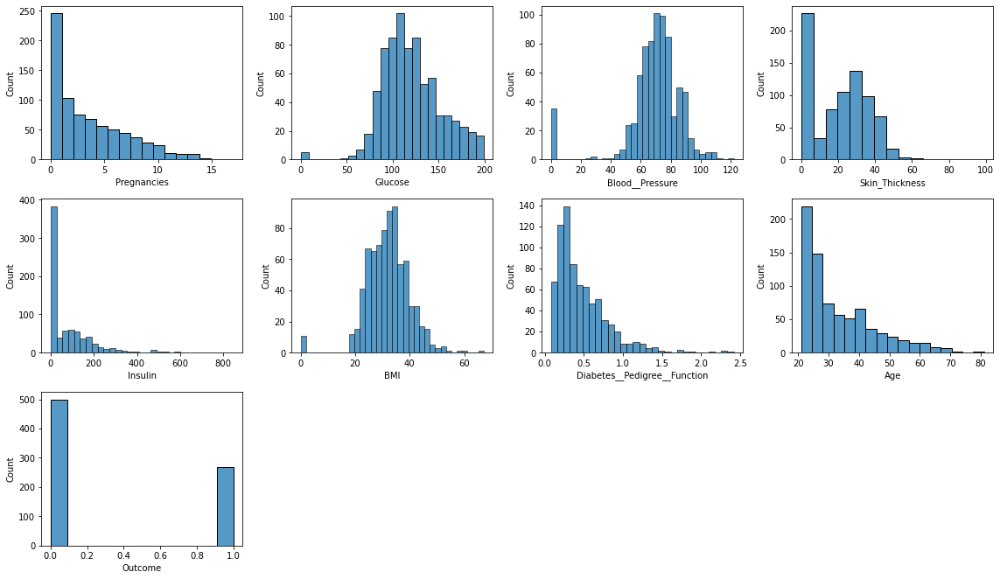

<IPython.core.display.Javascript object>

In [37]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(cols * 4, rows * 3))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

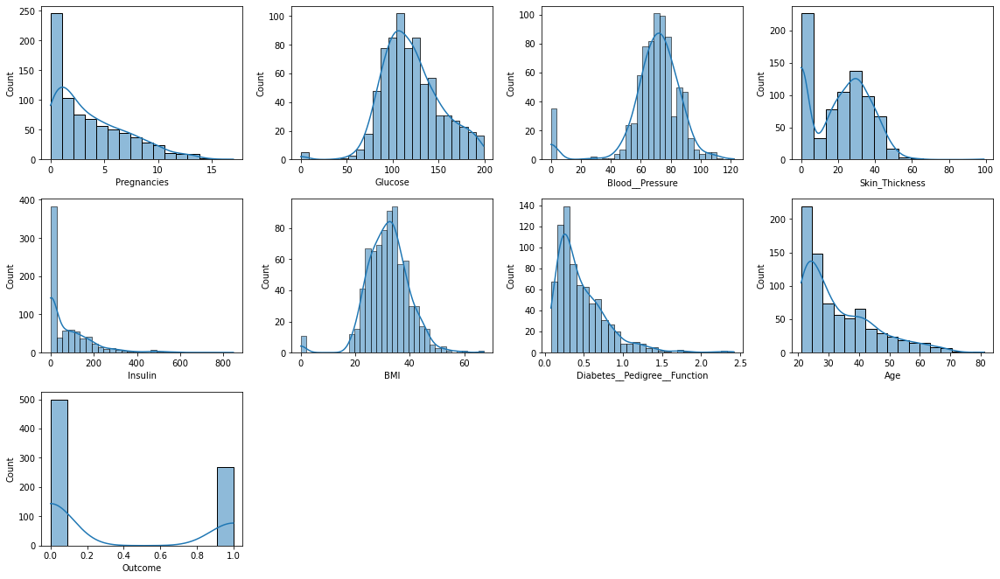

<IPython.core.display.Javascript object>

In [38]:
# Checking the histogram plot of numerical variables of the entire dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(cols * 4, rows * 3))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.histplot(x=data[col], kde=True, ax=ax)

fig.tight_layout()
plt.show()

image.png

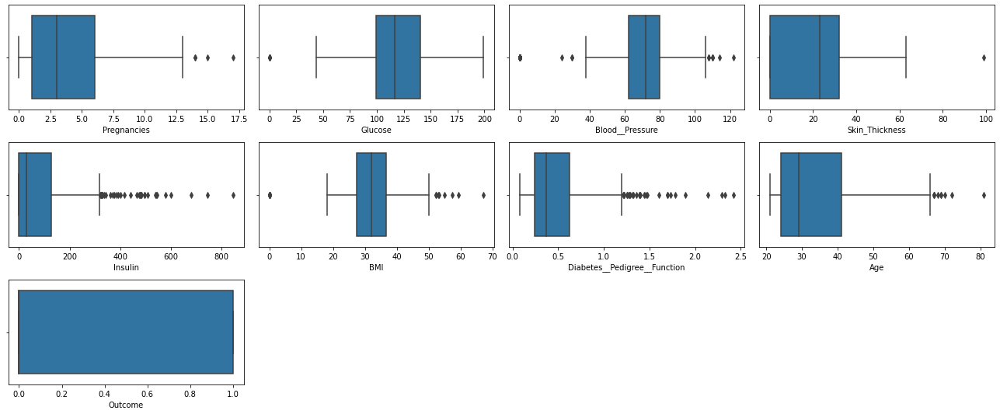

<IPython.core.display.Javascript object>

In [39]:
# Checking the boxplot of the numerical variable of the dataset
cols = 4
rows = 5
num_cols = data.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(18, 12))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.boxplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

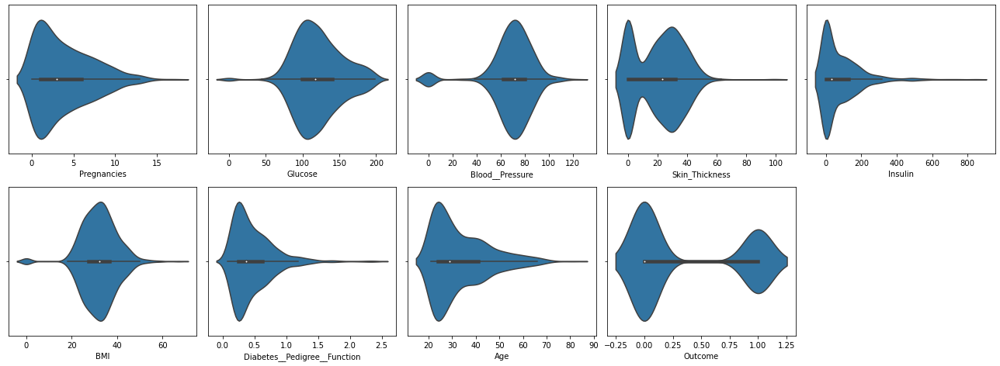

<IPython.core.display.Javascript object>

In [40]:
# Checking the voilin plot of the numerical variables
cols = 5
rows = 5
num_cols = data.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(18, 16))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.violinplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

image.png

## Detailed Univariate Analysis

In [41]:
df = data.copy()

<IPython.core.display.Javascript object>

### Univariate analysis

In [42]:
# function to plot a boxplot and a histogram along the same scale.


def histogram_boxplot(data, feature, figsize=(18, 8), kde=True, bins=None):
    """
    Boxplot and histogram combined

    data: dataframe
    feature: dataframe column
    figsize: size of figure (default (12,7))
    kde: whether to the show density curve (default False)
    bins: number of bins for histogram (default None)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        data=data, x=feature, ax=ax_box2, showmeans=True, color="red"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2, bins=bins, palette="winter"
    ) if bins else sns.histplot(
        data=data, x=feature, kde=kde, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        data[feature].mean(), color="green", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        data[feature].median(), color="indigo", linestyle="-"
    )  # Add median to the histogram

<IPython.core.display.Javascript object>

image.png

In [43]:
data.columns

Index(['Pregnancies', 'Glucose', 'Blood__Pressure', 'Skin_Thickness',
       'Insulin', 'BMI', 'Diabetes__Pedigree__Function', 'Age', 'Outcome'],
      dtype='object')

<IPython.core.display.Javascript object>

## Analysis of  Pregnancies Variable

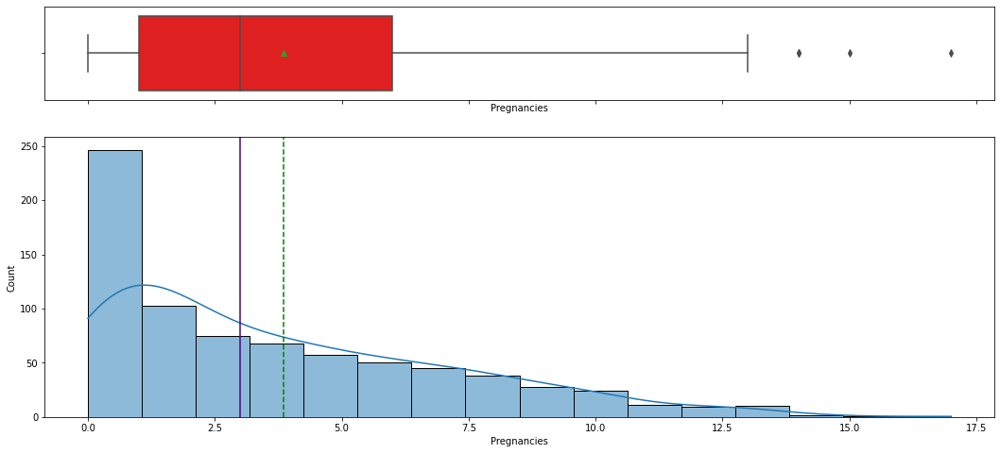

<IPython.core.display.Javascript object>

In [44]:
histogram_boxplot(data, "Pregnancies")

In [45]:
data["Pregnancies"].describe()

count   768.00
mean      3.85
std       3.37
min       0.00
25%       1.00
50%       3.00
75%       6.00
max      17.00
Name: Pregnancies, dtype: float64

<IPython.core.display.Javascript object>

In [46]:
data["Pregnancies"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25    1.00
0.50    3.00
0.60    4.00
0.75    6.00
0.90    9.00
0.95   10.00
0.99   13.00
Name: Pregnancies, dtype: float64

<IPython.core.display.Javascript object>

* The distribution of the number of pregnancies is right-skewed.
* The boxplot shows that there are few outliers to the right for this variable.
* From the boxplot, we can see that the third quartile (Q3) is approximately equal to 6 which means 75% of women have less than 6 pregnancies and an average of 4 pregnancies.

image.png

### Analysis of Glucose Variable

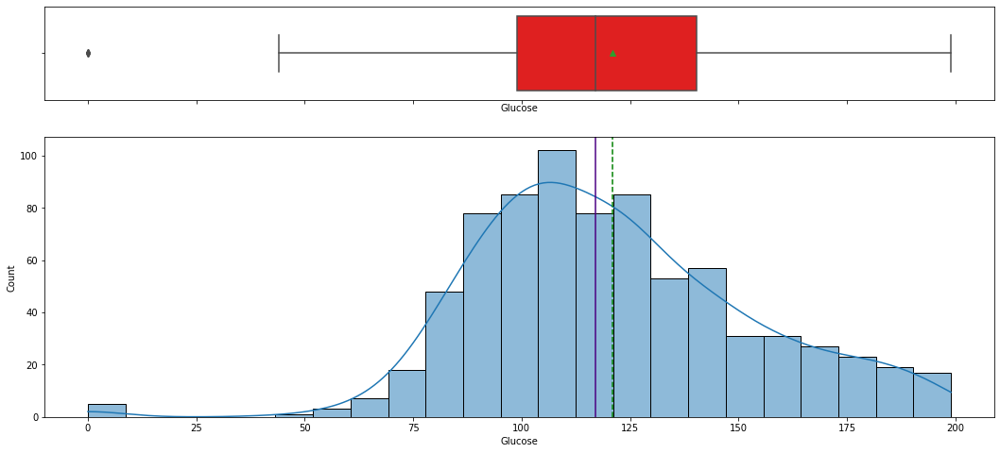

<IPython.core.display.Javascript object>

In [47]:
histogram_boxplot(data, "Glucose")

In [48]:
data["Glucose"].describe()

count   768.00
mean    120.89
std      31.97
min       0.00
25%      99.00
50%     117.00
75%     140.25
max     199.00
Name: Glucose, dtype: float64

<IPython.core.display.Javascript object>

In [49]:
data["Glucose"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25    99.00
0.50   117.00
0.60   125.00
0.75   140.25
0.90   167.00
0.95   181.00
0.99   196.00
Name: Glucose, dtype: float64

<IPython.core.display.Javascript object>

* The distribution of plasma glucose concentration looks like a bells-shaped curve i.e. fairly normal.
* The boxplot shows that 0 value is an outlier for this variable - but a 0 value of Glucose concentration is not possible we should treat the 0 values as missing data.
* From the boxplot, we can see that the third quartile (Q3) is equal to 140 which means 75% of women have less than 140 units of plasma glucose concentration.

image.png

## Anlaysis of Blood Pressure Variable



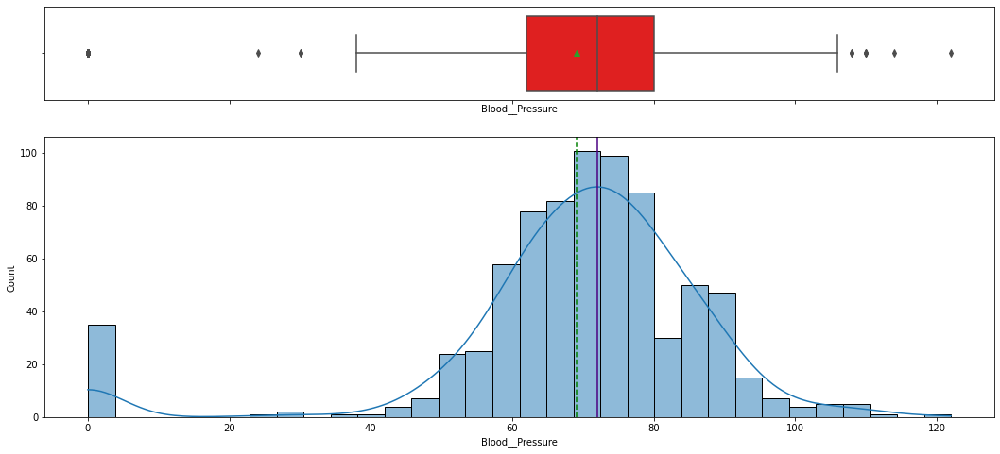

<IPython.core.display.Javascript object>

In [50]:
histogram_boxplot(data, "Blood__Pressure")

In [51]:
data["Blood__Pressure"].describe()

count   768.00
mean     69.11
std      19.36
min       0.00
25%      62.00
50%      72.00
75%      80.00
max     122.00
Name: Blood__Pressure, dtype: float64

<IPython.core.display.Javascript object>

In [52]:
data["Blood__Pressure"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25    62.00
0.50    72.00
0.60    74.00
0.75    80.00
0.90    88.00
0.95    90.00
0.99   106.00
Name: Blood__Pressure, dtype: float64

<IPython.core.display.Javascript object>

* The distribution for blood pressure looks fairly normal except few outliers evident from the boxplot.
* We can see that there are some observations with 0 blood pressure - but a 0 value of blood pressure is not possible and we should treat the 0 value as missing data.
* From the boxplot, we can see that the third quartile (Q3) is equal to 80 mmHg which means 75% of women have less than 80 mmHg of blood pressure and average blood pressure of 69 mmHg. We can say that most women have normal blood pressure.

image.png

## Analysis of Skin Thickness Variable

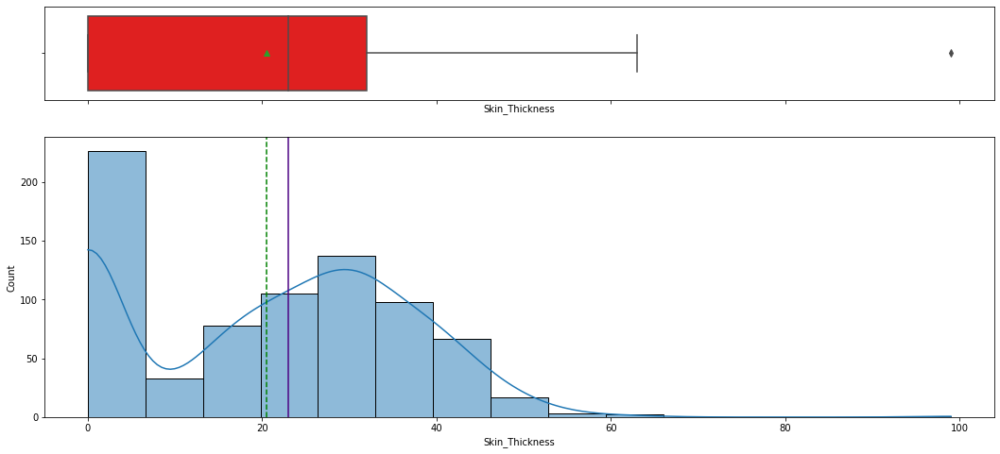

<IPython.core.display.Javascript object>

In [53]:
histogram_boxplot(data, "Skin_Thickness")

In [54]:
data[data["Skin_Thickness"] > 90]

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age,Outcome
579,2,197,70,99,0,34.70,0.57,62,1


<IPython.core.display.Javascript object>

In [55]:
data["Skin_Thickness"].describe()

count   768.00
mean     20.54
std      15.95
min       0.00
25%       0.00
50%      23.00
75%      32.00
max      99.00
Name: Skin_Thickness, dtype: float64

<IPython.core.display.Javascript object>

In [56]:
data["Skin_Thickness"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25    0.00
0.50   23.00
0.60   27.00
0.75   32.00
0.90   40.00
0.95   44.00
0.99   51.33
Name: Skin_Thickness, dtype: float64

<IPython.core.display.Javascript object>

* There is one extreme value of 99 in this variable. 
* There are much values with 0 value of skin thickness but a 0 value of skin thickness is not possible and we should treat the 0 values as missing data.
* From the boxplot, we can see that the third quartile (Q3) is equal to 32 mm, which means 75% of women have less than 32 mm of skin thickness and an average skin thickness of 21 mm.

image.png

## Analysis of Insulin Variable

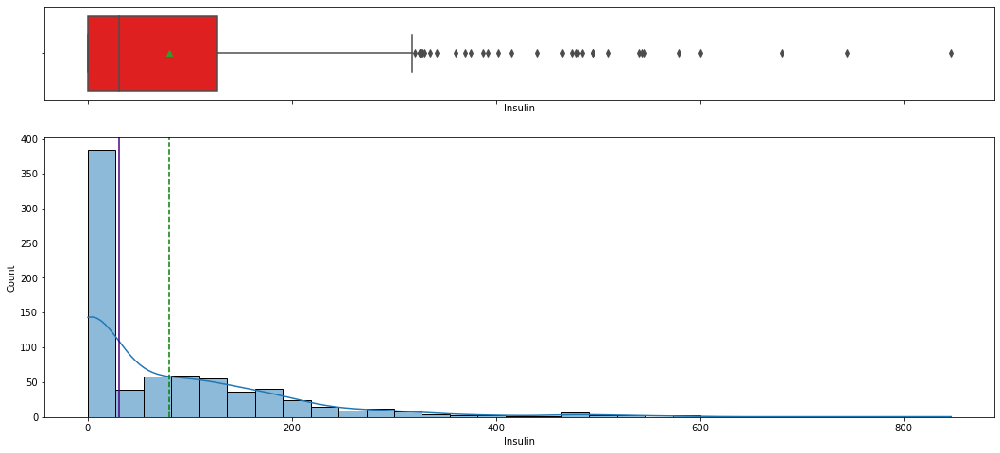

<IPython.core.display.Javascript object>

In [57]:
histogram_boxplot(data, "Insulin")

In [58]:
data["Insulin"].describe()

count   768.00
mean     79.80
std     115.24
min       0.00
25%       0.00
50%      30.50
75%     127.25
max     846.00
Name: Insulin, dtype: float64

<IPython.core.display.Javascript object>

In [59]:
data["Insulin"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25     0.00
0.50    30.50
0.60    72.20
0.75   127.25
0.90   210.00
0.95   293.00
0.99   519.90
Name: Insulin, dtype: float64

<IPython.core.display.Javascript object>

* The distribution of insulin is right-skewed.
* There are some outliers to the right in this variable.
* A 0 value in insulin is not possible. We should treat the 0 values as missing data.
* From the boxplot, we can see that the third quartile (Q3) is equal to 127 mu U/ml, which means 75% of women have less than 127 mu U/ml of insulin concentration and an average of 80 mu U/ml.

image.png

## Analysis of BMI Variable

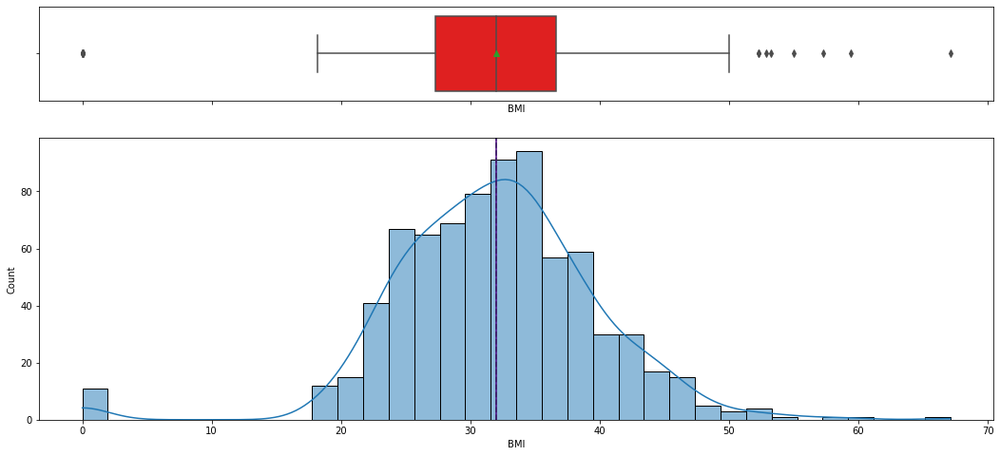

<IPython.core.display.Javascript object>

In [60]:
histogram_boxplot(data, "BMI")

In [61]:
data["BMI"].describe()

count   768.00
mean     31.99
std       7.88
min       0.00
25%      27.30
50%      32.00
75%      36.60
max      67.10
Name: BMI, dtype: float64

<IPython.core.display.Javascript object>

In [62]:
data["BMI"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25   27.30
0.50   32.00
0.60   33.70
0.75   36.60
0.90   41.50
0.95   44.39
0.99   50.76
Name: BMI, dtype: float64

<IPython.core.display.Javascript object>

#### Observation:

* The distribution of mass looks normally distributed with the mean and median of approximately 32.
* There are some outliers in this variable.
* A 0 value in mass is not possible we should treat the 0 values as missing data.

image.png



## Analysis of Diabetes Pedigree Function Variable

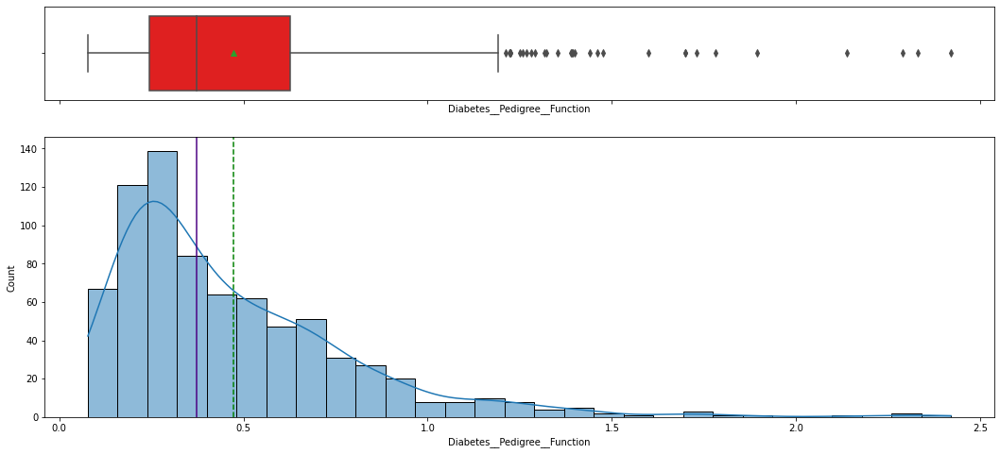

<IPython.core.display.Javascript object>

In [63]:
histogram_boxplot(data, "Diabetes__Pedigree__Function")

In [64]:
data["Diabetes__Pedigree__Function"].describe()

count   768.00
mean      0.47
std       0.33
min       0.08
25%       0.24
50%       0.37
75%       0.63
max       2.42
Name: Diabetes__Pedigree__Function, dtype: float64

<IPython.core.display.Javascript object>

In [65]:
data["Diabetes__Pedigree__Function"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25   0.24
0.50   0.37
0.60   0.45
0.75   0.63
0.90   0.88
0.95   1.13
0.99   1.70
Name: Diabetes__Pedigree__Function, dtype: float64

<IPython.core.display.Javascript object>

* The distribution is skewed to the right and there are some outliers in this variable.
* From the boxplot, we can see that the third quartile (Q3) is equal to 0.62 which means 75% of women have less than 0.62 diabetes pedigree function value and an average of 0.47.

## Analysis of  Age Variable

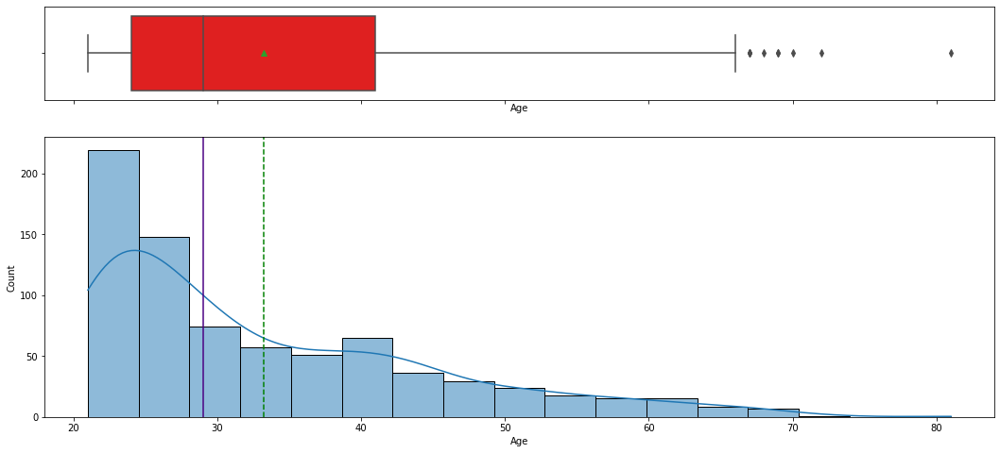

<IPython.core.display.Javascript object>

In [66]:
histogram_boxplot(data, "Age")

In [67]:
data["Age"].describe()

count   768.00
mean     33.24
std      11.76
min      21.00
25%      24.00
50%      29.00
75%      41.00
max      81.00
Name: Age, dtype: float64

<IPython.core.display.Javascript object>

In [68]:
data["Age"].quantile([0.25, 0.5, 0.6, 0.75, 0.9, 0.95, 0.99]).T

0.25   24.00
0.50   29.00
0.60   33.00
0.75   41.00
0.90   51.00
0.95   58.00
0.99   67.00
Name: Age, dtype: float64

<IPython.core.display.Javascript object>

* The distribution of age is right-skewed.
* There are outliers in this variable.
* From the boxplot, we can see that the third quartile (Q3) is equal to 41 which means 75% of women have less than 41 age in our data and the average age is 33 years.

In [69]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """

    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n],
    )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

<IPython.core.display.Javascript object>

### Observations of Diabetes Outcome

In [70]:
data["Outcome"].value_counts(1)

0   0.65
1   0.35
Name: Outcome, dtype: float64

<IPython.core.display.Javascript object>

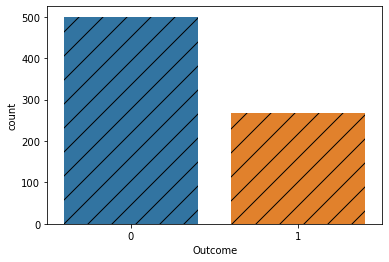

<IPython.core.display.Javascript object>

In [71]:
# Extracting the Case Status
plt.subplots(figsize = (6,4))
sns.countplot(data = data, x = 'Outcome', hatch="/");


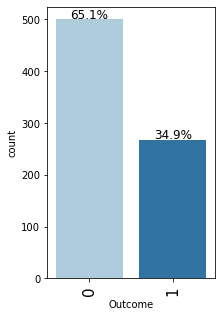

<IPython.core.display.Javascript object>

In [72]:
labeled_barplot(data, "Outcome", perc=True)

* The data is slightly imbalanced as there are only ~35% of the women in data who are diabetic and ~65% of women who are not diabetic.

### Observations of Pregnancies

In [73]:
data["Pregnancies"].value_counts(1)

1    0.18
0    0.14
2    0.13
3    0.10
4    0.09
5    0.07
6    0.07
7    0.06
8    0.05
9    0.04
10   0.03
11   0.01
13   0.01
12   0.01
14   0.00
15   0.00
17   0.00
Name: Pregnancies, dtype: float64

<IPython.core.display.Javascript object>

In [74]:
data["Pregnancies"].value_counts()

1     135
0     111
2     103
3      75
4      68
5      57
6      50
7      45
8      38
9      28
10     24
11     11
13     10
12      9
14      2
15      1
17      1
Name: Pregnancies, dtype: int64

<IPython.core.display.Javascript object>

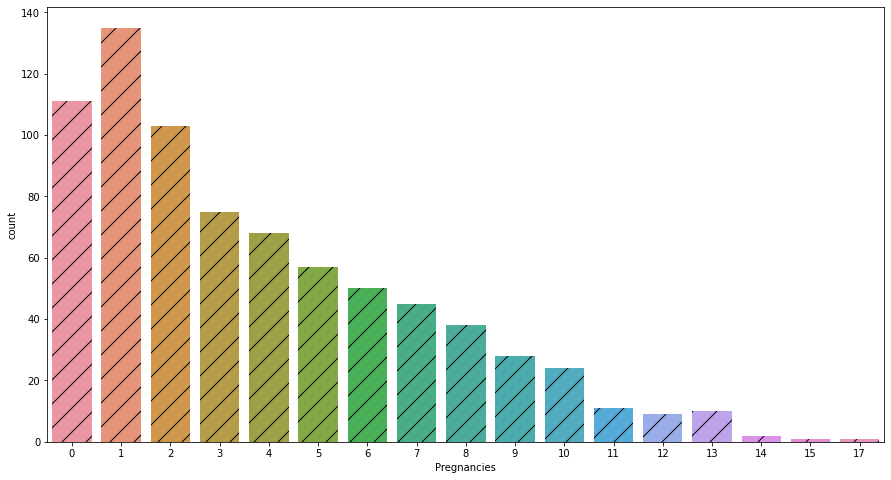

<IPython.core.display.Javascript object>

In [75]:
# Extracting the Case Status
plt.subplots(figsize = (15,8))
sns.countplot(data = data, x = 'Pregnancies', hatch="/");


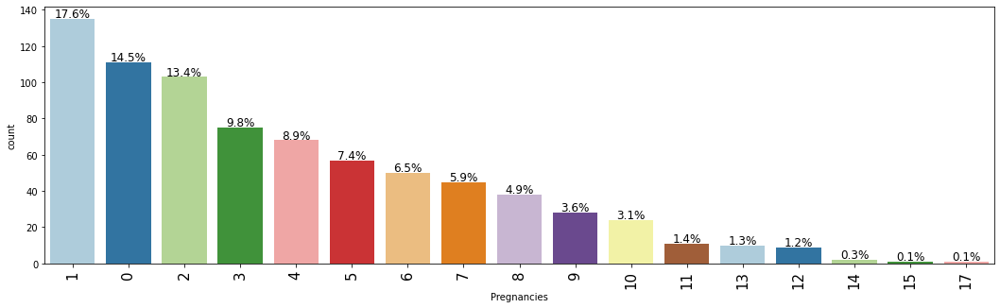

<IPython.core.display.Javascript object>

In [76]:
labeled_barplot(data, "Pregnancies", perc=True)

* The most common number of pregnancies amongst women is 1.
* Surprisingly, there are many observations with more than 10 pregnancies.

# Part III: EDA - Multivariate Data Analysis

## Boxplot Comparison Analysis

In [77]:
def stacked_barplot(data, predictor, target):
    """
    Print the category counts and plot a stacked bar chart

    data: dataframe
    predictor: independent variable
    target: target variable
    """
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab1 = pd.crosstab(data[predictor], data[target], margins=True).sort_values(
        by=sorter, ascending=False
    )
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(data[predictor], data[target], normalize="index").sort_values(
        by=sorter, ascending=False
    )
    tab.plot(kind="bar", stacked=True, figsize=(count + 3, 3))
    plt.legend(
        loc="lower left", frameon=False,
    )
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.show()

<IPython.core.display.Javascript object>

In [78]:
### function to plot distributions wrt target


def distribution_plot_wrt_target(data, predictor, target):

    fig, axs = plt.subplots(2, 2, figsize=(25, 9))

    target_uniq = data[target].unique()

    axs[0, 0].set_title("Distribution of target for target=" + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
        stat="density",
    )

    axs[0, 1].set_title("Distribution of target for target=" + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
        stat="density",
    )

    axs[1, 0].set_title("Boxplot w.r.t target")
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette="gist_rainbow")

    axs[1, 1].set_title("Boxplot (without outliers) w.r.t target")
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette="gist_rainbow",
    )

    plt.tight_layout()
    plt.show()

<IPython.core.display.Javascript object>

image.png

## Comparison of the Numerical Columns

In [79]:
# copying the data to another variable to avoid any changes to original data
df = data.copy()

<IPython.core.display.Javascript object>

In [80]:
# Extracting the columns of the entire datasets
df.columns

Index(['Pregnancies', 'Glucose', 'Blood__Pressure', 'Skin_Thickness',
       'Insulin', 'BMI', 'Diabetes__Pedigree__Function', 'Age', 'Outcome'],
      dtype='object')

<IPython.core.display.Javascript object>

In [81]:
# Extracting the numerical col of the datasets
col_var = [
    "Pregnancies",
    "Glucose",
    "Blood__Pressure",
    "Skin_Thickness",
    "Insulin",
    "BMI",
    "Diabetes__Pedigree__Function",
    "Age",
]

<IPython.core.display.Javascript object>

In [82]:
df[col_var].columns

Index(['Pregnancies', 'Glucose', 'Blood__Pressure', 'Skin_Thickness',
       'Insulin', 'BMI', 'Diabetes__Pedigree__Function', 'Age'],
      dtype='object')

<IPython.core.display.Javascript object>

image.png

### Pregnancies in Relation to Diabetes Outcome

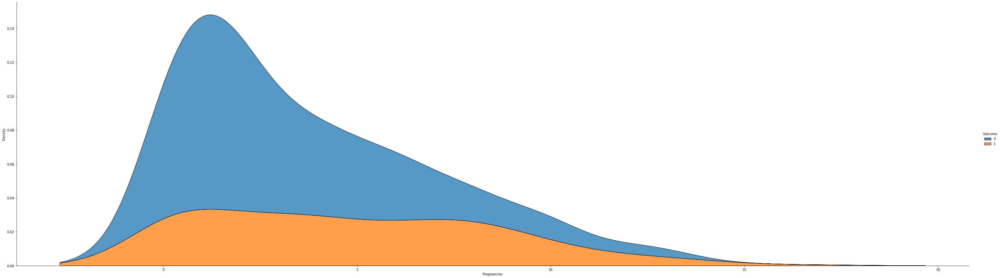

<IPython.core.display.Javascript object>

In [83]:
# Ploting a displot of Pregnancies vs Diabetes Outcome
sns.displot(
    data=df,
    x="Pregnancies",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [84]:
# Creating a sunburst chart for Pregnancies vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Pregnancies",
    color="Pregnancies",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Pregnancies'>

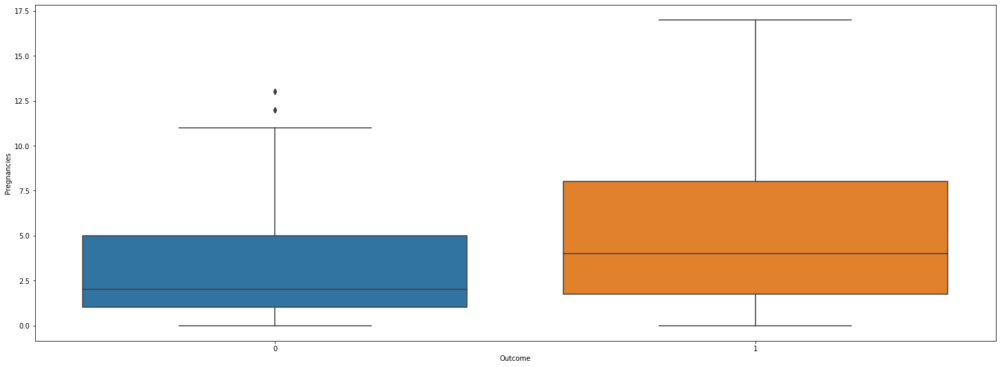

<IPython.core.display.Javascript object>

In [85]:
# Boxplot of Pregnancies vs Diabetes Outcome
plt.figure(figsize=(25, 9))
sns.boxplot(data=df, x="Outcome", y="Pregnancies")

In [86]:
# Creating summary statitics pivot table for Pregnancies vs Diabetes Outcome
Pregnancies = df.pivot_table(
    index=["Outcome"],
    values=["Pregnancies"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Pregnancies)

        Pregnancies                            
                max mean median  min  std   var
Outcome                                        
0             13.00 3.30   2.00 0.00 3.02  9.10
1             17.00 4.87   4.00 0.00 3.74 14.00


<IPython.core.display.Javascript object>

In [87]:
# comparing
data.groupby(["Outcome"])["Pregnancies"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,3.30,3.02,0.00,1.00,2.00,5.00,13.00
1,268.00,4.87,3.74,0.00,1.75,4.00,8.00,17.00


<IPython.core.display.Javascript object>

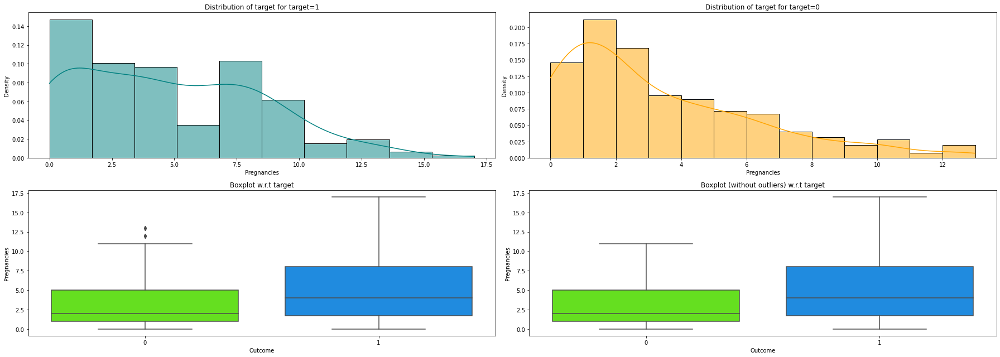

<IPython.core.display.Javascript object>

In [88]:
distribution_plot_wrt_target(
    data, "Pregnancies", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Glucose Level in Relation to Diabetes Outcome

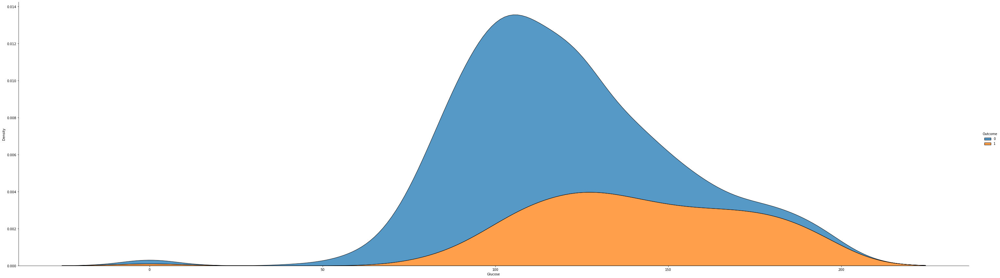

<IPython.core.display.Javascript object>

In [89]:
# Ploting a displot of Glucose vs Diabetes Outcome
sns.displot(
    data=df,
    x="Glucose",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [90]:
# Creating a sunburst chart of Glucose vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Glucose",
    color="Glucose",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Glucose'>

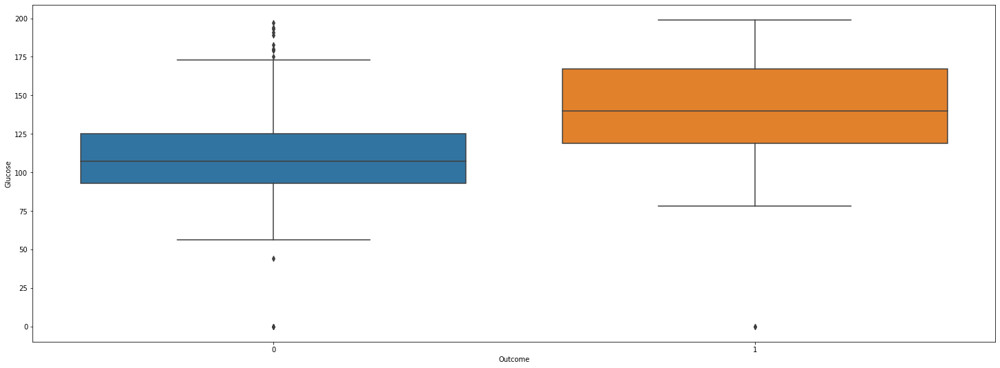

<IPython.core.display.Javascript object>

In [91]:
# Boxplot of Glucose vs Diabetes Outcome
plt.figure(figsize=(25, 9))
sns.boxplot(data=df, x="Outcome", y="Glucose")

In [92]:
# Creating summary statitics pivot table for Glucose vs Diabetes Outcome
Glucose = df.pivot_table(
    index=["Outcome"],
    values=["Glucose"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Glucose)

        Glucose                                 
            max   mean median  min   std     var
Outcome                                         
0        197.00 109.98 107.00 0.00 26.14  683.36
1        199.00 141.26 140.00 0.00 31.94 1020.14


<IPython.core.display.Javascript object>

In [93]:
# comparing
data.groupby(["Outcome"])["Glucose"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,109.98,26.14,0.00,93.00,107.00,125.00,197.00
1,268.00,141.26,31.94,0.00,119.00,140.00,167.00,199.00


<IPython.core.display.Javascript object>

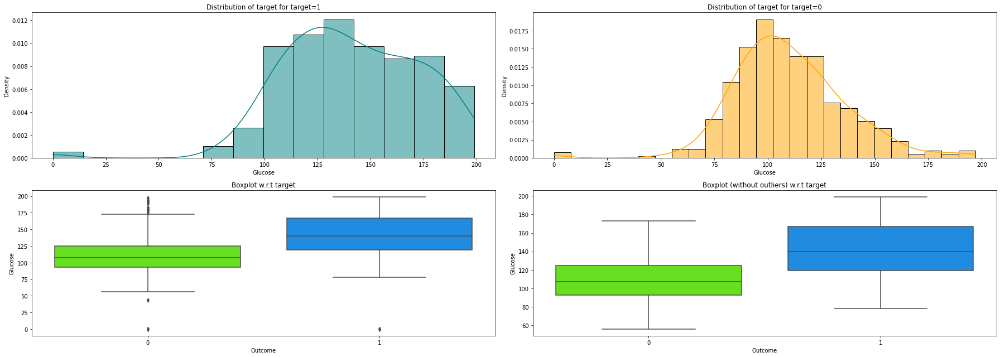

<IPython.core.display.Javascript object>

In [94]:
distribution_plot_wrt_target(
    data, "Glucose", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Blood Pressure in Relation to Diabetes Outcome

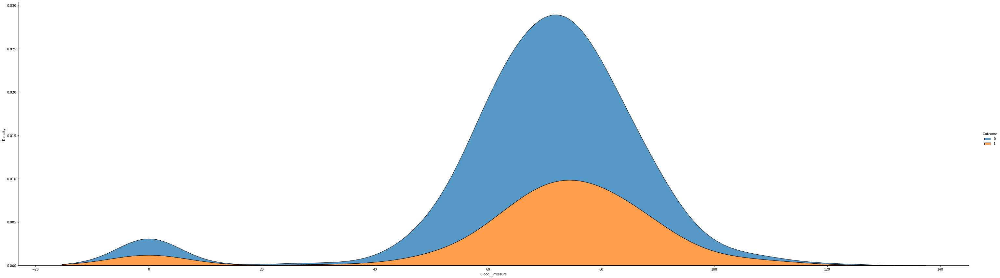

<IPython.core.display.Javascript object>

In [95]:
# Ploting a displot of Blood Pressure vs Diabetes Outcome
sns.displot(
    data=df,
    x="Blood__Pressure",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [96]:
# Creating a sunburst chart for Blood Pressure vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Blood__Pressure",
    color="Blood__Pressure",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Blood__Pressure'>

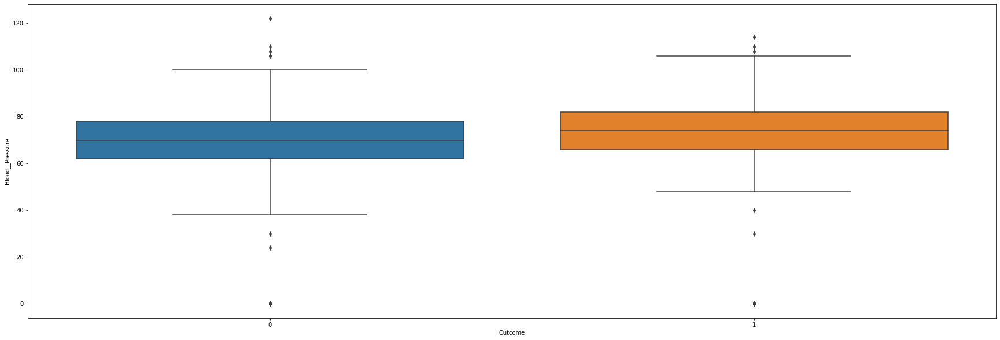

<IPython.core.display.Javascript object>

In [97]:
# Boxplot of Blood Pressure vs Diabetes Outcome
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="Outcome", y="Blood__Pressure")

In [98]:
# Creating summary statitics pivot taable for Blood Pressure vs Diabetes Outcome
Blood__Pressure = df.pivot_table(
    index=["Outcome"],
    values=["Blood__Pressure"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Blood__Pressure)

        Blood__Pressure                               
                    max  mean median  min   std    var
Outcome                                               
0                122.00 68.18  70.00 0.00 18.06 326.27
1                114.00 70.82  74.00 0.00 21.49 461.90


<IPython.core.display.Javascript object>

In [99]:
# comparing
data.groupby(["Outcome"])["Blood__Pressure"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,68.18,18.06,0.00,62.00,70.00,78.00,122.00
1,268.00,70.82,21.49,0.00,66.00,74.00,82.00,114.00


<IPython.core.display.Javascript object>

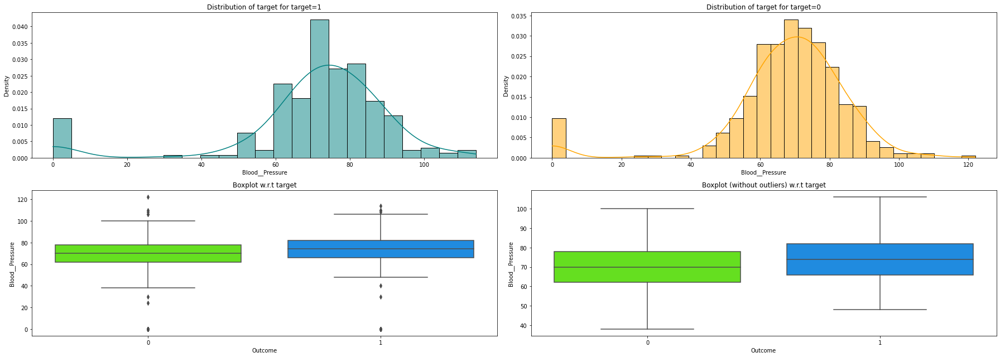

<IPython.core.display.Javascript object>

In [100]:
distribution_plot_wrt_target(
    data, "Blood__Pressure", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Skin_Thickness in Relation to Diabetes Outcome

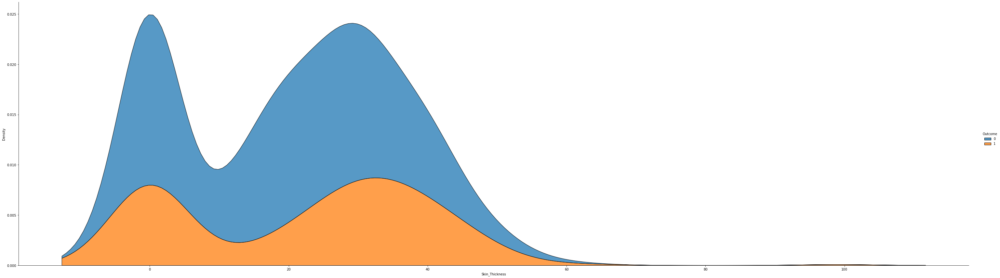

<IPython.core.display.Javascript object>

In [101]:
# Ploting a displot of  Skin_Thickness vs Diabetes Outcome
sns.displot(
    data=df,
    x="Skin_Thickness",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [102]:
# Creating a sunburst chart for  Skin_Thickness vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    data,
    path=["Outcome"],
    values="Skin_Thickness",
    color="Skin_Thickness",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Skin_Thickness'>

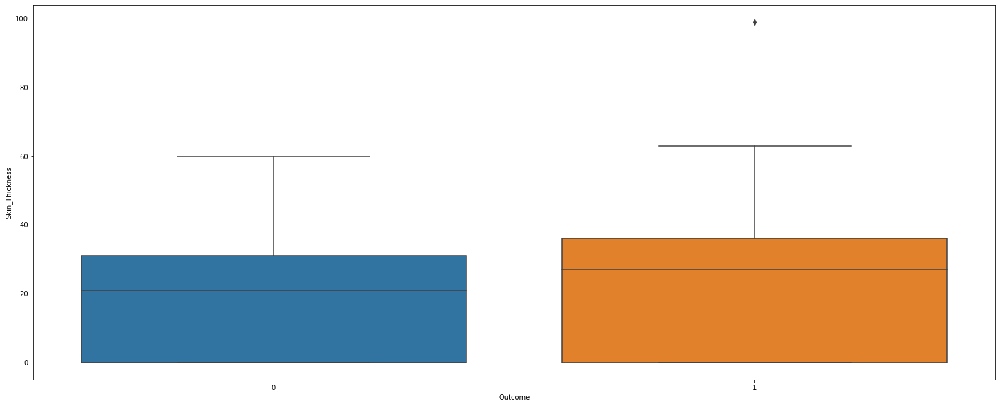

<IPython.core.display.Javascript object>

In [103]:
#  Boxplot of  Skin_Thickness vs Diabetes Outcome
plt.figure(figsize=(25, 10))
sns.boxplot(data=df, x="Outcome", y="Skin_Thickness")

In [104]:
# Creating summary statitics pivot taable for Skin_Thickness vs Diabetes Outcome
Skin_Thickness = df.pivot_table(
    index=["Outcome"],
    values=["Skin_Thickness"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Skin_Thickness)

        Skin_Thickness                               
                   max  mean median  min   std    var
Outcome                                              
0                60.00 19.66  21.00 0.00 14.89 221.71
1                99.00 22.16  27.00 0.00 17.68 312.57


<IPython.core.display.Javascript object>

In [105]:
# comparing
data.groupby(["Outcome"])["Skin_Thickness"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,19.66,14.89,0.00,0.00,21.00,31.00,60.00
1,268.00,22.16,17.68,0.00,0.00,27.00,36.00,99.00


<IPython.core.display.Javascript object>

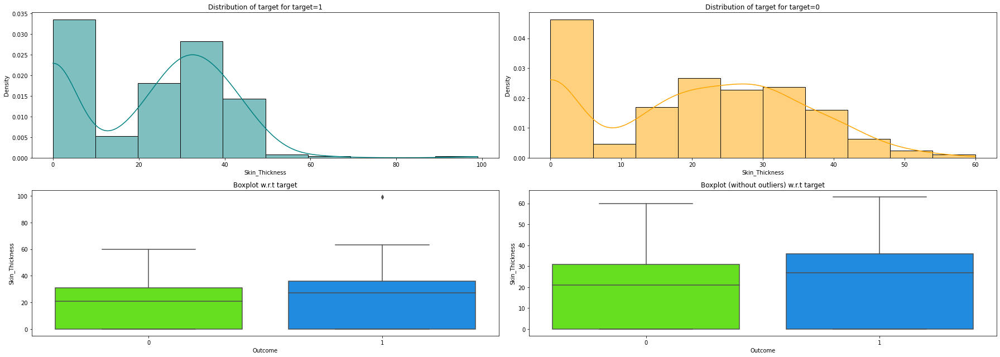

<IPython.core.display.Javascript object>

In [106]:
distribution_plot_wrt_target(
    data, "Skin_Thickness", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Insulin in Relation to Diabetes Outcome

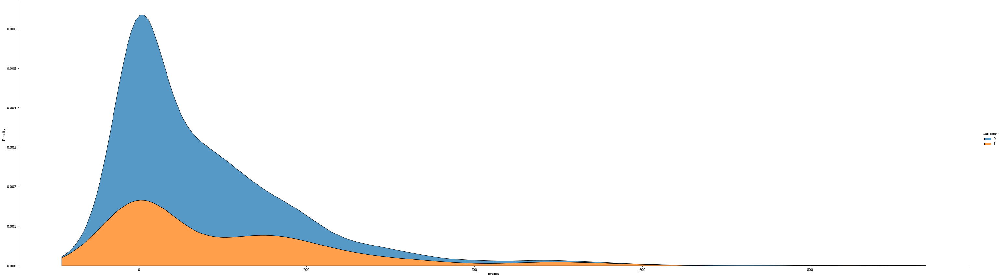

<IPython.core.display.Javascript object>

In [107]:
# Ploting a displot of Insulin vs Diabetes Outcome
sns.displot(
    data=df,
    x="Insulin",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [108]:
# Creating a sunburst chart for Insulin vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Insulin",
    color="Insulin",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Insulin'>

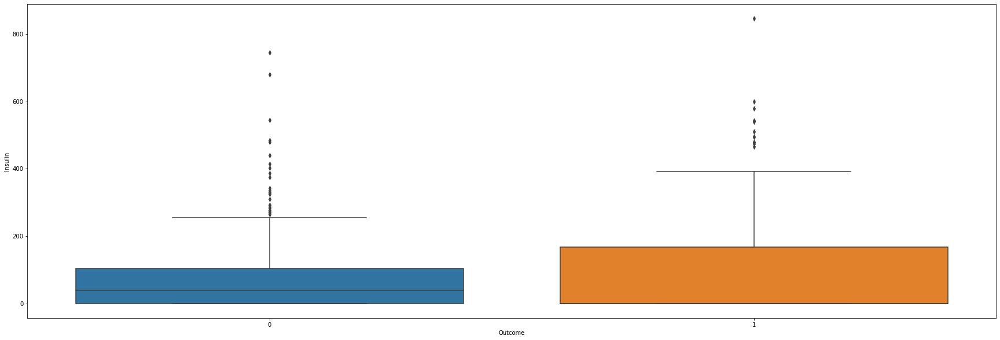

<IPython.core.display.Javascript object>

In [109]:
# Boxplot of Insulin vs Diabetes Outcome
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="Outcome", y="Insulin")

In [110]:
# Creating summary statitics pivot taable for Insulin vs Diabetes Outcome
Insulin = df.pivot_table(
    index=["Outcome"],
    values=["Insulin"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Insulin)

        Insulin                                   
            max   mean median  min    std      var
Outcome                                           
0        744.00  68.79  39.00 0.00  98.87  9774.35
1        846.00 100.34   0.00 0.00 138.69 19234.67


<IPython.core.display.Javascript object>

In [111]:
# comparing
data.groupby(["Outcome"])["Insulin"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,68.79,98.87,0.00,0.00,39.00,105.00,744.00
1,268.00,100.34,138.69,0.00,0.00,0.00,167.25,846.00


<IPython.core.display.Javascript object>

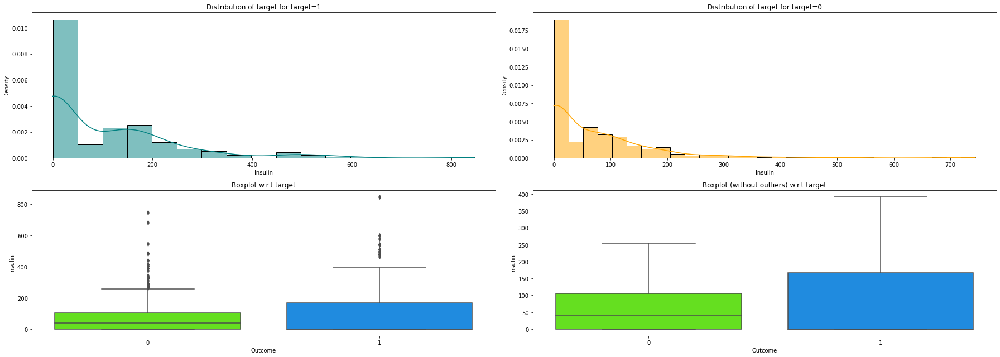

<IPython.core.display.Javascript object>

In [112]:
distribution_plot_wrt_target(
    data, "Insulin", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Body Mass Index(BMI) in Relation to Diabetes Outcome

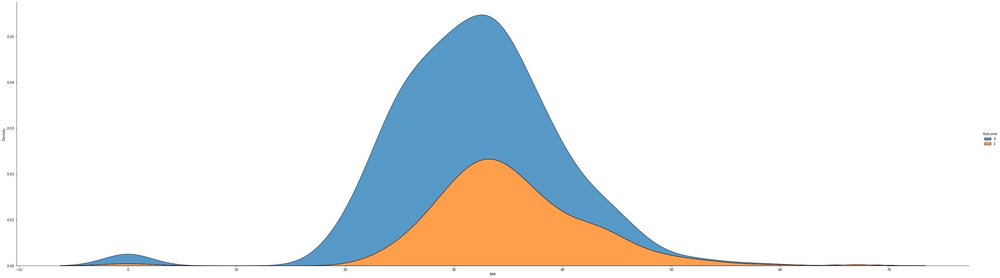

<IPython.core.display.Javascript object>

In [113]:
# Ploting a displot of BMI vs Diabetes Outcome
sns.displot(
    data=df,
    x="BMI",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [114]:
# Creating a sunburst chart for BMI vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="BMI",
    color="BMI",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='BMI'>

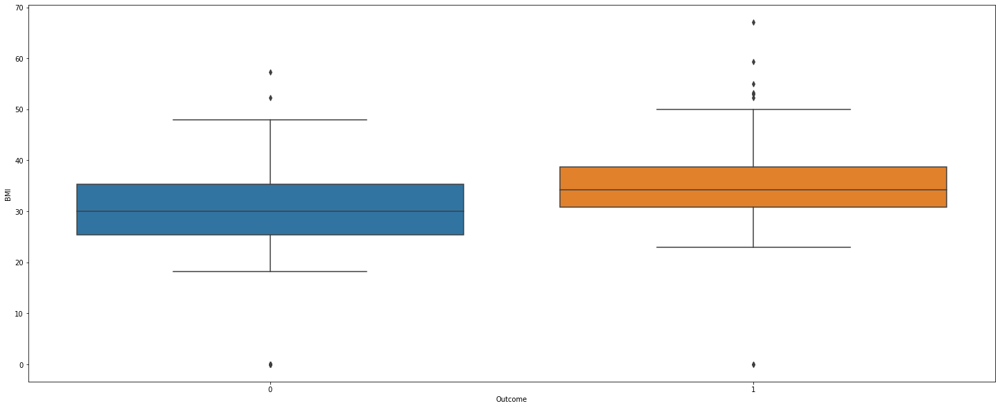

<IPython.core.display.Javascript object>

In [115]:
# Boxplot of BMI vs Diabetes Outcome
plt.figure(figsize=(25, 10))
sns.boxplot(data=df, x="Outcome", y="BMI")

In [116]:
# Creating summary statitics pivot taable for BMI vs Diabetes Outcome
BMI = df.pivot_table(
    index=["Outcome"],
    values=["BMI"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(BMI)

          BMI                             
          max  mean median  min  std   var
Outcome                                   
0       57.30 30.30  30.05 0.00 7.69 59.13
1       67.10 35.14  34.25 0.00 7.26 52.75


<IPython.core.display.Javascript object>

In [117]:
# comparing
data.groupby(["Outcome"])["BMI"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,30.30,7.69,0.00,25.40,30.05,35.30,57.30
1,268.00,35.14,7.26,0.00,30.80,34.25,38.78,67.10


<IPython.core.display.Javascript object>

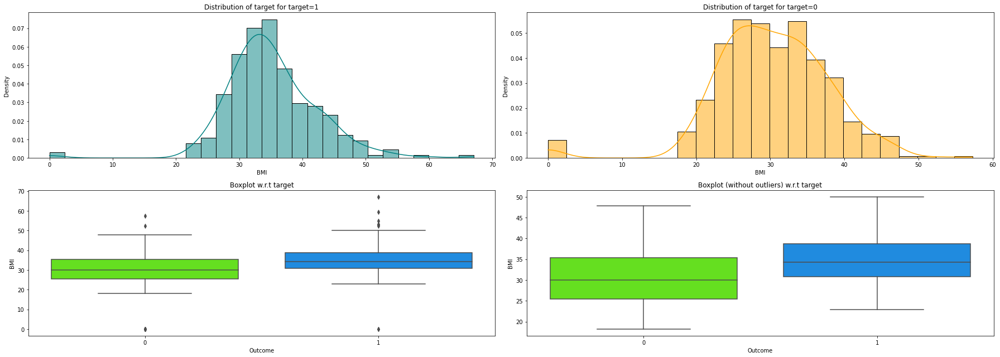

<IPython.core.display.Javascript object>

In [118]:
distribution_plot_wrt_target(
    data, "BMI", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Diabetes Pedigree Function in Relation to Diabetes Outcome

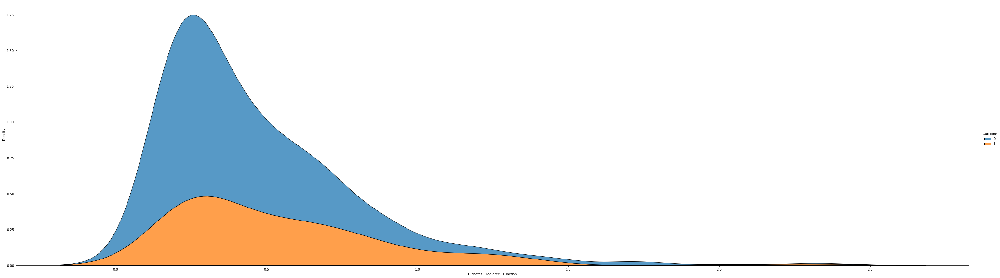

<IPython.core.display.Javascript object>

In [119]:
# Ploting a displot of Diabetes Pedigree Function vs Diabetes Outcome
sns.displot(
    data=df,
    x="Diabetes__Pedigree__Function",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [120]:
# Creating a sunburst of Diabetes Pedigree Function vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Diabetes__Pedigree__Function",
    color="Diabetes__Pedigree__Function",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Diabetes__Pedigree__Function'>

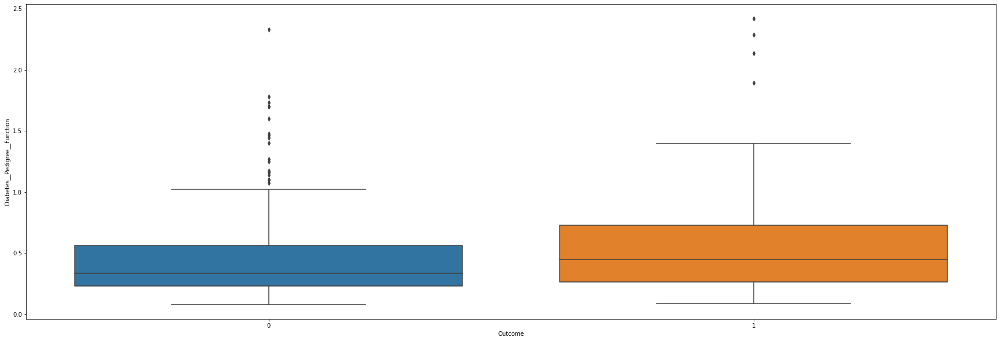

<IPython.core.display.Javascript object>

In [121]:
# Boxplot of Diabetes Pedigree Function vs Diabetes Outcome
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="Outcome", y="Diabetes__Pedigree__Function")

In [122]:
# Creating summary statitics pivot taable for Diabetes Pedigree Function vs Diabetes Outcome
DPF = df.pivot_table(
    index=["Outcome"],
    values=["Diabetes__Pedigree__Function"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(DPF)

        Diabetes__Pedigree__Function                           
                                 max mean median  min  std  var
Outcome                                                        
0                               2.33 0.43   0.34 0.08 0.30 0.09
1                               2.42 0.55   0.45 0.09 0.37 0.14


<IPython.core.display.Javascript object>

In [123]:
# comparing
data.groupby(["Outcome"])["Diabetes__Pedigree__Function"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,0.43,0.30,0.08,0.23,0.34,0.56,2.33
1,268.00,0.55,0.37,0.09,0.26,0.45,0.73,2.42


<IPython.core.display.Javascript object>

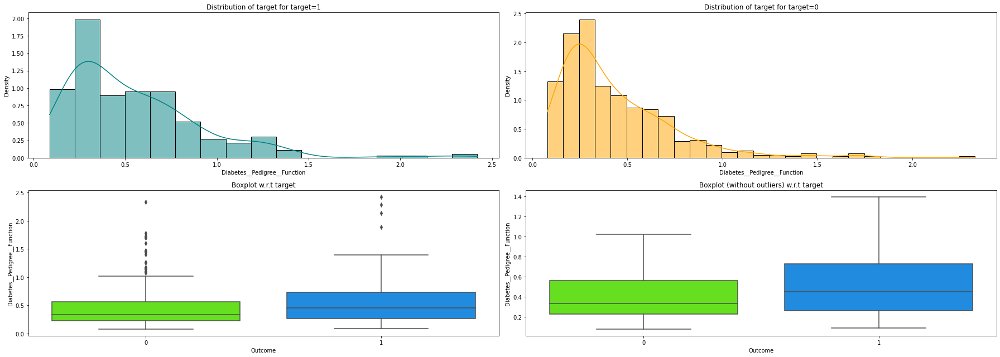

<IPython.core.display.Javascript object>

In [124]:
distribution_plot_wrt_target(
    data, "Diabetes__Pedigree__Function", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

image.png

### Age in Relation to Diabetes Outcome

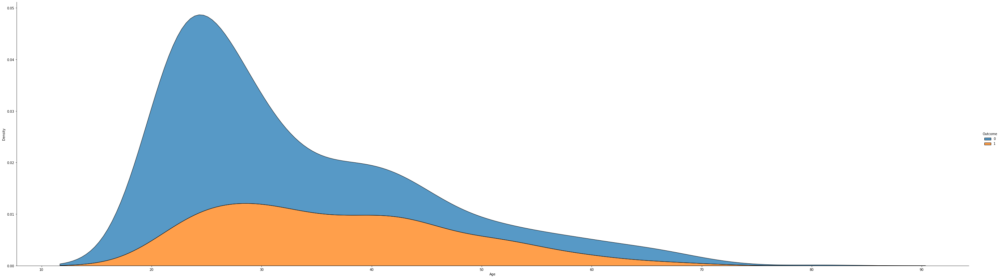

<IPython.core.display.Javascript object>

In [125]:
# Ploting a displot of Age vs Diabetes Outcome
sns.displot(
    data=df,
    x="Age",
    hue="Outcome",
    multiple="stack",
    kind="kde",
    height=12,
    aspect=3.5,
)

In [126]:
# Creating a sunburst chart for Age vs Diabetes Outcome
import plotly.express as px

fig = px.sunburst(
    df,
    path=["Outcome"],
    values="Age",
    color="Age",
    color_discrete_map={"(?)": "red", "Lunch": "gold", "Dinner": "green"},
)
fig.show()

<IPython.core.display.Javascript object>

<AxesSubplot:xlabel='Outcome', ylabel='Age'>

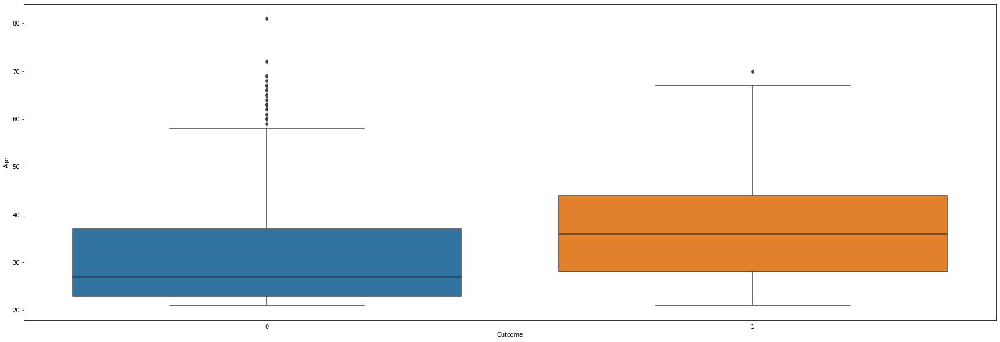

<IPython.core.display.Javascript object>

In [127]:
# Boxplot of Age vs Diabetes Outcome
plt.figure(figsize=(30, 10))
sns.boxplot(data=df, x="Outcome", y="Age")

In [128]:
# Creating summary statitics pivot table for Age vs Diabetes Outcome
Age = df.pivot_table(
    index=["Outcome"],
    values=["Age"],
    aggfunc={"max", "median", "mean", "std", "var", "min"},
)
print(Age)

          Age                                
          max  mean median   min   std    var
Outcome                                      
0       81.00 31.19  27.00 21.00 11.67 136.13
1       70.00 37.07  36.00 21.00 10.97 120.30


<IPython.core.display.Javascript object>

In [129]:
# comparing
data.groupby(["Outcome"])["Age"].describe()

,count,mean,std,min,25%,50%,75%,max
Outcome,,,,,,,,
0,500.00,31.19,11.67,21.00,23.00,27.00,37.00,81.00
1,268.00,37.07,10.97,21.00,28.00,36.00,44.00,70.00


<IPython.core.display.Javascript object>

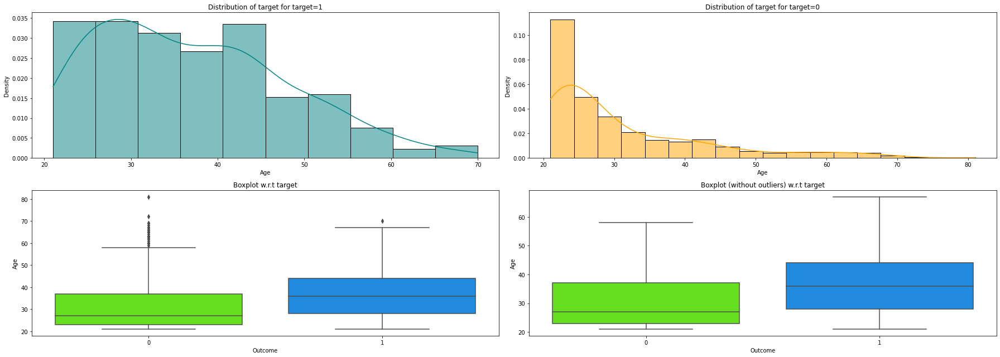

<IPython.core.display.Javascript object>

In [130]:
distribution_plot_wrt_target(
    data, "Age", "Outcome"
)  ## Complete the code to find distribution of prevailing wage and case status

#### General Observation

- hh

image.png

## Correlation and Pairplot Analysis

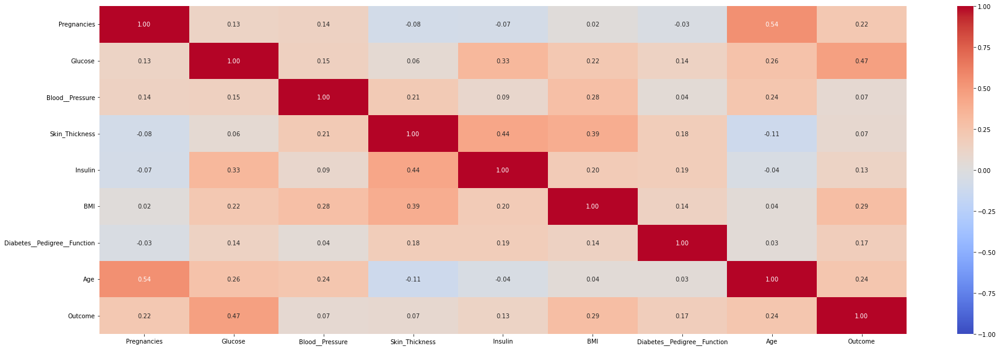

<IPython.core.display.Javascript object>

In [131]:
# Displaying the correlation between numerical variables of the dataset
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="coolwarm")
plt.show()

image.png

<AxesSubplot:>

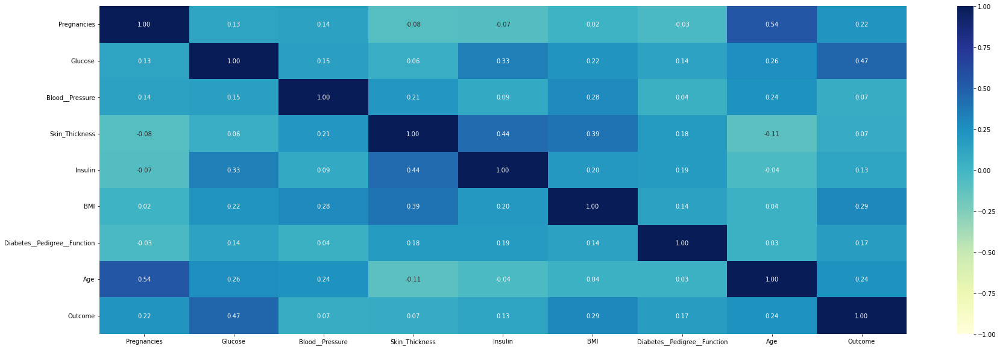

<IPython.core.display.Javascript object>

In [132]:
# creates heatmap showing correlation of numeric columns in data
plt.figure(figsize=(30, 10))
sns.heatmap(df.corr(), vmin=-1, vmax=1, cmap="YlGnBu", annot=True, fmt=".2f")

image.png

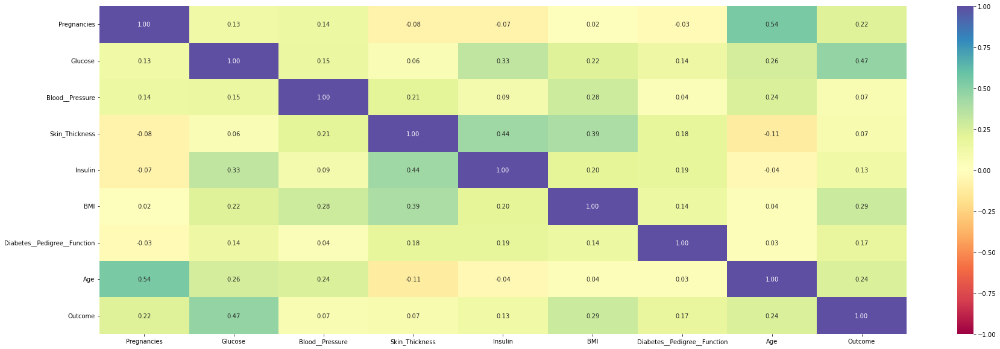

<IPython.core.display.Javascript object>

In [133]:
cols_list = data.select_dtypes(include=np.number).columns.tolist()

plt.figure(figsize=(30, 10))
sns.heatmap(
    data[cols_list].corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral"
)  ## Complete the code to find the correlation between the variables
plt.show()

image.png

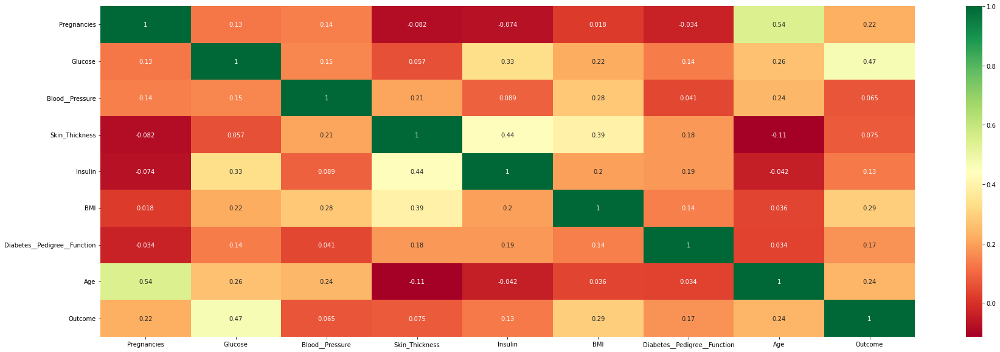

<IPython.core.display.Javascript object>

In [134]:
# using heatmap
correlation = data.corr()  # creating a 2-D Matrix with correlation plots
plt.figure(figsize=(30, 10))
sns.heatmap(correlation, annot=True, cmap="RdYlGn")

image.png

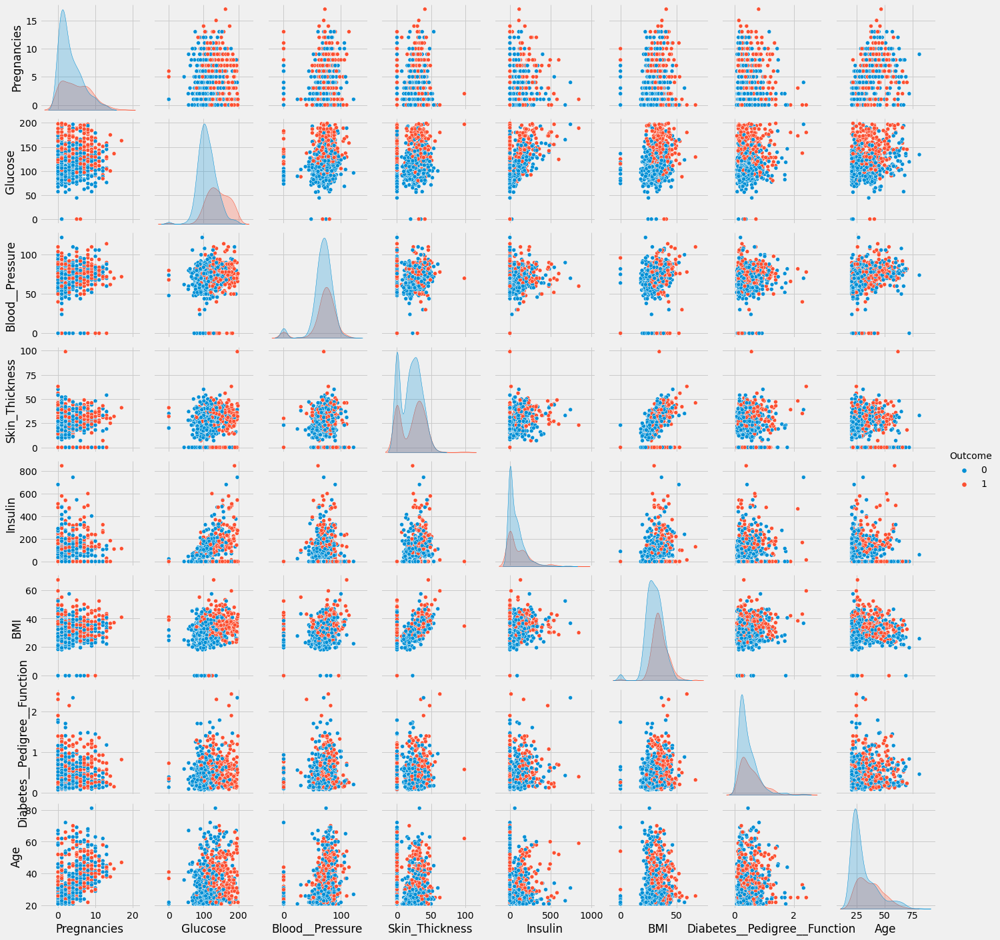

<IPython.core.display.Javascript object>

In [135]:
plt.style.use("fivethirtyeight")
sns.pairplot(df, hue="Outcome", vars=df.columns[:8], diag_kind="kde")

image.png

In [136]:
# correlation betweon one column and the rest
df.corr()["Outcome"]

Pregnancies                    0.22
Glucose                        0.47
Blood__Pressure                0.07
Skin_Thickness                 0.07
Insulin                        0.13
BMI                            0.29
Diabetes__Pedigree__Function   0.17
Age                            0.24
Outcome                        1.00
Name: Outcome, dtype: float64

<IPython.core.display.Javascript object>

image.png

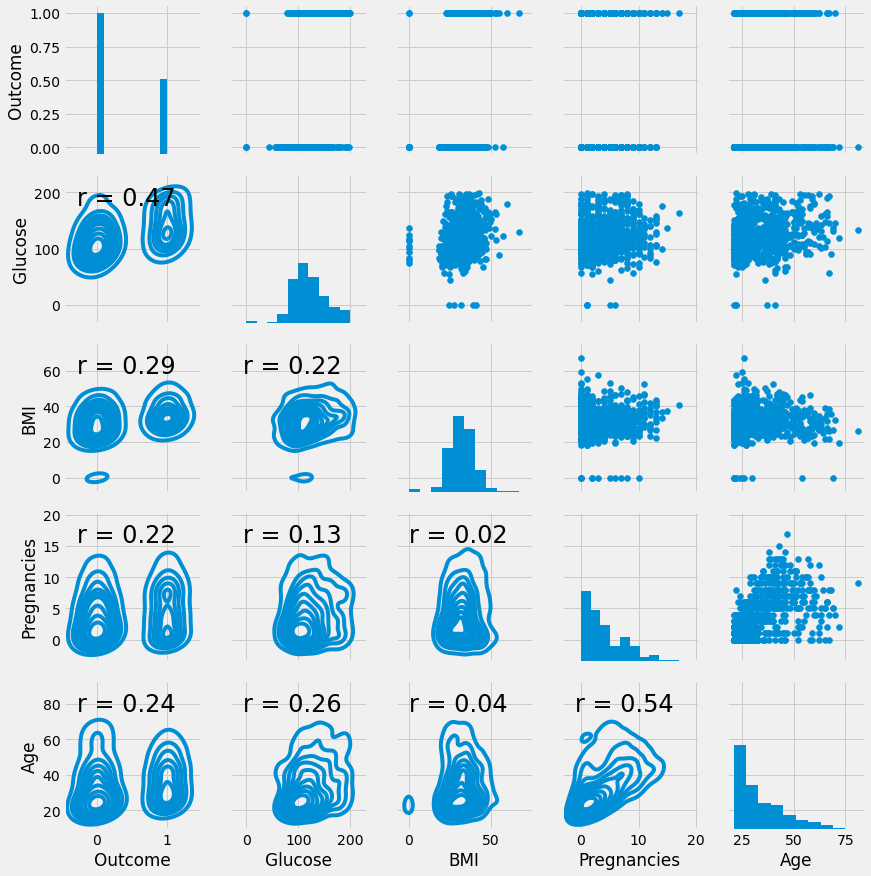

<IPython.core.display.Javascript object>

In [137]:
import scipy

# Function to calculate correlation coefficient between two variables
def corrfunc(x, y, **kwgs):
    r = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(r), xy=(0.1, 0.8), xycoords=ax.transAxes, size=24)


# Create a PairGrid
g = sns.PairGrid(data=df, vars=["Outcome", "Glucose", "BMI", "Pregnancies", "Age"])

# Map a scatterplot to the upper triangle
g.map_upper(plt.scatter)

# Map a histogram to the diagonal
g.map_diag(plt.hist)

# Map a kde plot to the lower triangle
g.map_lower(sns.kdeplot)

# Map the correlation coefficient to the lower diagonal
g.map_lower(corrfunc)

image.png

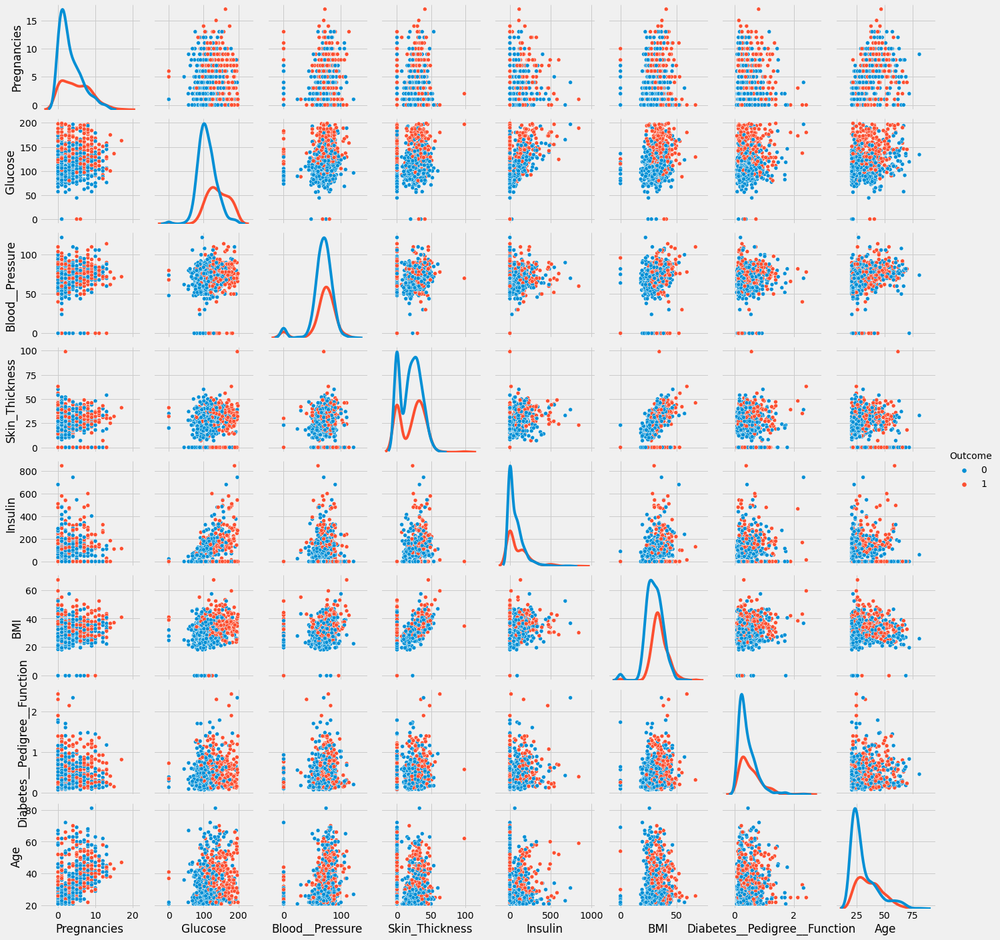

<IPython.core.display.Javascript object>

In [138]:
import seaborn as sns

sns.pairplot(df, hue="Outcome", diag_kind="kde", diag_kws=dict(fill=False))
plt.show()

**Observations-**
* Dependent variable class shows a moderate correlation with 'Glucose'.
* There is a positive correlation between age and the number of pregnancies which makes sense.
* Insulin and skin thickness also shows a moderate positive correlation.

image.png

# Part VI: Data Preparation for Model Building

image.png

#### Notes

- ***Feature engineering includes all the steps required to prepare the data i.e outlier treatment, data cleaning, and scaling. Hyperparameter tuning is not a part of feature engineering.***

**Let's check the count of each unique category in each of the categorical variables.** 

In [139]:
df = data.copy()

<IPython.core.display.Javascript object>

In [140]:
# Extracting the zero observations in the Glucose Variable
df.loc[data.Glucose == 0, "Glucose"]

75     0
182    0
342    0
349    0
502    0
Name: Glucose, dtype: int64

<IPython.core.display.Javascript object>

In [141]:
# Extracting the missing values in the dataset
data.isnull().sum()

Pregnancies                     0
Glucose                         0
Blood__Pressure                 0
Skin_Thickness                  0
Insulin                         0
BMI                             0
Diabetes__Pedigree__Function    0
Age                             0
Outcome                         0
dtype: int64

<IPython.core.display.Javascript object>

In [142]:
# Checking the total number of missing values in the dataset
df.isnull().sum().sum()

0

<IPython.core.display.Javascript object>

## Outlier Detection and Treatment

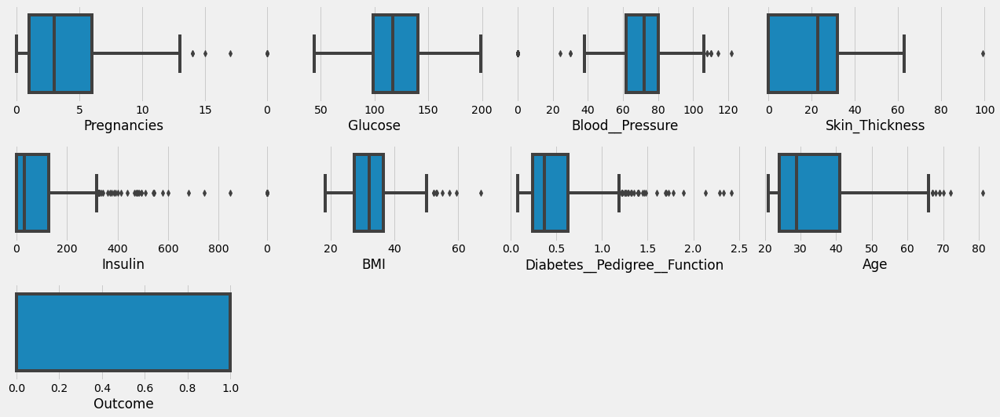

<IPython.core.display.Javascript object>

In [143]:
# Checking the boxplot of the numerical variable of the dataset
cols = 4
rows = 5
num_cols = df.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(18, 12))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.boxplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

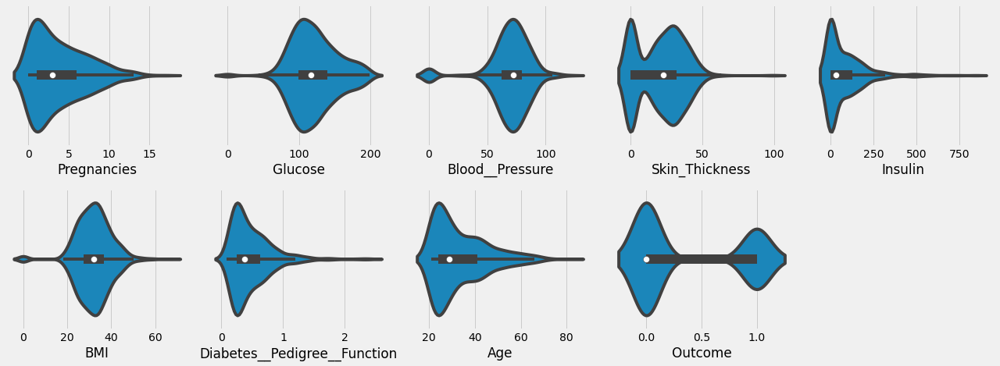

<IPython.core.display.Javascript object>

In [144]:
# Checking the voilin plot of the numerical variables
cols = 5
rows = 5
num_cols = df.select_dtypes(exclude="category").columns
fig = plt.figure(figsize=(18, 16))
for i, col in enumerate(num_cols):

    ax = fig.add_subplot(rows, cols, i + 1)

    sns.violinplot(x=data[col], ax=ax)

fig.tight_layout()
plt.show()

- There are quite a few outliers in the data.
- However, we will not treat them as they are proper values.

#### Observations

- jj

image.png

### Data Preparation for modeling

- We want to predict which visa will be certified.
- Before we proceed to build a model, we'll have to encode categorical features.
- We'll split the data into train and test to be able to evaluate the model that we build on the train data.

### Missing value treatment

In [145]:
# split dataset into inputs and outputs 
values = df.values
X = values[:,0:8]
Y = values[:,8]

# fill missing values with mean column values
imputer = SimpleImputer(strategy='median', fill_value = 'numerical')
#transformed_X = imputer.fit_transform(X)

#Try following -

transformed_X = imputer.fit_transform(X)  # override default behavior to replace Nan with Median


<IPython.core.display.Javascript object>

In [146]:
df.columns

Index(['Pregnancies', 'Glucose', 'Blood__Pressure', 'Skin_Thickness',
       'Insulin', 'BMI', 'Diabetes__Pedigree__Function', 'Age', 'Outcome'],
      dtype='object')

<IPython.core.display.Javascript object>

### Method 2: Missing values treatment

In [147]:
df.loc[df.Glucose == 0, "Glucose"] = df.Glucose.median()
df.loc[df.Blood__Pressure == 0, "Blood__Pressure"] = df.Blood__Pressure.median()
df.loc[df.Skin_Thickness == 0, "Skin_Thickness"] = df.Skin_Thickness.median()
df.loc[df.Insulin == 0, "Insulin"] = df.Insulin.median()
df.loc[df.BMI == 0, "BMI"] = df.BMI.median()

<IPython.core.display.Javascript object>

In [148]:
# Method2:  Impute Missing Values
df["Glucose"] = df["Glucose"].replace({0: df["Glucose"].median()})
df["Blood__Pressure"] = df["Blood__Pressure"].replace(
    {0: df["Blood__Pressure"].median()}
)
df["Skin_Thickness"] = df["Skin_Thickness"].replace({0: df["Skin_Thickness"].median()})
df["Insulin"] = df["Insulin"].replace({0: df["Insulin"].median()})
df["BMI"] = df["BMI"].replace({0: df["BMI"].median()})

<IPython.core.display.Javascript object>

#### All the zero values will be replaced by the median of the respective variable.

image.png

#Split the data into train and test sets

- When data (classification) exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. 
- This is done by setting the `stratify` parameter to target variable in the train_test_split function.

In [149]:
#data["case_status"] = data["case_status"].apply(lambda x: 1 if x == "Certified" else 0)

X = data.drop('Outcome', axis = 1) ## Complete the code to drop case status from the data
Y = data["Outcome"]



X = pd.get_dummies(X,  columns=X.select_dtypes(include=["object", "category"]).columns.tolist(),
    drop_first=True,
)
X.head()  ## Complete the code to create dummies 


,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age
0,6,148,72,35,0,33.60,0.63,50
1,1,85,66,29,0,26.60,0.35,31
2,8,183,64,0,0,23.30,0.67,32
3,1,89,66,23,94,28.10,0.17,21
4,0,137,40,35,168,43.10,2.29,33


<IPython.core.display.Javascript object>

In [150]:
X

,Pregnancies,Glucose,Blood__Pressure,Skin_Thickness,Insulin,BMI,Diabetes__Pedigree__Function,Age
0,6,148,72,35,0,33.60,0.63,50
1,1,85,66,29,0,26.60,0.35,31
2,8,183,64,0,0,23.30,0.67,32
3,1,89,66,23,94,28.10,0.17,21
4,0,137,40,35,168,43.10,2.29,33
...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.90,0.17,63
764,2,122,70,27,0,36.80,0.34,27
765,5,121,72,23,112,26.20,0.24,30
766,1,126,60,0,0,30.10,0.35,47


<IPython.core.display.Javascript object>

In [151]:
# Splitting data into training and test set:
## Complete the code to split the data into train and test in the ratio 70:30

X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.3, random_state=1, stratify=Y
)
print(X_train.shape, X_test.shape)

(537, 8) (231, 8)


<IPython.core.display.Javascript object>

In [152]:
Y.value_counts()

0    500
1    268
Name: Outcome, dtype: int64

<IPython.core.display.Javascript object>

In [153]:
Y_test.value_counts(1)

0   0.65
1   0.35
Name: Outcome, dtype: float64

<IPython.core.display.Javascript object>

In [154]:
print("*" * 60)
print("Shape of Training set : ", X_train.shape)

print("*" * 60)
print("Shape of test set : ", X_test.shape)

print("*" * 60)
print("Percentage of classes in training set:")
print("*" * 60)
print(Y_train.value_counts(normalize=True))
print("*" * 60)
print("Percentage of classes in test set:")

print(Y_test.value_counts(normalize=True))
print("*" * 60)

************************************************************
Shape of Training set :  (537, 8)
************************************************************
Shape of test set :  (231, 8)
************************************************************
Percentage of classes in training set:
************************************************************
0   0.65
1   0.35
Name: Outcome, dtype: float64
************************************************************
Percentage of classes in test set:
0   0.65
1   0.35
Name: Outcome, dtype: float64
************************************************************


<IPython.core.display.Javascript object>

In [155]:
print(X_train.shape, X_test.shape)

(537, 8) (231, 8)


<IPython.core.display.Javascript object>

image.png

### Model evaluation criterion

#### The model can make wrong predictions as:
1. Predicting a person doesn't have diabetes and the person has diabetes.
2. Predicting a person has diabetes, and the person doesn't have diabetes.

#### Which case is more important? 
* Predicting a person doesn't have diabetes, and the person has diabetes.

#### Which metric to optimize?
* We would want Recall to be maximized, the greater the Recall higher the chances of minimizing false negatives because if a model predicts that a person is at risk of diabetes and in reality, that person doesn't have diabetes then that person can go through further levels of testing to confirm whether the person is actually at risk of diabetes but if we predict that a person is not at risk of diabetes but the person is at risk of diabetes then that person will go undiagnosed and this would lead to further health problems.

**Let's define a function to provide recall scores on the train and test set and a function to show confusion matrix so that we do not have to use the same code repetitively while evaluating models.**

image.png

#### First, let's create functions to calculate different metrics and confusion matrix so that we don't have to use the same code repeatedly for each model.
* The model_performance_classification_sklearn function will be used to check the model performance of models. 
* The confusion_matrix_sklearn function will be used to plot the confusion matrix.

In [156]:
# defining a function to compute different metrics to check performance of a classification model built using sklearn


def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[0],
    )

    return df_perf

<IPython.core.display.Javascript object>

image.png

In [157]:
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    Y_pred = model.predict(predictors)
    cm = confusion_matrix(target, Y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(15, 6))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

In [158]:
## Function to create confusion matrix
def make_confusion_matrix(model, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    y_actual : ground truth  
    
    """
    y_predict = model.predict(X_test)
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(
        cm,
        index=[i for i in ["Actual - No", "Actual - Yes"]],
        columns=[i for i in ["Predicted - No", "Predicted - Yes"]],
    )
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in zip(group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    plt.figure(figsize=(15, 7))
    sns.heatmap(df_cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

<IPython.core.display.Javascript object>

In [159]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model, flag=True):
    """
    model : classifier to predict values of X

    """
    # defining an empty list to store train and test results
    score_list = []

    # Predicting on train and tests
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    # Accuracy of the model
    train_acc = model.score(X_train, Y_train)
    test_acc = model.score(X_test, Y_test)

    # Recall of the model
    train_recall = metrics.recall_score(Y_train, pred_train)
    test_recall = metrics.recall_score(Y_test, pred_test)

    # Precision of the model
    train_precision = metrics.precision_score(Y_train, pred_train)
    test_precision = metrics.precision_score(Y_test, pred_test)

    score_list.extend(
        (
            train_acc,
            test_acc,
            train_recall,
            test_recall,
            train_precision,
            test_precision,
        )
    )

    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True:
        print("Accuracy on training set : ", model.score(X_train, Y_train))
        print("Accuracy on test set : ", model.score(X_test, Y_test))
        print("Recall on training set : ", metrics.recall_score(Y_train, pred_train))
        print("Recall on test set : ", metrics.recall_score(Y_test, pred_test))
        print(
            "Precision on training set : ", metrics.precision_score(Y_train, pred_train)
        )
        print("Precision on test set : ", metrics.precision_score(Y_test, pred_test))

    return score_list  # returning the list with train and test scores

<IPython.core.display.Javascript object>

image.png

# Part VII:Building Models for Decision Trees, Bagging Boosting

image.png

# Building the model
- We are going to build 2 ensemble models here - Bagging Classifier and Random Forest Classifier.
- First, let's build these models with default parameters and then use hyperparameter tuning to optimize the model performance.
- We will calculate all three metrics - Accuracy, Precision and Recall but the metric of interest here is recall.
- `Recall` - It gives the ratio of True positives to Actual positives, so high Recall implies low false negatives, i.e. low chances of predicting a defaulter as non defaulter

## Decision Tree Model

- ***The decision tree model would be considered overfit if the metric of interest is 'accuracy' since the difference between the training data accuracy and testing data accuracy is very large which indicates the fact that the model is not able to generalize to new data points and is overfitting the training dataset.***

- ***When classification problems exhibit a significant imbalance in the distribution of the target classes, it is good to use stratified sampling to ensure that relative class frequencies are approximately preserved in train and test sets. This is done using the stratify parameter in the train_test_split function.***

In [160]:
model = DecisionTreeClassifier(
    criterion="gini", random_state=1
)  ## Complete the code to define decision tree classifier with random state = 1
model.fit(
    X_train, Y_train
)  ## Complete the code to fit decision tree classifier on the train data

DecisionTreeClassifier(random_state=1)

<IPython.core.display.Javascript object>

In [161]:
X.shape

(768, 8)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

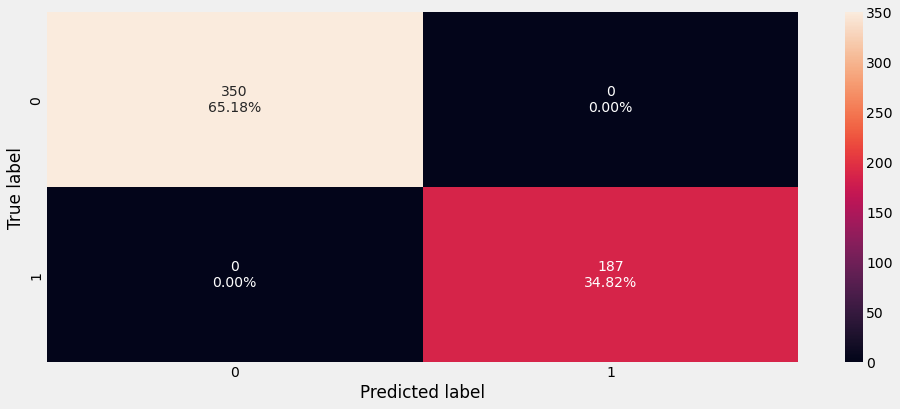

<IPython.core.display.Javascript object>

In [162]:
# confusion_matrix_sklearn(model, X_train, Y_train) ## Complete the code to create confusion matrix for train data
confusion_matrix_sklearn(model, X_train, Y_train)

In [163]:
decision_tree_perf_train = model_performance_classification_sklearn(
    model, X_train, Y_train
)  ## Complete the code to check performance on train data
decision_tree_perf_train

,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


<IPython.core.display.Javascript object>

**Observation**

The decision tree model is highly overfitting the train dataset.

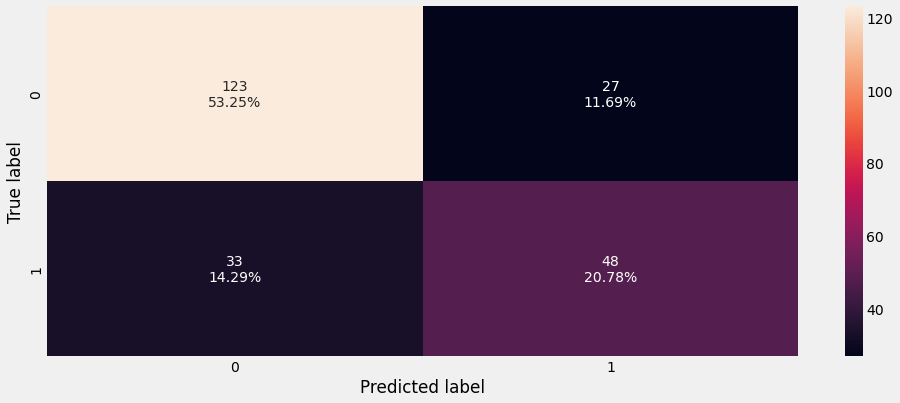

<IPython.core.display.Javascript object>

In [164]:
confusion_matrix_sklearn(
    model, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [165]:
decision_tree_perf_test = model_performance_classification_sklearn(
    model, X_test, Y_test
)  ## Complete the code to check performance for test data
decision_tree_perf_test

,Accuracy,Recall,Precision,F1
0,0.74,0.59,0.64,0.62


<IPython.core.display.Javascript object>

- The decision tree is overfitting the training data.

image.png

# Method2: Weighted Decision Tree Model

* We will build our model using the DecisionTreeClassifier function. Using default 'gini' criteria to split. 
* If the frequency of class A is 10% and the frequency of class B is 90%, then class B will become the dominant class and the decision tree will become biased toward the dominant classes.

* In this case, we can pass a dictionary {0:0.17,1:0.83} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

* class_weight is a hyperparameter for the decision tree classifier.

In [166]:
dtree = DecisionTreeClassifier(
    criterion="gini", class_weight={0: 0.17, 1: 0.83}, random_state=1
)

<IPython.core.display.Javascript object>

In [167]:
dtree.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

<IPython.core.display.Javascript object>

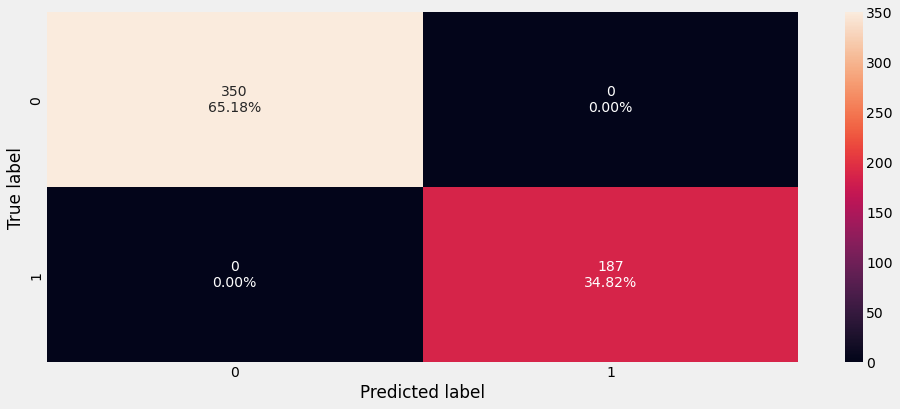

<IPython.core.display.Javascript object>

In [168]:
confusion_matrix_sklearn(dtree, X_train, Y_train)

In [169]:
# Training Performance Mearsures
dtree_model_train_perf = model_performance_classification_sklearn(
    dtree, X_train, Y_train
)
print("Training performance \n")
dtree_model_train_perf

Training performance 



,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


<IPython.core.display.Javascript object>

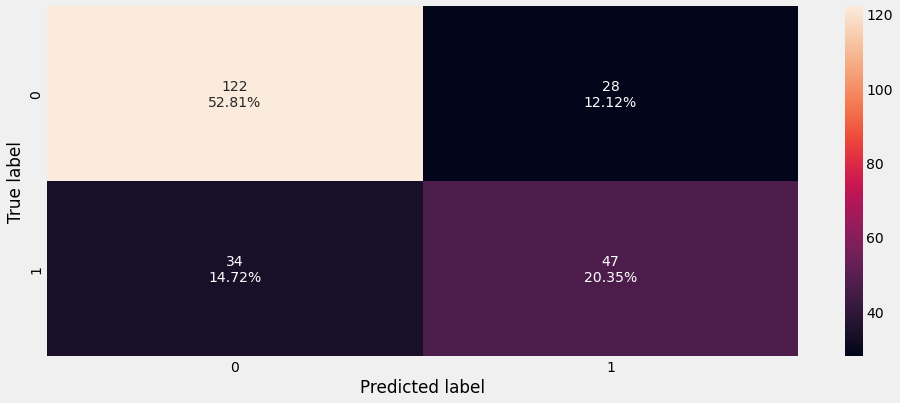

<IPython.core.display.Javascript object>

In [170]:
confusion_matrix_sklearn(dtree, X_test, Y_test)

In [171]:
# Test Performance Measures
dtree_model_test_perf = model_performance_classification_sklearn(dtree, X_test, Y_test)
print("Testing performance \n")
dtree_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.73,0.58,0.63,0.60


<IPython.core.display.Javascript object>

* Decision tree is working well on the training data but is not able to generalize well on the test data concerning the recall.

image.png

### Hyperparameter Tuning - Decision Tree

In [172]:
# Choose the type of classifier.
dtree_estimator = DecisionTreeClassifier(class_weight="balanced", random_state=1)

# Grid of parameters to choose from
parameters = {
    "max_depth": np.arange(10, 30, 5),
    "min_samples_leaf": [3, 5, 7],
    "max_leaf_nodes": [2, 3, 5],
    "min_impurity_decrease": [0.0001, 0.001],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    dtree_estimator, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with n_jobs = -1

grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on the train data

# Set the clf to the best combination of parameters
dtree_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
dtree_estimator.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight='balanced', max_depth=10, max_leaf_nodes=5,
                       min_impurity_decrease=0.0001, min_samples_leaf=3,
                       random_state=1)

<IPython.core.display.Javascript object>

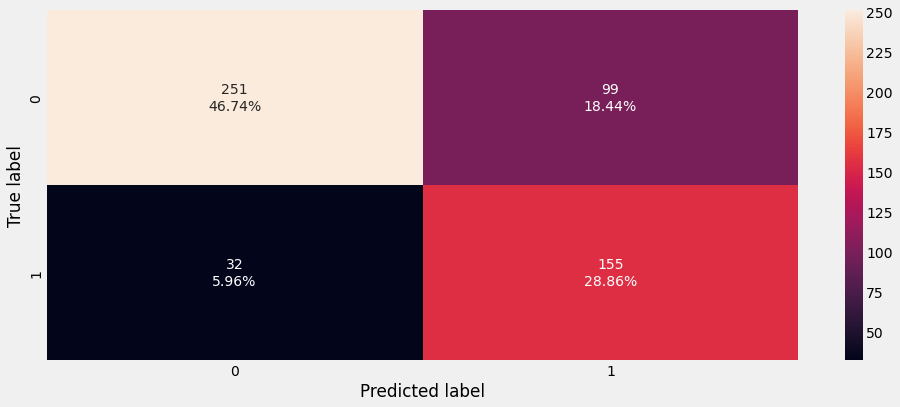

<IPython.core.display.Javascript object>

In [173]:
confusion_matrix_sklearn(
    dtree_estimator, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [174]:
# Tunned Training Performance Measures
dtree_estimator_model_train_perf = model_performance_classification_sklearn(
    dtree_estimator, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
dtree_estimator_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.76,0.83,0.61,0.70


<IPython.core.display.Javascript object>

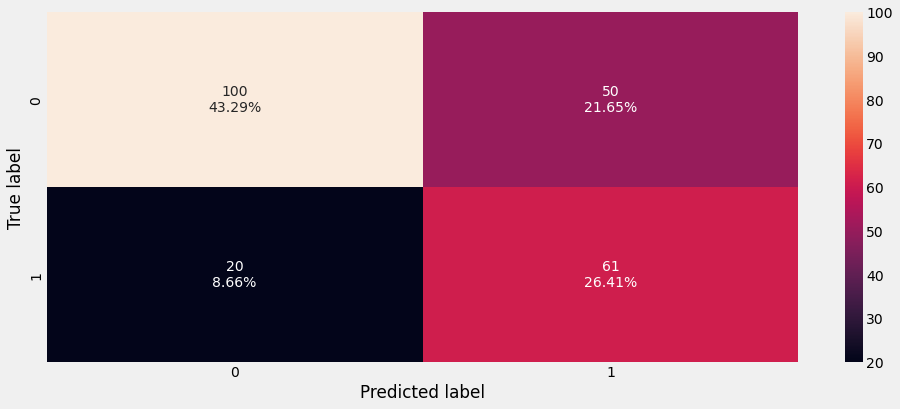

<IPython.core.display.Javascript object>

In [175]:
confusion_matrix_sklearn(
    dtree_estimator, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [176]:
# Tunned Test Performance Measures
dtree_estimator_model_test_perf = model_performance_classification_sklearn(
    dtree_estimator, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
dtree_estimator_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.70,0.75,0.55,0.64


<IPython.core.display.Javascript object>

image.png

## Hyperparameter Tuning Weighted Decision Tree

In [177]:
# Choose the type of classifier.
dtree_estimator = DecisionTreeClassifier(
    class_weight={0: 0.17, 1: 0.83}, random_state=1
)

# Grid of parameters to choose from
parameters = {
    "max_depth": np.arange(2, 30),
    "min_samples_leaf": [1, 2, 5, 7, 10],
    "max_leaf_nodes": [2, 3, 5, 10, 15],
    "min_impurity_decrease": [0.0001, 0.001, 0.01, 0.1],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(dtree_estimator, parameters, scoring=scorer)
grid_obj = grid_obj.fit(X_train, Y_train)

# Set the clf to the best combination of parameters
dtree_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data.
dtree_estimator.fit(X_train, Y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, max_depth=2,
                       max_leaf_nodes=2, min_impurity_decrease=0.1,
                       random_state=1)

<IPython.core.display.Javascript object>

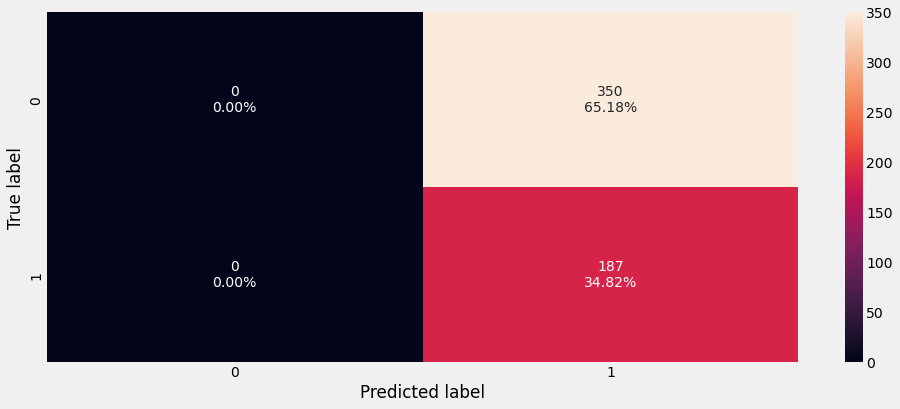

<IPython.core.display.Javascript object>

In [178]:
confusion_matrix_sklearn(dtree_estimator, X_train, Y_train)

In [179]:
# Training Performance Measures
dtree_estimator_model_train_perf = model_performance_classification_sklearn(
    dtree_estimator, X_train, Y_train
)

print("Training performance \n")
dtree_estimator_model_train_perf

Training performance 



,Accuracy,Recall,Precision,F1
0,0.35,1.00,0.35,0.52


<IPython.core.display.Javascript object>

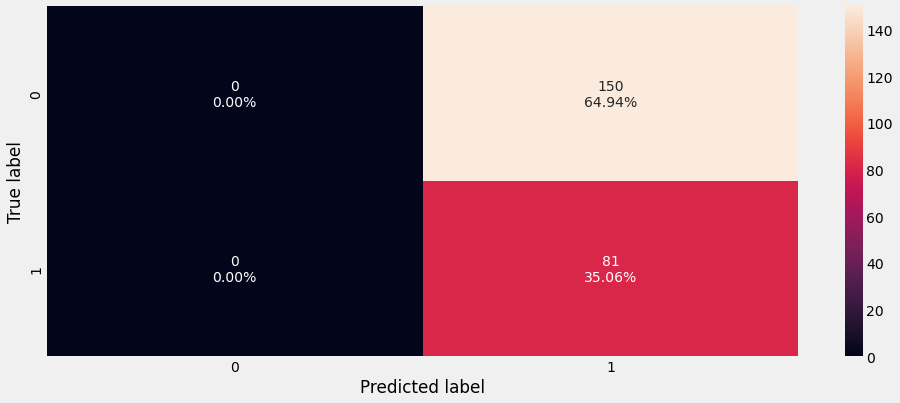

<IPython.core.display.Javascript object>

In [180]:
confusion_matrix_sklearn(dtree_estimator, X_test, Y_test)

In [181]:
# Testing Performance Measures
dtree_estimator_model_test_perf = model_performance_classification_sklearn(
    dtree_estimator, X_test, Y_test
)
print("Testing performance \n")
dtree_estimator_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.35,1.00,0.35,0.52


<IPython.core.display.Javascript object>

* Overfitting in decision tree has reduced but the recall has also reduced.

* The decision tree model has a high recall but, the precision is quite lower.

* The performance of the model after hyperparameter tuning can be generalized.

* The coefficients of  F1 score of  for both train and test dataset are 0.812 and 0.809 respectively.


* The decision tree is overfitting the training data as there is a huge difference between training and test scores for all the metrics.
* The test recall is very low i.e. only 58%.

## Important Features for Predicting Diabetes Outcome

In [182]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        model.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.32
BMI                          0.15
Diabetes__Pedigree__Function 0.12
Blood__Pressure              0.11
Age                          0.11
Insulin                      0.07
Pregnancies                  0.06
Skin_Thickness               0.05


<IPython.core.display.Javascript object>

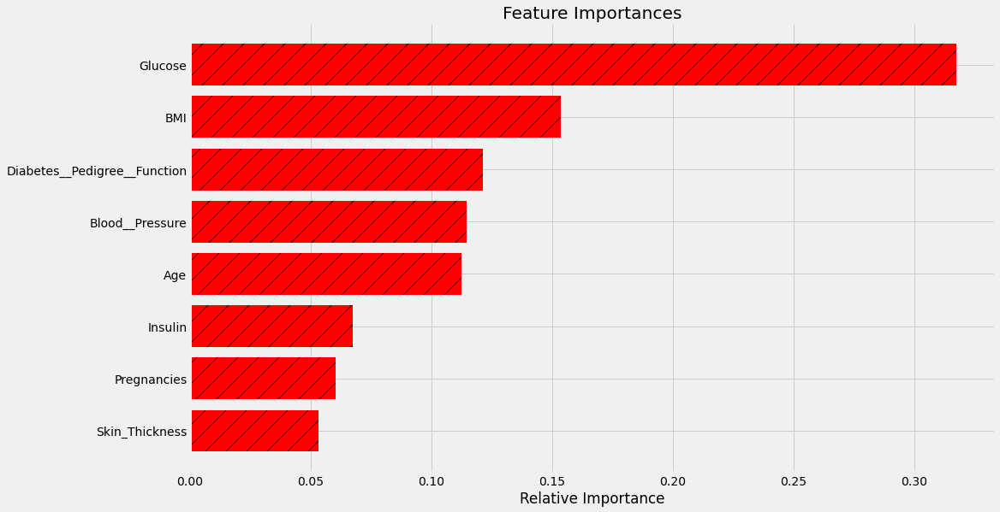

<IPython.core.display.Javascript object>

In [183]:
# Extracting the Important Features for Prediction Diabetes Using Gini Criteria Decision Tree
importances = model.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="red", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [184]:
# Text report showing the rules of a decision tree -
feature_names = list(X_train.columns)
print(tree.export_text(model, feature_names=feature_names, show_weights=True))

|--- Glucose <= 127.50
|   |--- Age <= 28.50
|   |   |--- Pregnancies <= 7.50
|   |   |   |--- BMI <= 32.30
|   |   |   |   |--- Diabetes__Pedigree__Function <= 0.67
|   |   |   |   |   |--- weights: [94.00, 0.00] class: 0
|   |   |   |   |--- Diabetes__Pedigree__Function >  0.67
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 0.69
|   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Diabetes__Pedigree__Function >  0.69
|   |   |   |   |   |   |--- weights: [14.00, 0.00] class: 0
|   |   |   |--- BMI >  32.30
|   |   |   |   |--- Diabetes__Pedigree__Function <= 0.14
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 0.11
|   |   |   |   |   |   |--- weights: [2.00, 0.00] class: 0
|   |   |   |   |   |--- Diabetes__Pedigree__Function >  0.11
|   |   |   |   |   |   |--- weights: [0.00, 3.00] class: 1
|   |   |   |   |--- Diabetes__Pedigree__Function >  0.14
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 1.27
|   |   |   |   |   | 

<IPython.core.display.Javascript object>

image.png


## Bagging Classifier

- ***Bagging refers to bootstrap sampling and aggregation. This means that in bagging at the beginning samples are chosen randomly with replacement to train the individual models and then model predictions undergo aggregation to combine them for the final prediction to consider all the possible outcomes.***


- ***Bagging makes the model more robust since the final prediction is made on the basis of a number of outputs that have been given by a large number of independent models. It prevents overfitting the model to the original data since the individual models do not have access to the original data and are only built on samples that have been randomly chosen from the original data with replacement. Bagging follows the parallel model building i.e the output of individual models is independent of each other.***

**Some of the important hyperparameters available for bagging classifier are:**

- base_estimator: The base estimator to fit on random subsets of the dataset. If None(default), then the base estimator is a decision tree.
- n_estimators: The number of trees in the forest, default = 100.
- max_features: The number of features to consider when looking for the best split. 
- bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
- bootstrap_features: If it is true, then features are drawn with replacement. Default value is False.
- max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
- oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

In [185]:
bagging_classifier = BaggingClassifier(
    random_state=1
)  ## Complete the code to define bagging classifier with random state = 1
bagging_classifier.fit(
    X_train, Y_train
)  ## Complete the code to fit bagging classifier on the train data

BaggingClassifier(random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

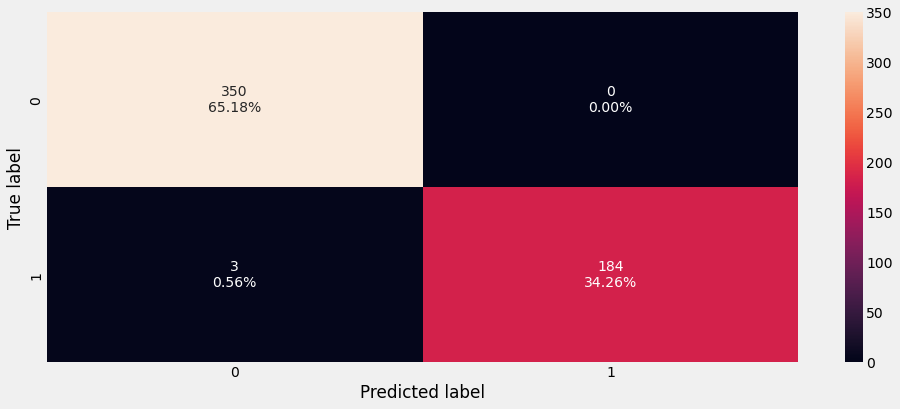

<IPython.core.display.Javascript object>

In [186]:
confusion_matrix_sklearn(
    bagging_classifier, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [187]:
bagging_classifier_model_train_perf = model_performance_classification_sklearn(
    bagging_classifier, X_train, Y_train
)  ## Complete the code to check performance on train data
bagging_classifier_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.99,0.98,1.00,0.99


<IPython.core.display.Javascript object>

#### Checking model performance on test set

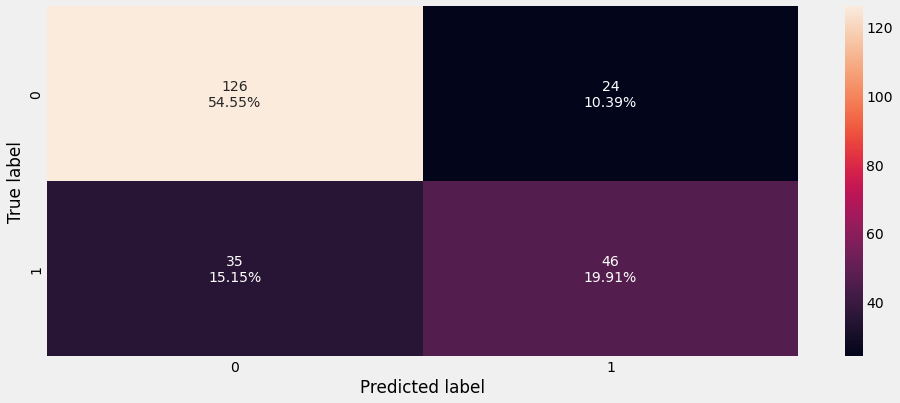

<IPython.core.display.Javascript object>

In [188]:
confusion_matrix_sklearn(
    bagging_classifier, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [189]:
bagging_classifier_model_test_perf = model_performance_classification_sklearn(bagging_classifier, X_test ,Y_test) ## Complete the code to check performance for test data
bagging_classifier_model_test_perf


,Accuracy,Recall,Precision,F1
0,0.74,0.57,0.66,0.61


<IPython.core.display.Javascript object>

- The overfitting has decrease slightly in the training data

- The test model performance is lower than in hyperparamenter tuned Decision tree

image.png

# Method2:  Bagging Classifier - Weighted Decision Tree

**Bagging Classifier with weighted decision tree**

In [190]:
bagging_wt = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(
        criterion="gini", class_weight={0: 0.17, 1: 0.83}, random_state=1
    ),
    random_state=1,
)
bagging_wt.fit(X_train, Y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.17,
                                                                      1: 0.83},
                                                        random_state=1),
                  random_state=1)

<IPython.core.display.Javascript object>

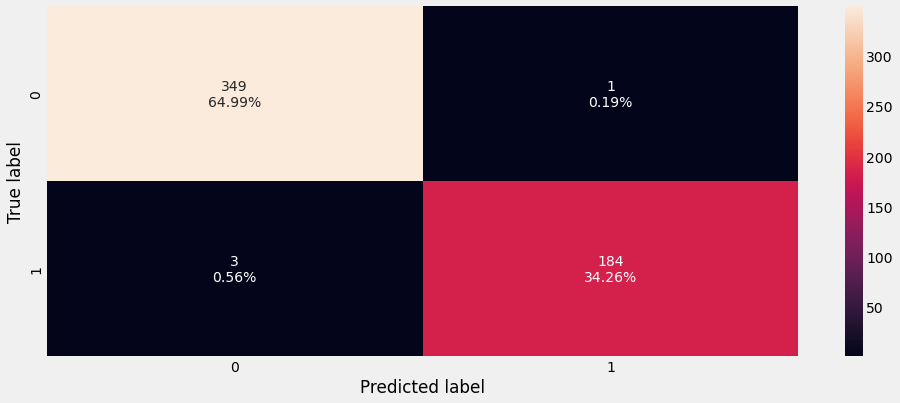

<IPython.core.display.Javascript object>

In [191]:
confusion_matrix_sklearn(bagging_wt, X_train, Y_train)

In [192]:
# Training Performance Measures
bagging_wt_model_train_perf = model_performance_classification_sklearn(
    bagging_wt, X_train, Y_train
)
print("Training performance \n")
bagging_wt_model_train_perf

Training performance 



,Accuracy,Recall,Precision,F1
0,0.99,0.98,0.99,0.99


<IPython.core.display.Javascript object>

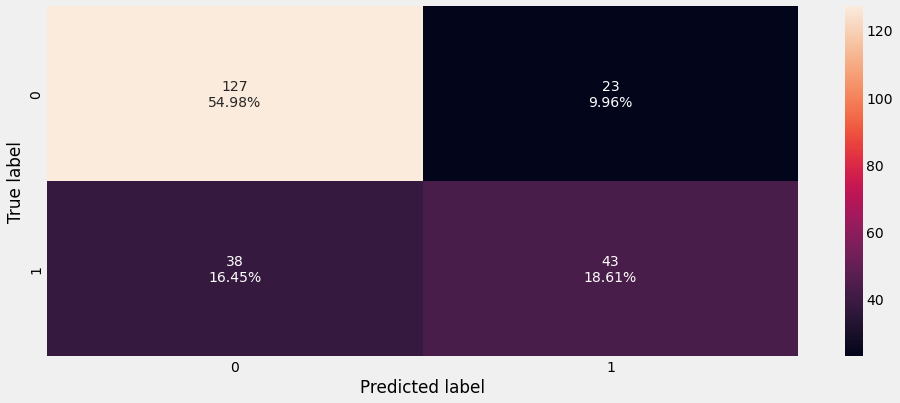

<IPython.core.display.Javascript object>

In [193]:
confusion_matrix_sklearn(bagging_wt, X_test, Y_test)

In [194]:
# Testing Performance Measures
bagging_wt_model_test_perf = model_performance_classification_sklearn(
    bagging_wt, X_test, Y_test
)
print("Testing performance \n")
bagging_wt_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.74,0.53,0.65,0.59


<IPython.core.display.Javascript object>

* Bagging classifier with a weighted decision tree is giving very good accuracy and prediction but is not able to generalize well on test data in terms of recall.

## Hyperparameter Tuning - Bagging Classifier

#### Bagging Classifier

***Some of the important hyperparameters available for bagging classifier are***:

-  `base_estimator:` The base estimator to fit on random subsets of the dataset. If None(default), then the base estimator is a decision tree.

- `n_estimators:` The number of trees in the forest, default = 100.
max_features: The number of features to consider when looking for the best split.

- `bootstrap:` Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.


- `bootstrap_features:` If it is true, then features are drawn with replacement. Default value is False.


-  `max_samples:` If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.

- `oob_score:` Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.


In [195]:
# Choose the type of classifier.
bagging_estimator_tuned = BaggingClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {
    "max_samples": [0.7, 0.8, 0.9],
    "max_features": [0.7, 0.8, 0.9],
    "n_estimators": np.arange(90, 120, 10),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    bagging_estimator_tuned, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with cv = 5
grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on train data

# Set the clf to the best combination of parameters
bagging_estimator_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
bagging_estimator_tuned.fit(X_train, Y_train)

BaggingClassifier(max_features=0.9, max_samples=0.7, n_estimators=90,
                  random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

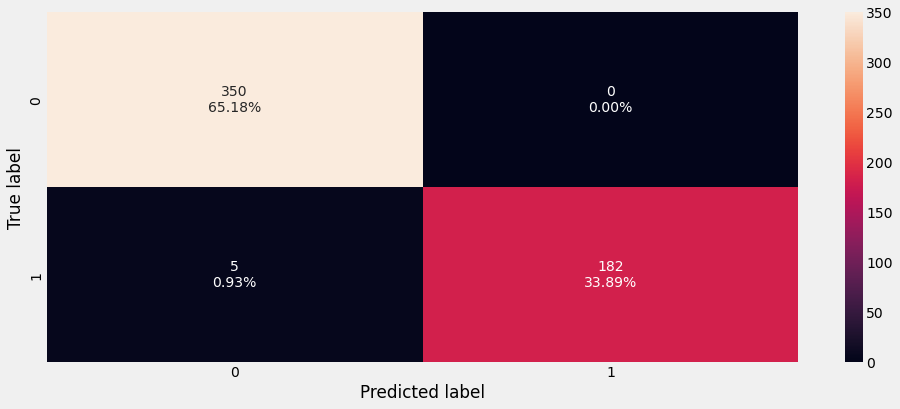

<IPython.core.display.Javascript object>

In [196]:
confusion_matrix_sklearn(
    bagging_estimator_tuned, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [197]:
# Training Performance Mearsures
bagging_estimator_tuned_model_train_perf = model_performance_classification_sklearn(
    bagging_estimator_tuned, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
bagging_estimator_tuned_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.99,0.97,1.00,0.99


<IPython.core.display.Javascript object>

#### Checking model performance on test set

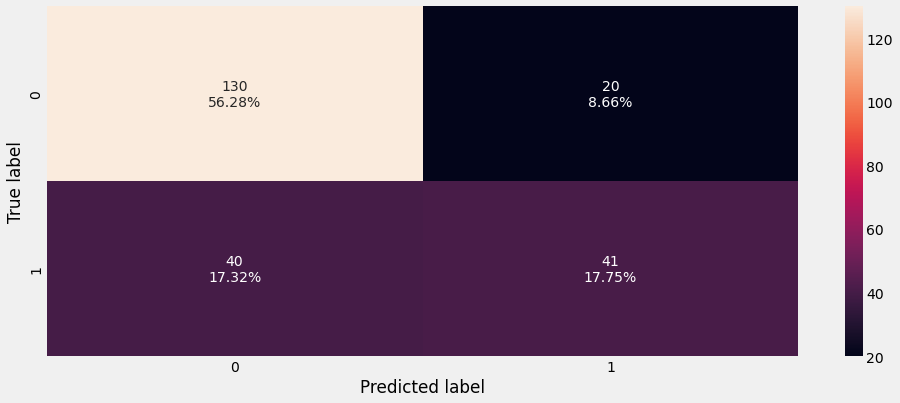

<IPython.core.display.Javascript object>

In [198]:
confusion_matrix_sklearn(
    bagging_estimator_tuned, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [199]:
# Testing Performce Measures
bagging_estimator_tuned_model_test_perf = model_performance_classification_sklearn(
    bagging_estimator_tuned, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
bagging_estimator_tuned_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.74,0.51,0.67,0.58


<IPython.core.display.Javascript object>

The model performance has increased but the training data is still overfitting

# Method 2: Logistic Regression as the base estimator for Bagging Classifier

### Let's try using logistic regression as the base estimator for bagging classifier:
- Now, let's try and change the `base_estimator` of the bagging classifier, which is a decision tree by default.
- We will pass the logistic regression as the base estimator for bagging classifier.

In [200]:
bagging_lr = BaggingClassifier(
    base_estimator=LogisticRegression(
        solver="liblinear", random_state=1, max_iter=1000
    ),
    random_state=1,
)
bagging_lr.fit(X_train, Y_train)

BaggingClassifier(base_estimator=LogisticRegression(max_iter=1000,
                                                    random_state=1,
                                                    solver='liblinear'),
                  random_state=1)

<IPython.core.display.Javascript object>

In [201]:
# Using above defined function to get accuracy, recall and precision on train and test set
bagging_lr_score = get_metrics_score(bagging_lr)

Accuracy on training set :  0.7821229050279329
Accuracy on test set :  0.7359307359307359
Recall on training set :  0.5614973262032086
Recall on test set :  0.4567901234567901
Precision on training set :  0.75
Precision on test set :  0.6851851851851852


<IPython.core.display.Javascript object>

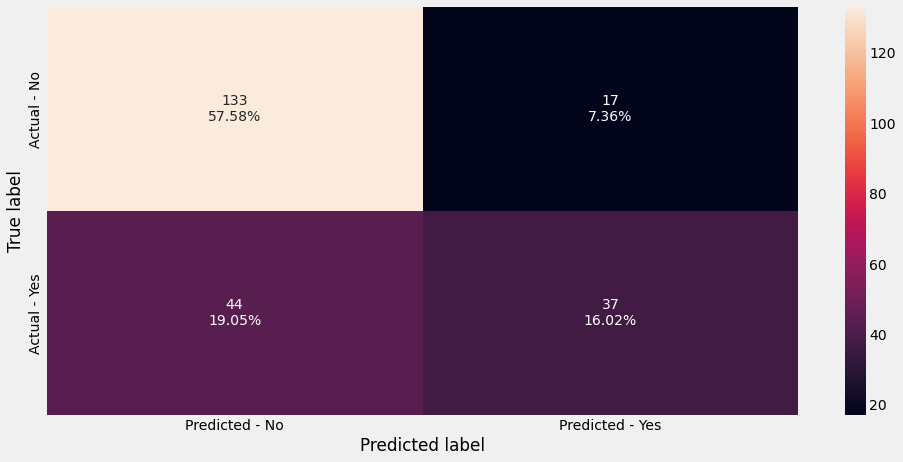

<IPython.core.display.Javascript object>

In [202]:
make_confusion_matrix(bagging_lr, Y_test)

### Insights
- Bagging classifier with logistic regression as base_estimator is not overfitting the data but the test recall is very low.
- Ensemble models are less interpretable than decision tree but bagging classifier is even less interpretable than random forest. It does not even have a feature importance attribute.

## Tuning Bagging Classifier- Weighte Model

In [203]:
# grid search for bagging classifier
bagging_estimator_weighted = DecisionTreeClassifier(
    class_weight={0: 0.13, 1: 0.87}, random_state=1
)
param_grid = {
    "base_estimator": [bagging_estimator_weighted],
    "n_estimators": [5, 7, 15, 51, 101],
    "max_features": [0.7, 0.8, 0.9, 1],
}

grid = GridSearchCV(
    BaggingClassifier(random_state=1, bootstrap=True),
    param_grid=param_grid,
    scoring="recall",
    cv=5,
)
grid.fit(X_train, Y_train)

## getting the best estimator
bagging_estimator = grid.best_estimator_
bagging_estimator.fit(X_train, Y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.13,
                                                                      1: 0.87},
                                                        random_state=1),
                  max_features=1, n_estimators=5, random_state=1)

<IPython.core.display.Javascript object>

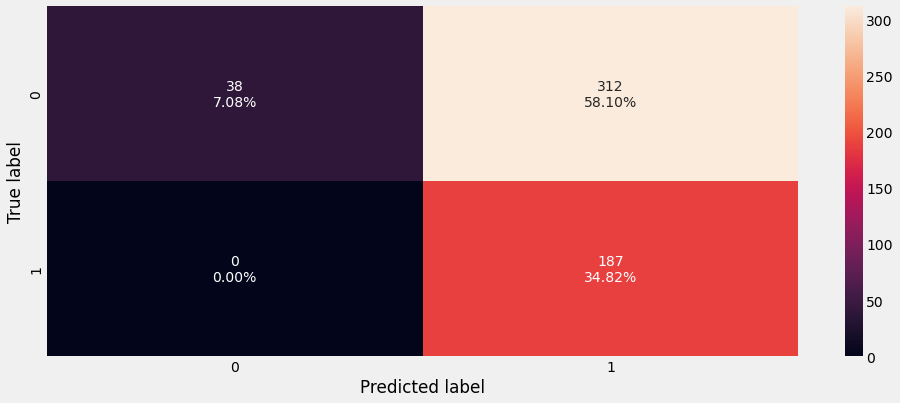

<IPython.core.display.Javascript object>

In [204]:
confusion_matrix_sklearn(bagging_estimator, X_train, Y_train)

In [205]:
# Training Performance Measures
bagging_estimator_model_train_perf = model_performance_classification_sklearn(
    bagging_estimator, X_train, Y_train
)
print("Training performance: \n ")
bagging_estimator_model_train_perf

Training performance: 
 


,Accuracy,Recall,Precision,F1
0,0.42,1.00,0.37,0.55


<IPython.core.display.Javascript object>

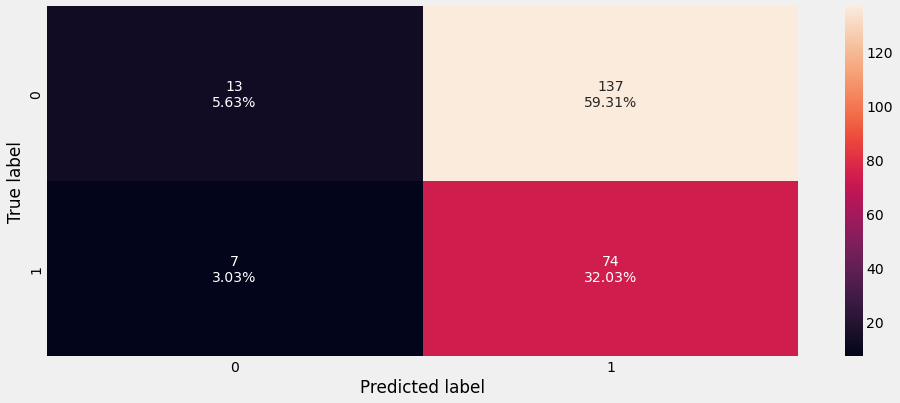

<IPython.core.display.Javascript object>

In [206]:
confusion_matrix_sklearn(bagging_estimator, X_test, Y_test)

In [207]:
# Testing Performance Mearsures
bagging_estimator_model_test_perf = model_performance_classification_sklearn(
    bagging_estimator, X_test, Y_test
)
print("Testing performance \n")
bagging_estimator_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.38,0.91,0.35,0.51


<IPython.core.display.Javascript object>

* Recall has improved but the accuracy and precision of the model has dropped drastically which is an indication that overall the model is making many mistakes.

image.png

## Random Forest

- ***Random forest randomly picks a subset of independent variables for each node's split, where m is the size of the subset and M is the total number of independent variables, where m is generally less than M. This is done to make the individual trees even more independent/different from each other and incorporate more diversity in our final prediction thereby, making the entire model more robust.***

- ***In Random Forest, to get different n-models with the same algorithm, we use Bootstrap aggregation. This means that at the beginning samples are chosen randomly with replacement to train the individual models and then model predictions undergo aggregation to combine them for the final prediction to consider all the possible outcomes.***

- ***The problem of overfitting in a decision tree can be overcome by random forest since the individual trees in a random forest do not have access to the original dataset and are only built on observations that have been sampled with replacement from the original dataset.***


- ***Since the random forest uses multiple tree models to reach a final prediction, it is more robust than a single decision tree model and prevents instabilities due to changes in data. Random forest is less interpretable and has higher computational complexity than decision trees as it utilizes multiple tree models to reach a prediction.***

- ***Random forest prevents overfitting since the individual trees in a random forest do not have access to the original dataset and are only built on observations that have been sampled with replacement from the original dataset. Moreover, aggregation of results from different trees in a random forest reduces the chances of overfitting and so there is no need to prune a random forest.***

- ***In a classification setting, for a new test data point, the final prediction by a random forest is done by taking the mode of the individual predictions while in a regression setting, for a new test data point, the final prediction by a random forest is done by taking the average of individual predictions.***

# Random Forest Classifier
**Now, let's see if we can get a better model by tuning the random forest classifier. Some of the important hyperparameters available for random forest classifier are:**

- n_estimators: The number of trees in the forest, default = 100.
- max_features: The number of features to consider when looking for the best split. 
- class_weight: Weights associated with classes in the form {class_label: weight}.If not given, all classes are supposed to have weight one.  
- For example: If the frequency of class 0 is 80% and the frequency of class 1 is 20% in the data, then class 0 will become the dominant class and the model will become biased toward the dominant classes. In this case, we can pass a dictionary {0:0.2,1:0.8} to the model to specify the weight of each class and the random forest will give more weightage to class 1. 
- bootstrap: Whether bootstrap samples are used when building trees. If False, the entire dataset is used to build each tree, default=True.
- max_samples: If bootstrap is True, then the number of samples to draw from X to train each base estimator. If None (default), then draw N samples, where N is the number of observations in the train data.
- oob_score: Whether to use out-of-bag samples to estimate the generalization accuracy, default=False.

- Note: A lot of hyperparameters of Decision Trees are also available to tune  Random Forest like max_depth, min_sample_split etc.


In [208]:
# Fitting the model
rf_estimator = RandomForestClassifier(
    random_state=1
)  ## Complete the code to define random forest with random state = 1 and class_weight = balanced
rf_estimator.fit(
    X_train, Y_train
)  ## Complete the code to fit random forest on the train data

RandomForestClassifier(random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

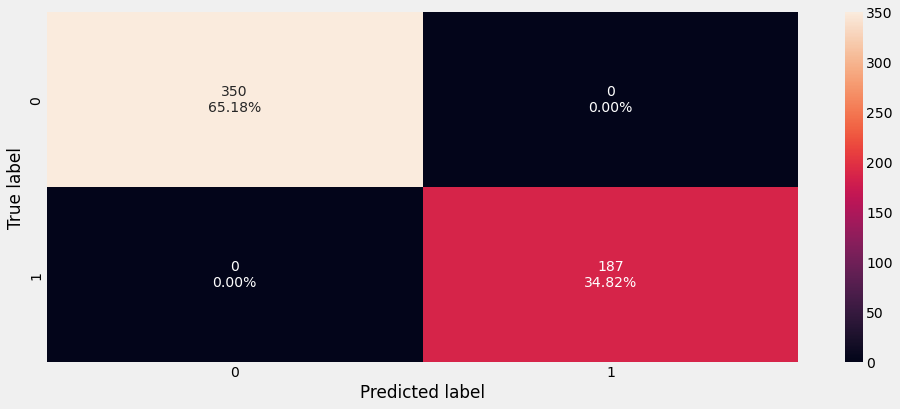

<IPython.core.display.Javascript object>

In [209]:
confusion_matrix_sklearn(
    rf_estimator, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [210]:
# Training Performance Measures
rf_estimator_model_train_perf = model_performance_classification_sklearn(
    rf_estimator, X_train, Y_train
)  ## Complete the code to check performance on train data
rf_estimator_model_train_perf

,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


<IPython.core.display.Javascript object>

#### Checking model performance on test set

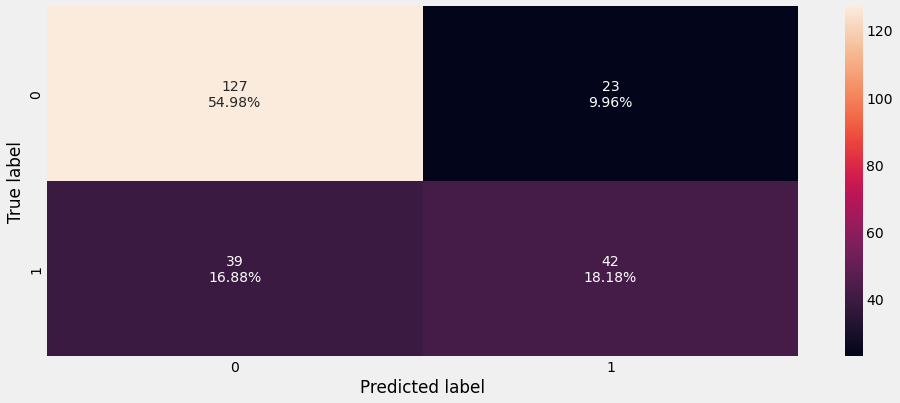

<IPython.core.display.Javascript object>

In [211]:
confusion_matrix_sklearn(
    rf_estimator, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [212]:
# Testing Prformance Measures
rf_estimator_model_test_perf = model_performance_classification_sklearn(
    rf_estimator, X_test, Y_test
)  ## Complete the code to check performance for test data
rf_estimator_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.73,0.52,0.65,0.58


<IPython.core.display.Javascript object>

## Random Forest -Weighted Class

**Random forest with class weights**

In [213]:
rf_wt = RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)
rf_wt.fit(X_train, Y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

<IPython.core.display.Javascript object>

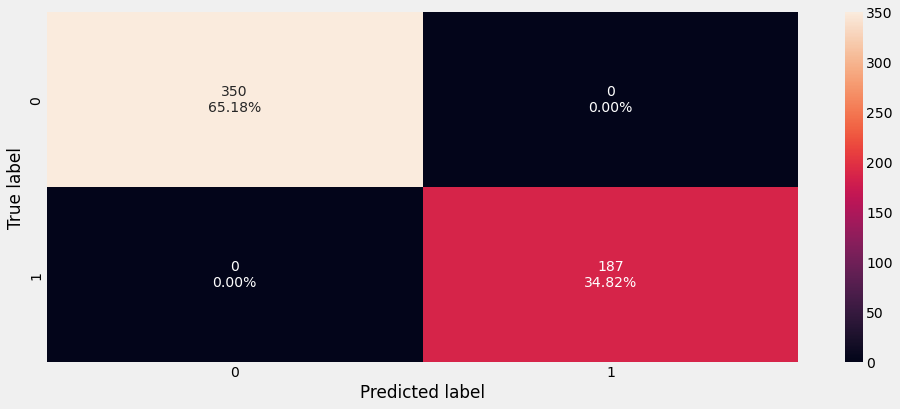

<IPython.core.display.Javascript object>

In [214]:
confusion_matrix_sklearn(rf_wt, X_train, Y_train)

In [215]:
# Training Performance Measures
rf_wt_model_train_perf = model_performance_classification_sklearn(
    rf_wt, X_train, Y_train
)
print("Training performance \n")
rf_wt_model_train_perf

Training performance 



,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


<IPython.core.display.Javascript object>

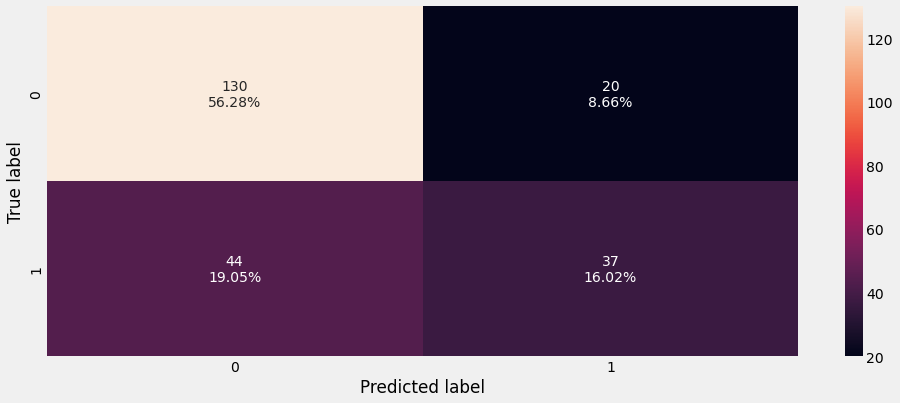

<IPython.core.display.Javascript object>

In [216]:
confusion_matrix_sklearn(rf_wt, X_test, Y_test)

In [217]:
# Testing Performance Measures
rf_wt_model_test_perf = model_performance_classification_sklearn(rf_wt, X_test, Y_test)
print("Testing performance \n")

rf_wt_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.72,0.46,0.65,0.54


<IPython.core.display.Javascript object>

* There is not much improvement in metrics of weighted random forest as compared to the unweighted random forest.

* Random forest is overfitting the training data as there is a huge difference between training and test scores for all the metrics.
* The test recall is even lower than the decision tree but has a higher test precision.

# Hyperparameter Tuning - Random Forest

- ***The class_weight is the hyperparameter of Random Forest which is useful in dealing with imbalanced data by giving more importance to the minority class. By giving more class_weight to a certain class than the other class, we tell the model that it is more important to correctly predict a certain class than the other class.***

### Let's try using class_weights for random forest:
- The model performance is not very good. This may be due to the fact that the classes are imbalanced with 70% non-defaulters and 30% defaulters. 

- We should make the model aware that the class of interest here is 'defaulters'.

- We can do so by passing the parameter `class_weights` available for random forest. This parameter is not available for the bagging classifier.

- class_weight specifies the weights associated with classes in the form {class_label: weight}. If not given, all classes are supposed to have weight one.

- We can choose class_weights={0:0.3,1:0.7} because that is the original imbalance in our data.

In [218]:
# Choose the type of classifier.
rf_tuned = RandomForestClassifier(random_state=1, oob_score=True, bootstrap=True)

parameters = {
    "max_depth": list(np.arange(5, 15, 5)),
    "max_features": ["sqrt", "log2"],
    "min_samples_split": [3, 5, 7],
    "n_estimators": np.arange(10, 40, 10),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    rf_tuned, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with cv = 5 and n_jobs = -1
grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on the train data

# Set the clf to the best combination of parameters
rf_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_tuned.fit(X_train, Y_train)

RandomForestClassifier(max_depth=10, max_features='log2', min_samples_split=5,
                       n_estimators=30, oob_score=True, random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

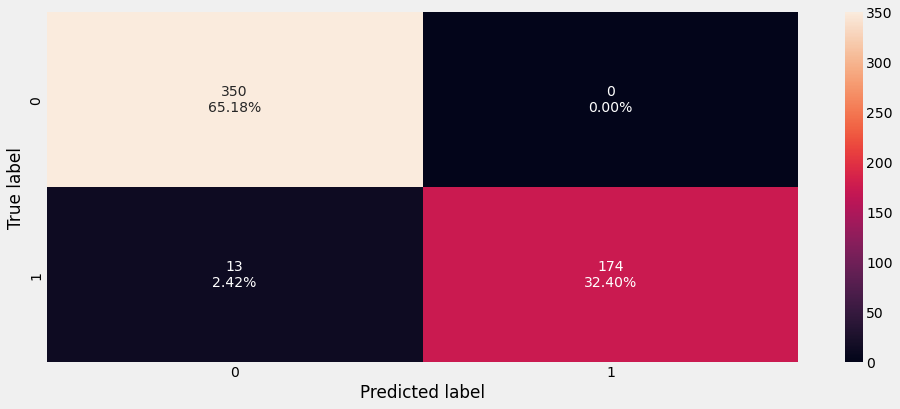

<IPython.core.display.Javascript object>

In [219]:
confusion_matrix_sklearn(
    rf_tuned, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [220]:
# Training Performance Measures
rf_tuned_model_train_perf = model_performance_classification_sklearn(
    rf_tuned, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
rf_tuned_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.98,0.93,1.00,0.96


<IPython.core.display.Javascript object>

#### Checking model performance on test set

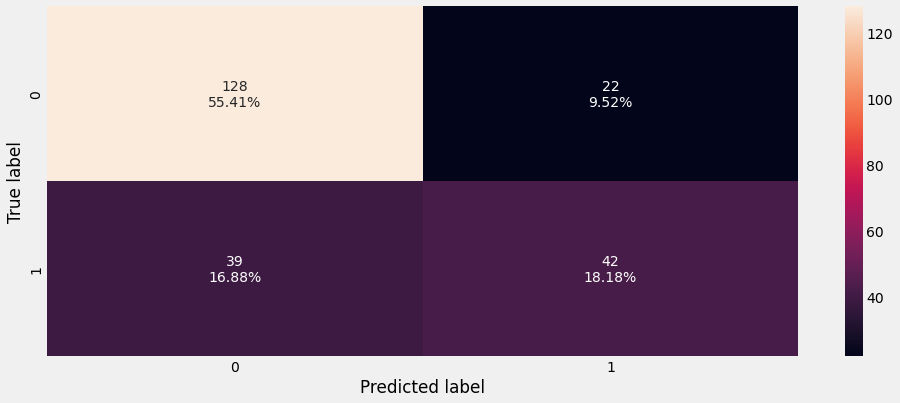

<IPython.core.display.Javascript object>

In [221]:
confusion_matrix_sklearn(
    rf_tuned, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [222]:
# Test Performance Measures
rf_tuned_model_test_perf = model_performance_classification_sklearn(
    rf_tuned, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
rf_tuned_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.74,0.52,0.66,0.58


<IPython.core.display.Javascript object>

# Method 2

## Class_Weights for Random Forest - Hyperparameter Tuning

### Let's try using class_weights for random forest:
- The model performance is not very good. This may be due to the fact that the classes are imbalanced with 70% non-defaulters and 30% defaulters. 

- We should make the model aware that the class of interest here is 'defaulters'.

- We can do so by passing the parameter `class_weights` available for random forest. This parameter is not available for the bagging classifier.

- class_weight specifies the weights associated with classes in the form {class_label: weight}. If not given, all classes are supposed to have weight one.

- We can choose class_weights={0:0.3,1:0.7} because that is the original imbalance in our data.

In [223]:
# Choose the type of classifier.
rf_estimator_weighted = RandomForestClassifier(random_state=1)

# Grid of parameters to choose from
## add from article
parameters = {
    "class_weight": [{0: 0.3, 1: 0.7}],
    "n_estimators": [100, 150, 200, 250],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.2, 0.7, 0.1),
    "max_samples": np.arange(0.3, 0.7, 0.1),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(rf_estimator_weighted, parameters, scoring=acc_scorer, cv=5)
grid_obj = grid_obj.fit(X_train, Y_train)

# Set the clf to the best combination of parameters
rf_estimator_weighted = grid_obj.best_estimator_

# Fit the best algorithm to the data.
rf_estimator_weighted.fit(X_train, Y_train)

RandomForestClassifier(class_weight={0: 0.3, 1: 0.7}, max_features=0.2,
                       max_samples=0.3, min_samples_leaf=9, n_estimators=150,
                       random_state=1)

<IPython.core.display.Javascript object>

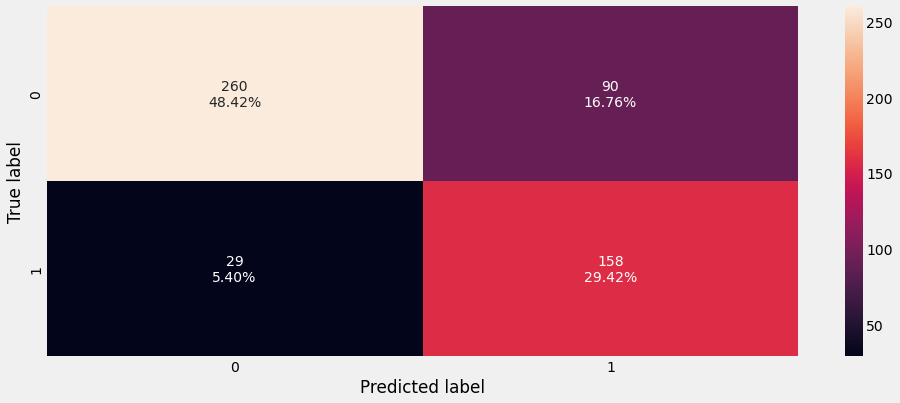

<IPython.core.display.Javascript object>

In [224]:
confusion_matrix_sklearn(rf_estimator_weighted, X_train, Y_train)

In [225]:
# Training Performance Measures
rf_wt_model_train_perf = model_performance_classification_sklearn(
    rf_estimator_weighted, X_train, Y_train
)
print("Training performance \n")
rf_wt_model_train_perf

Training performance 



,Accuracy,Recall,Precision,F1
0,0.78,0.84,0.64,0.73


<IPython.core.display.Javascript object>

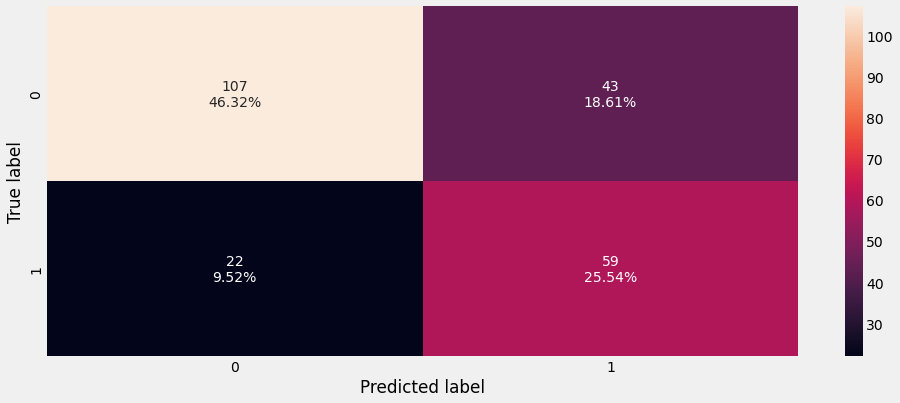

<IPython.core.display.Javascript object>

In [226]:
confusion_matrix_sklearn(rf_estimator_weighted, X_test, Y_test)

In [227]:
# Testing Performance Measures
rf_wt_model_test_perf = model_performance_classification_sklearn(
    rf_estimator_weighted, X_test, Y_test
)
print("Testing performance \n")
rf_wt_model_test_perf

Testing performance 



,Accuracy,Recall,Precision,F1
0,0.72,0.73,0.58,0.64


<IPython.core.display.Javascript object>

* Random forest after tuning has given same performance as un-tuned random forest.

## Important Features for Predicting Diabetes  - Random Forest Model

In [228]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        rf_estimator_weighted.feature_importances_,
        columns=["Imp"],
        index=X_train.columns,
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.23
BMI                          0.19
Age                          0.14
Diabetes__Pedigree__Function 0.11
Insulin                      0.09
Pregnancies                  0.09
Blood__Pressure              0.08
Skin_Thickness               0.06


<IPython.core.display.Javascript object>

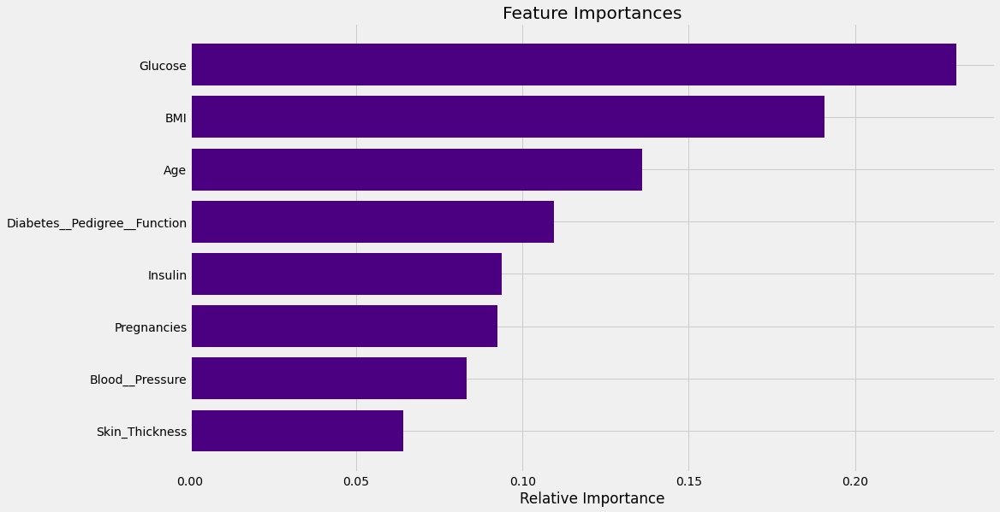

<IPython.core.display.Javascript object>

In [229]:
importances = rf_estimator_weighted.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="indigo", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

image.png

- Random forest is overfitting the training data

- Model performance slightly lower than tuned Bagging Classifier

- Overfitting is pretty much reduced in tuned Random Forest model

- F1 score improved but precision has slight reduced

- The confustion matrix shows that the model can predict visa certification 

The hyperparameter tuning on Random forest reduces the overfitting

image.png

## Summary Performance Measures of Bagging Models Train vs Test Models

---



In [230]:
# Performance comparison of Bagging models

bagging_comp_df = pd.concat(
    [
        decision_tree_perf_train.T,
        decision_tree_perf_test.T,
        rf_estimator_model_train_perf.T,
        rf_estimator_model_test_perf.T,
        bagging_classifier_model_train_perf.T,
        bagging_classifier_model_test_perf.T,
    ],
    axis=1,
)
bagging_comp_df.columns = [
    "Decision Tree (train)",
    "Decision Tree (test)",
    "Random Forest (train)",
    "Random Forest (test)",
    "Bagging Classifier (train)",
    "Bagging Classifier (test)",
]
print("Training performance comparison:")
bagging_comp_df

Training performance comparison:


,Decision Tree (train),Decision Tree (test),Random Forest (train),Random Forest (test),Bagging Classifier (train),Bagging Classifier (test)
Accuracy,1.00,0.74,1.00,0.73,0.99,0.74
Recall,1.00,0.59,1.00,0.52,0.98,0.57
Precision,1.00,0.64,1.00,0.65,1.00,0.66
F1,1.00,0.62,1.00,0.58,0.99,0.61


<IPython.core.display.Javascript object>

## Summary Performance Measures of Bagging Models Tuning Train vs Tuning Test Models

---



In [231]:
bagging_tuned_comp_df = pd.concat(
    [
        dtree_estimator_model_train_perf.T,
        dtree_estimator_model_test_perf.T,
        rf_tuned_model_train_perf.T,
        rf_tuned_model_test_perf.T,
        bagging_estimator_tuned_model_train_perf.T,
        bagging_estimator_tuned_model_test_perf.T,
    ],
    axis=1,
)
bagging_tuned_comp_df.columns = [
    "Decision Tree Tuned(train)",
    "Decision Tree Tuned(test)",    
    "Random Forest Tuned(train)",
    "Random Forest Tuned(test)",    
    "Bagging Classifier Tuned (train)",
    "Bagging Classifier Tuned (test)",
    ]
print("Bagging tuned model performance comparison:")
bagging_tuned_comp_df



Bagging tuned model performance comparison:


,Decision Tree Tuned(train),Decision Tree Tuned(test),Random Forest Tuned(train),Random Forest Tuned(test),Bagging Classifier Tuned (train),Bagging Classifier Tuned (test)
Accuracy,0.35,0.35,0.98,0.74,0.99,0.74
Recall,1.00,1.00,0.93,0.52,0.97,0.51
Precision,0.35,0.35,1.00,0.66,1.00,0.67
F1,0.52,0.52,0.96,0.58,0.99,0.58


<IPython.core.display.Javascript object>

image.png

# Boosting Decision Tree Models

## AdaBoost Classifier

In [232]:
ab_classifier = AdaBoostClassifier(
    random_state=1
)  ## Complete the code to define AdaBoost Classifier with random state = 1
ab_classifier.fit(
    X_train, Y_train
)  ## Complete the code to fit AdaBoost Classifier on the train data

AdaBoostClassifier(random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

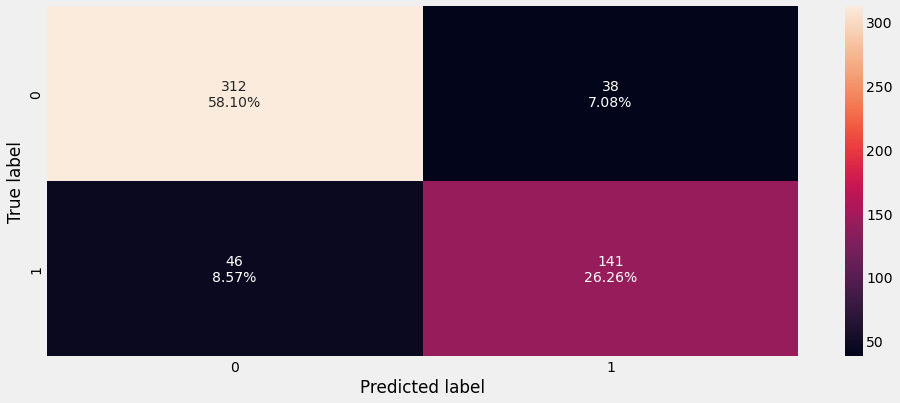

<IPython.core.display.Javascript object>

In [233]:
confusion_matrix_sklearn(
    ab_classifier, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [234]:
ab_classifier_model_train_perf = model_performance_classification_sklearn(
    ab_classifier, X_train, Y_train
)  ## Complete the code to check performance on train data
ab_classifier_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.84,0.75,0.79,0.77


<IPython.core.display.Javascript object>

#### Checking model performance on test set

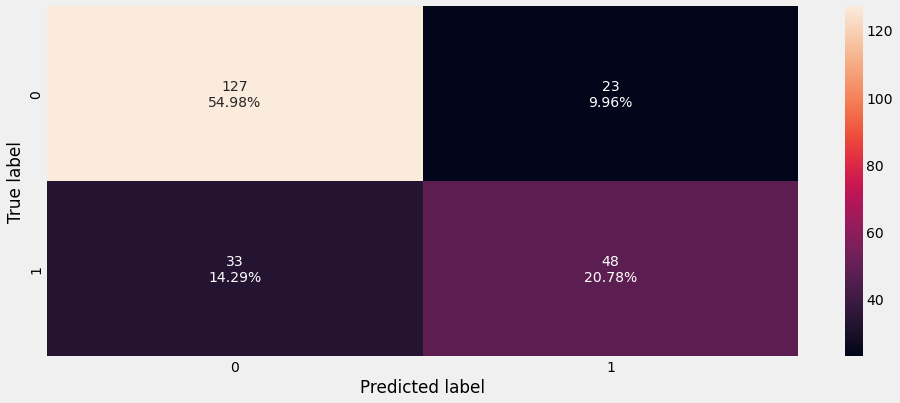

<IPython.core.display.Javascript object>

In [235]:
confusion_matrix_sklearn(
    ab_classifier, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [236]:
ab_classifier_model_test_perf = model_performance_classification_sklearn(
    ab_classifier, X_test, Y_test
)  ## Complete the code to check performance for test data
ab_classifier_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.76,0.59,0.68,0.63


<IPython.core.display.Javascript object>

- Overfitting is further reduced

- Model performance is similar to that of tuned Random Forest


image.png

### Hyperparameter Tuning - AdaBoost Classifier

- An AdaBoost classifier is a meta-estimator that begins by fitting a classifier on the original dataset and then fits additional copies of the classifier on the same dataset but where the weights of incorrectly classified instances are adjusted such that subsequent classifiers focus more on difficult cases.
- Some important hyperparamters are:
    - base_estimator: The base estimator from which the boosted ensemble is built. By default the base estimator is a decision tree with max_depth=1
    - n_estimators: The maximum number of estimators at which boosting is terminated. Default value is 50.
    - learning_rate: Learning rate shrinks the contribution of each classifier by learning_rate. There is a trade-off between learning_rate and n_estimators.

In [237]:
# Choose the type of classifier.
abc_tuned = AdaBoostClassifier(random_state=1)

# Grid of parameters to choose from
parameters = {
    # Let's try different max_depth for base_estimator
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, class_weight="balanced", random_state=1),
        DecisionTreeClassifier(max_depth=2, class_weight="balanced", random_state=1),
        DecisionTreeClassifier(max_depth=3, class_weight="balanced", random_state=1),
    ],
    "n_estimators": np.arange(60, 100, 10),
    "learning_rate": np.arange(0.1, 0.4, 0.1),
}

# Type of scoring used to compare parameter  combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    abc_tuned, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with cv = 5
grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on train data

# Set the clf to the best combination of parameters
abc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
abc_tuned.fit(X_train, Y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                         max_depth=1,
                                                         random_state=1),
                   learning_rate=0.2, n_estimators=60, random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

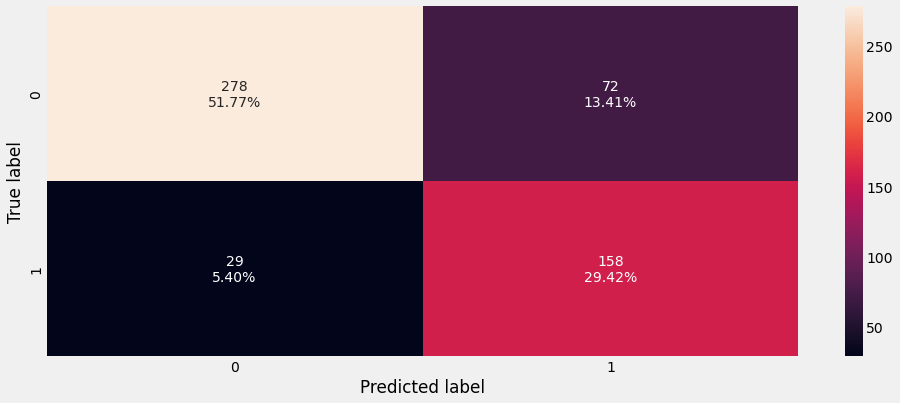

<IPython.core.display.Javascript object>

In [238]:
confusion_matrix_sklearn(
    abc_tuned, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [239]:
abc_tuned_model_train_perf = model_performance_classification_sklearn(
    abc_tuned, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
abc_tuned_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.81,0.84,0.69,0.76


<IPython.core.display.Javascript object>

#### Checking model performance on test set

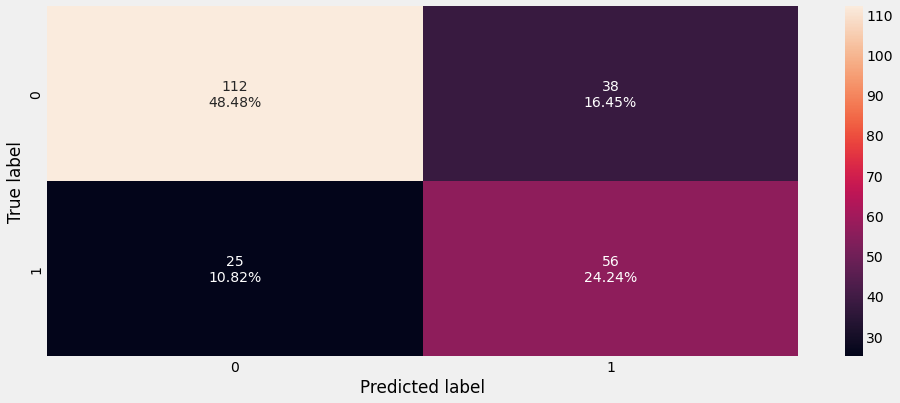

<IPython.core.display.Javascript object>

In [240]:
confusion_matrix_sklearn(
    abc_tuned, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [241]:
abc_tuned_model_test_perf = model_performance_classification_sklearn(
    abc_tuned, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
abc_tuned_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.73,0.69,0.60,0.64


<IPython.core.display.Javascript object>

 - Tuning reduces over fitting 

 - Precision is improved but F1 is reduced

## Important Features for Predicting Diabetes Outcome - AdaBoost Classifier

In [242]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        abc_tuned.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.32
BMI                          0.18
Diabetes__Pedigree__Function 0.18
Age                          0.15
Pregnancies                  0.08
Blood__Pressure              0.07
Insulin                      0.02
Skin_Thickness               0.00


<IPython.core.display.Javascript object>

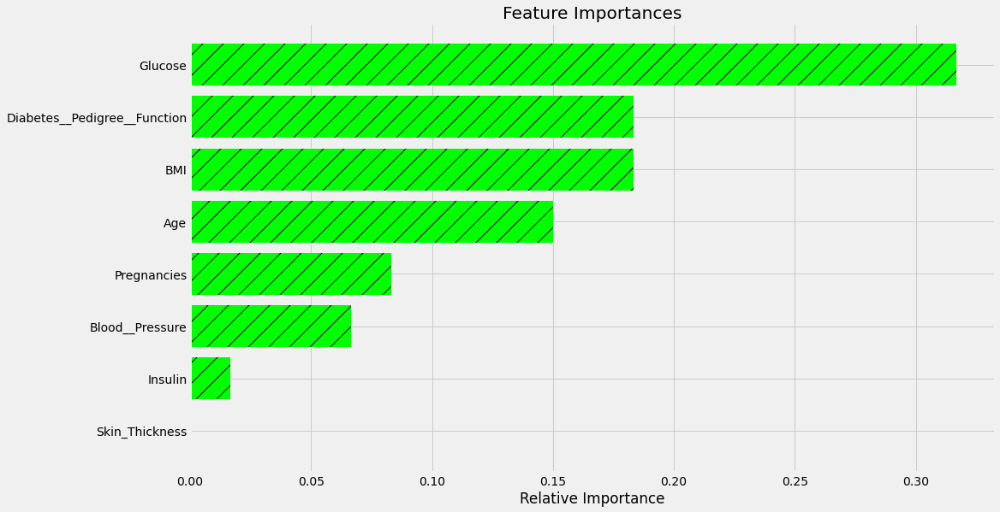

<IPython.core.display.Javascript object>

In [243]:
importances = abc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="lime", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

image.png

## Gradient Boosting Classifier

- Most of the hyperparameters available are same as random forest classifier.
- init: An estimator object that is used to compute the initial predictions. If ‘zero’, the initial raw predictions are set to zero. By default, a DummyEstimator predicting the classes priors is used.
- There is no class_weights parameter in gradient boosting.

In [244]:
gb_classifier = GradientBoostingClassifier(
    random_state=1
)  ## Complete the code to define Gradient Boosting Classifier with random state = 1
gb_classifier.fit(
    X_train, Y_train
)  ## Complete the code to fit Gradient Boosting Classifier on the train data

GradientBoostingClassifier(random_state=1)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

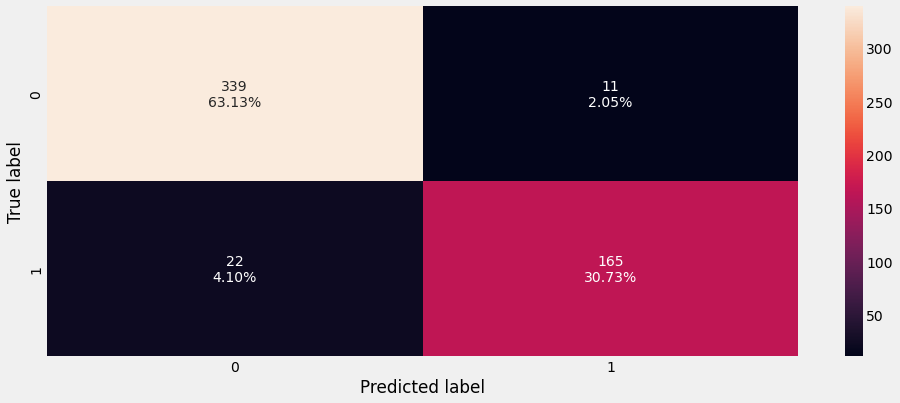

<IPython.core.display.Javascript object>

In [245]:
confusion_matrix_sklearn(
    gb_classifier, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [246]:
gb_classifier_model_train_perf = model_performance_classification_sklearn(
    gb_classifier, X_train, Y_train
)  ## Complete the code to check performance on train data
gb_classifier_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.94,0.88,0.94,0.91


<IPython.core.display.Javascript object>

#### Checking model performance on test set

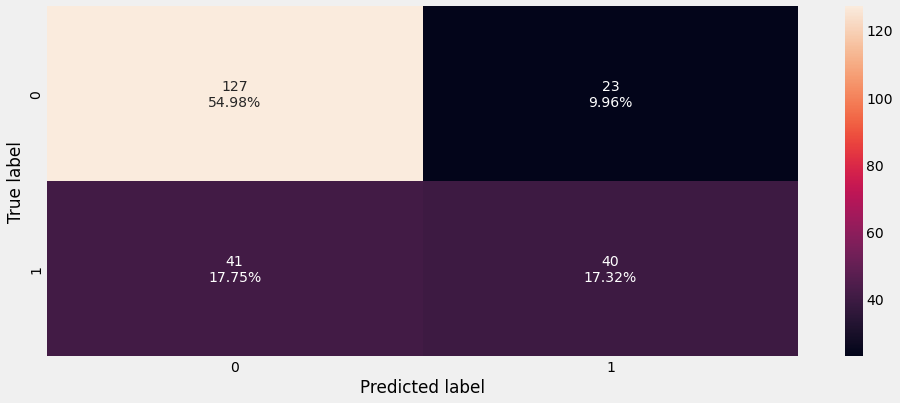

<IPython.core.display.Javascript object>

In [247]:
confusion_matrix_sklearn(
    gb_classifier, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [248]:
gb_classifier_model_test_perf = model_performance_classification_sklearn(
    gb_classifier, X_test, Y_test
)  ## Complete the code to check performance for test data
gb_classifier_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.72,0.49,0.63,0.56


<IPython.core.display.Javascript object>

- No significant increase in the model performance

image.png

### Hyperparameter Tuning - Gradient Boosting Classifier

In [249]:
# Choose the type of classifier.
gbc_tuned = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1))

# Grid of parameters to choose from
parameters = {
    "n_estimators": [200, 250, 300],
    "subsample": [0.8, 0.9, 1],
    "max_features": [0.7, 0.8, 0.9, 1],
    "learning_rate": np.arange(0.1, 0.4, 0.1),
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    gbc_tuned, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with cv = 5
grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on train data

# Set the clf to the best combination of parameters
gbc_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
gbc_tuned.fit(X_train, Y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=1, n_estimators=250, subsample=0.9)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

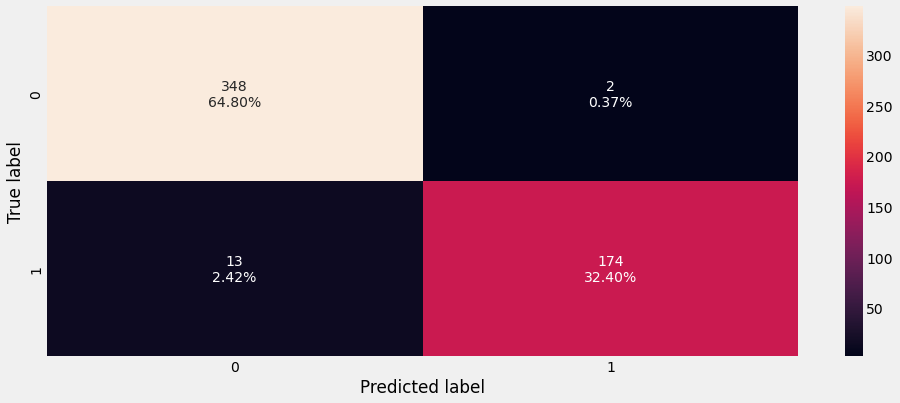

<IPython.core.display.Javascript object>

In [250]:
confusion_matrix_sklearn(
    gbc_tuned, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [251]:
gbc_tuned_model_train_perf = model_performance_classification_sklearn(
    gbc_tuned, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
gbc_tuned_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.97,0.93,0.99,0.96


<IPython.core.display.Javascript object>

#### Checking model performance on test set

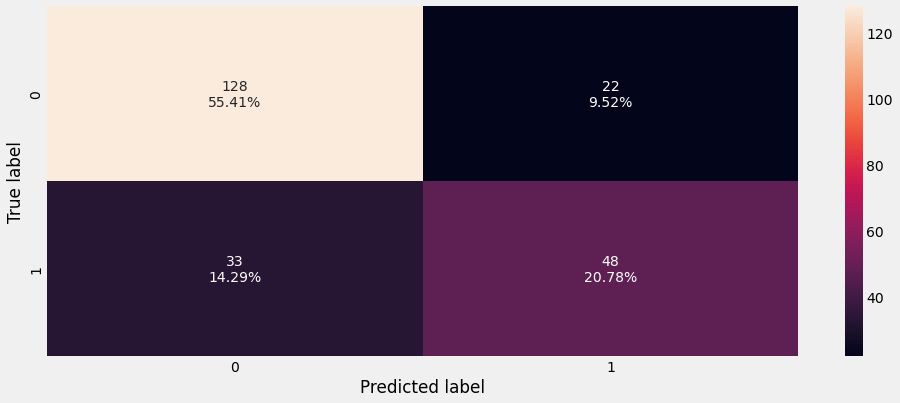

<IPython.core.display.Javascript object>

In [252]:
confusion_matrix_sklearn(
    gbc_tuned, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [253]:
gbc_tuned_model_test_perf = model_performance_classification_sklearn(
    gbc_tuned, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
gbc_tuned_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.76,0.59,0.69,0.64


<IPython.core.display.Javascript object>

Performance of Gradient Boster remains the same after hyperparameter tuning

## Important Features for Predicting Diabetes Outcome - Gradient Boost Classifier

In [254]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        gbc_tuned.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.24
BMI                          0.16
Age                          0.15
Diabetes__Pedigree__Function 0.13
Insulin                      0.09
Pregnancies                  0.09
Blood__Pressure              0.08
Skin_Thickness               0.06


<IPython.core.display.Javascript object>

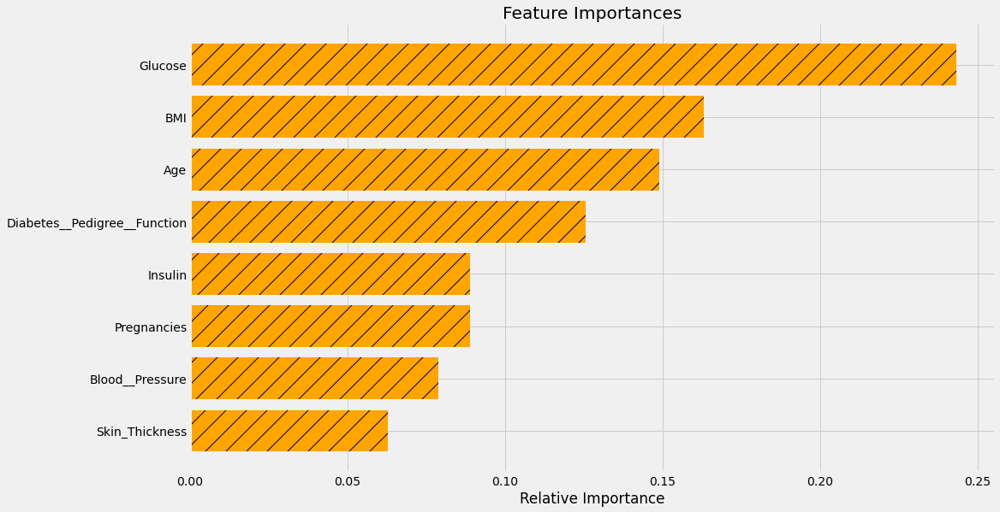

<IPython.core.display.Javascript object>

In [255]:
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="orange", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

image.png

## XGBoost Classifier

**XGBoost has many hyper parameters which can be tuned to increase the model performance.  Some of the important parameters are:**

- scale_pos_weight:Control the balance of positive and negative weights, useful for unbalanced classes. It has range from 0 to $\infty$.

- subsample: Corresponds to the fraction of observations (the rows) to subsample at each step. By default it is set to 1 meaning that we use all rows.

- colsample_bytree: Corresponds to the fraction of features (the columns) to use.

- colsample_bylevel: The subsample ratio of columns for each level. Columns are subsampled from the set of columns chosen for the current tree.

- colsample_bynode: The subsample ratio of columns for each node (split). Columns are subsampled from the set of columns chosen for the current level.

- max_depth: is the maximum number of nodes allowed from the root to the farthest leaf of a tree.

- learning_rate/eta: Makes the model more robust by shrinking the weights on each step.

- gamma: A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split.

In [256]:
xgb_classifier = XGBClassifier(
    random_state=1
)  ## Complete the code to define XGBoost Classifier with random state = 1 and eval_metric="logloss"
xgb_classifier.fit(
    X_train, Y_train
)  ## Complete the code to fit XGBoost Classifier on the train data

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=1,
              reg_alpha=0, reg_lambda=1, ...)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

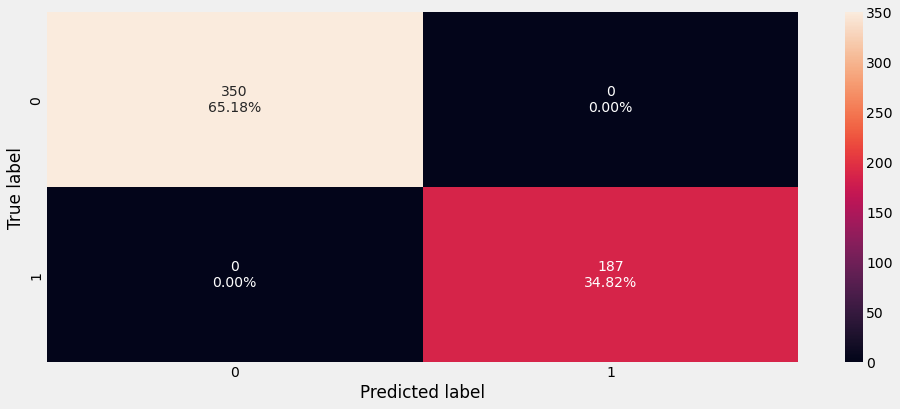

<IPython.core.display.Javascript object>

In [257]:
confusion_matrix_sklearn(
    xgb_classifier, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [258]:
xgb_classifier_model_train_perf = model_performance_classification_sklearn(
    xgb_classifier, X_train, Y_train
)  ## Complete the code to check performance on train data
xgb_classifier_model_train_perf

,Accuracy,Recall,Precision,F1
0,1.00,1.00,1.00,1.00


<IPython.core.display.Javascript object>

#### Checking model performance on test set

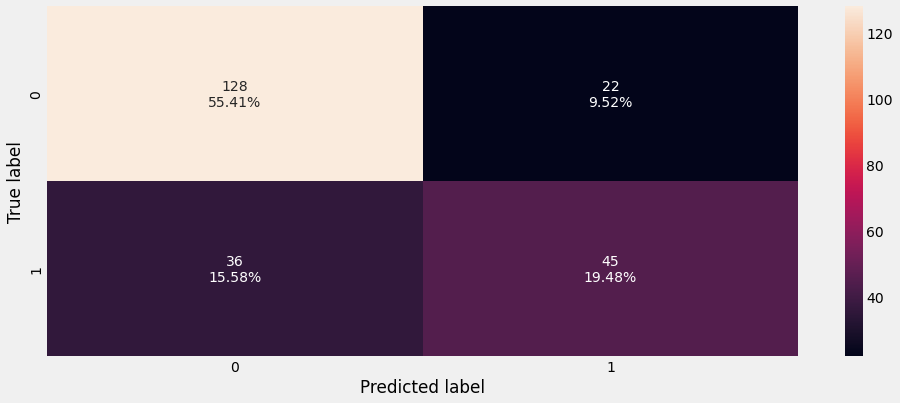

<IPython.core.display.Javascript object>

In [259]:
confusion_matrix_sklearn(
    xgb_classifier, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [260]:
xgb_classifier_model_test_perf = model_performance_classification_sklearn(
    xgb_classifier, X_test, Y_test
)  ## Complete the code to check performance for test data
xgb_classifier_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.75,0.56,0.67,0.61


<IPython.core.display.Javascript object>

- xgb_classifier model is slightly overfitting

- Peformance is only slightly lower than hyperparameter tuned Gradient Boosting Classifier

image.png

### Hyperparameter Tuning - XGBoost Classifier

In [261]:
# Choose the type of classifier.
xgb_tuned = XGBClassifier(random_state=1, eval_metric="logloss")

# Grid of parameters to choose from
parameters = {
    "n_estimators": np.arange(150, 250, 50),
    "scale_pos_weight": [1, 2],
    "subsample": [0.7, 0.9, 1],
    "learning_rate": np.arange(0.1, 0.4, 0.1),
    "gamma": [1, 3, 5],
    "colsample_bytree": [0.7, 0.8, 0.9],
    "colsample_bylevel": [0.8, 0.9, 1],
}

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.f1_score)

# Run the grid search
grid_obj = GridSearchCV(
    xgb_tuned, parameters, scoring=scorer, cv=5
)  ## Complete the code to run grid search with cv = 5
grid_obj = grid_obj.fit(
    X_train, Y_train
)  ## Complete the code to fit the grid_obj on train data

# Set the clf to the best combination of parameters
xgb_tuned = grid_obj.best_estimator_

# Fit the best algorithm to the data.
xgb_tuned.fit(X_train, Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=0.9, colsample_bynode=1, colsample_bytree=0.8,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', gamma=5, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_bin=256,
              max_cat_to_onehot=4, max_delta_step=0, max_depth=6, max_leaves=0,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=150, n_jobs=0, num_parallel_tree=1, predictor='auto',
              random_state=1, reg_alpha=0, reg_lambda=1, ...)

<IPython.core.display.Javascript object>

#### Checking model performance on training set

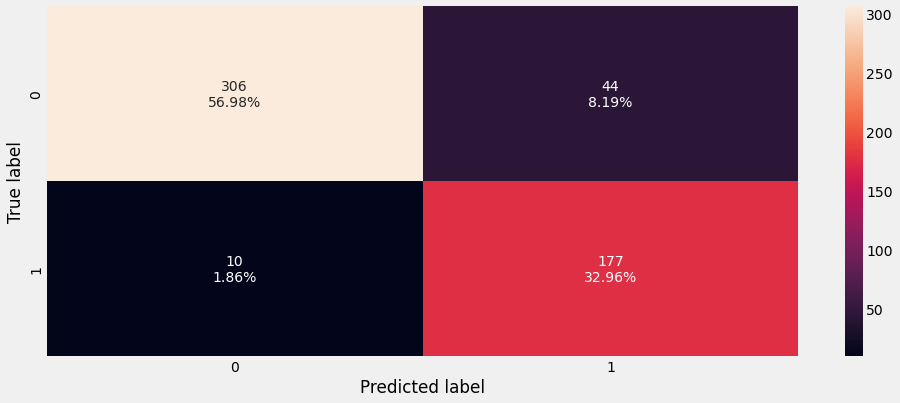

<IPython.core.display.Javascript object>

In [262]:
confusion_matrix_sklearn(
    xgb_tuned, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data on tuned estimator

In [263]:
xgb_tuned_model_train_perf = model_performance_classification_sklearn(
    xgb_tuned, X_train, Y_train
)  ## Complete the code to check performance for train data on tuned estimator
xgb_tuned_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.90,0.95,0.80,0.87


<IPython.core.display.Javascript object>

#### Checking model performance on test set

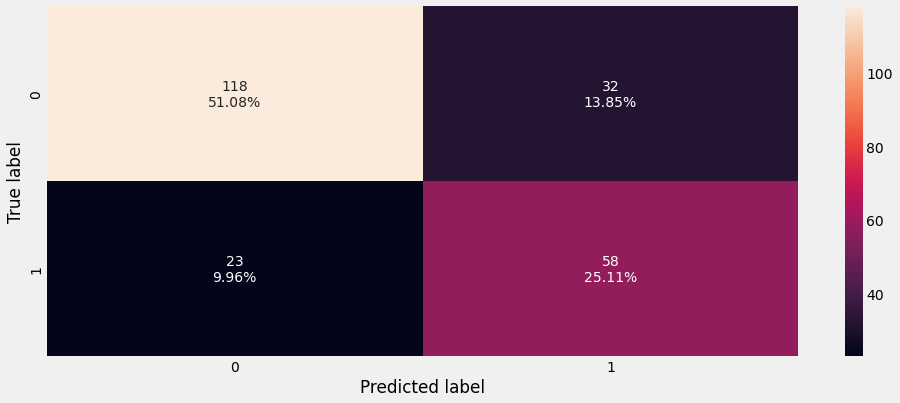

<IPython.core.display.Javascript object>

In [264]:
confusion_matrix_sklearn(
    xgb_tuned, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data on tuned estimator

In [265]:
xgb_tuned_model_test_perf = model_performance_classification_sklearn(
    xgb_tuned, X_test, Y_test
)  ## Complete the code to check performance for test data on tuned estimator
xgb_tuned_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.76,0.72,0.64,0.68


<IPython.core.display.Javascript object>

- Hypeparameter tuning of  XG model reduces overfitting
- The model performance for hypertuned XGBoost is lower than XGBoost

# Important Features for Prediction Diabetes Outcome - XGBoost Classifier

In [266]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        xgb_tuned.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.24
Age                          0.17
BMI                          0.14
Skin_Thickness               0.10
Pregnancies                  0.10
Insulin                      0.09
Diabetes__Pedigree__Function 0.08
Blood__Pressure              0.08


<IPython.core.display.Javascript object>

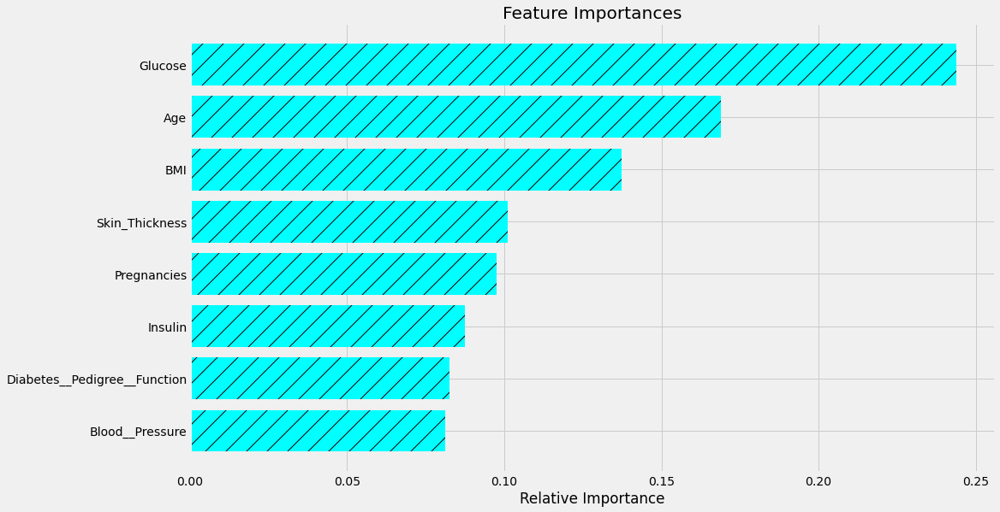

<IPython.core.display.Javascript object>

In [267]:
importances = xgb_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="aqua", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

image.png

## Stacking Classifier

In [268]:
estimators = [
    ("AdaBoost", ab_classifier),
    ("Gradient Boosting", gbc_tuned),
    ("Random Forest", rf_tuned),
]

final_estimator = xgb_tuned

stacking_classifier = StackingClassifier(
    estimators=estimators, final_estimator=final_estimator, cv=5
)  ## Complete the code to define Stacking Classifier

stacking_classifier.fit(
    X_train, Y_train
)  ## Complete the code to fit Stacking Classifier on the train data

StackingClassifier(cv=5,
                   estimators=[('AdaBoost', AdaBoostClassifier(random_state=1)),
                               ('Gradient Boosting',
                                GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                                                           max_features=1,
                                                           n_estimators=250,
                                                           subsample=0.9)),
                               ('Random Forest',
                                RandomForestClassifier(max_depth=10,
                                                       max_features='log2',
                                                       min_samples_split=5,
                                                       n_estimators=30,
                                                       oob_score=True,
                                                       random_s...
                                                 eval_metric='logloss', gamma=5,
                                                 gpu_id=-1,
                                                 grow_policy='depthwise',
                                                 importance_type=None,
                                                 interaction_constraints='',
                                                 learning_rate=0.1, max_bin=256,
                                                 max_cat_to_onehot=4,
                                                 max_delta_step=0, max_depth=6,
                                                 max_leaves=0,
                                                 min_child_weight=1,
                                                 missing=nan,
                                                 monotone_constraints='()',
                                                 n_estimators=150, n_jobs=0,
                                                 num_parallel_tree=1,
                                                 predictor='auto',
                                                 random_state=1, reg_alpha=0,
                                                 reg_lambda=1, ...))

<IPython.core.display.Javascript object>

#### Checking model performance on training set

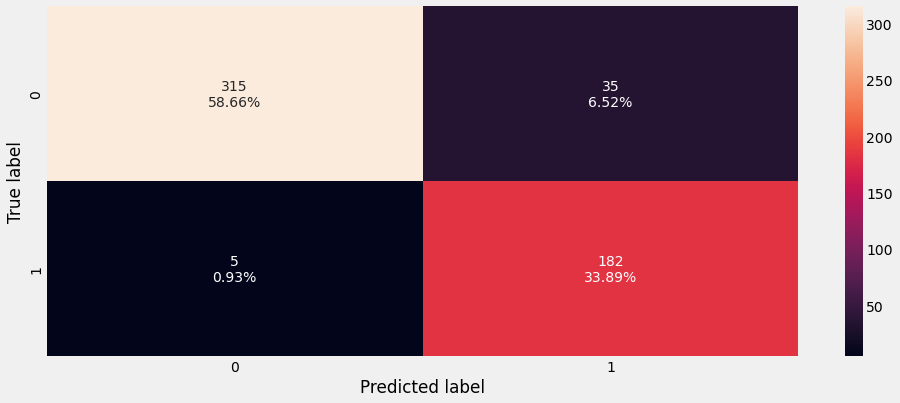

<IPython.core.display.Javascript object>

In [269]:
confusion_matrix_sklearn(
    stacking_classifier, X_train, Y_train
)  ## Complete the code to create confusion matrix for train data

In [270]:
stacking_classifier_model_train_perf = model_performance_classification_sklearn(
    stacking_classifier, X_train, Y_train
)  ## Complete the code to check performance on train data
stacking_classifier_model_train_perf

,Accuracy,Recall,Precision,F1
0,0.93,0.97,0.84,0.90


<IPython.core.display.Javascript object>

#### Checking model performance on test set

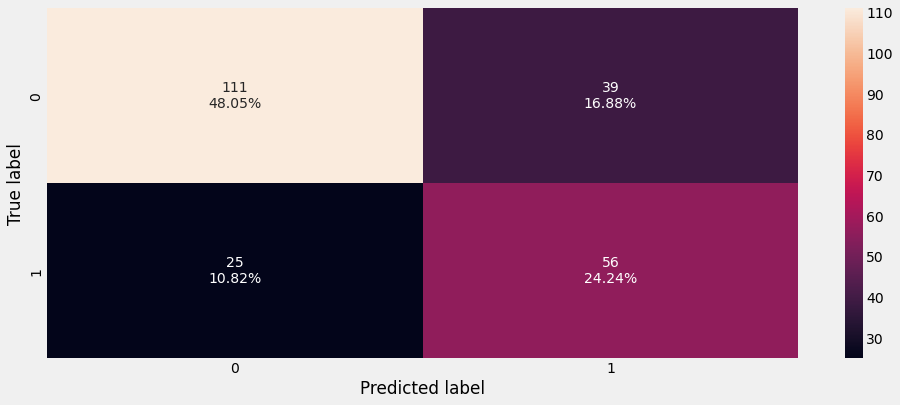

<IPython.core.display.Javascript object>

In [271]:
confusion_matrix_sklearn(
    stacking_classifier, X_test, Y_test
)  ## Complete the code to create confusion matrix for test data

In [272]:
stacking_classifier_model_test_perf = model_performance_classification_sklearn(
    stacking_classifier, X_test, Y_test
)  ## Complete the code to check performance for test data
stacking_classifier_model_test_perf

,Accuracy,Recall,Precision,F1
0,0.72,0.69,0.59,0.64


<IPython.core.display.Javascript object>

- Model performance is similar to hypertuned XG Boost

image.png

## Summary Performance Comparison Measures of Boosting Train vs Test

In [273]:
boosting_comp_df = pd.concat(
    [
        ab_classifier_model_train_perf.T,
        ab_classifier_model_test_perf.T,
        gb_classifier_model_train_perf.T,
        gb_classifier_model_test_perf.T,
        xgb_classifier_model_train_perf.T,
        xgb_classifier_model_test_perf.T,
    ],
    axis=1,
)

boosting_comp_df.columns = [
    "Adaboost Classifier (train)",
    "Adabosst Classifier (test)",
    "Gradient Boost Classifier (train)",
    "Gradient Boost Classifier (test)",
    "XGBoost Classifier (train)",
    "XGBoost Classifier (test)",
]
print("Boosting performance comparison:")
boosting_comp_df

Boosting performance comparison:


,Adaboost Classifier (train),Adabosst Classifier (test),Gradient Boost Classifier (train),Gradient Boost Classifier (test),XGBoost Classifier (train),XGBoost Classifier (test)
Accuracy,0.84,0.76,0.94,0.72,1.00,0.75
Recall,0.75,0.59,0.88,0.49,1.00,0.56
Precision,0.79,0.68,0.94,0.63,1.00,0.67
F1,0.77,0.63,0.91,0.56,1.00,0.61


<IPython.core.display.Javascript object>

image.png

## Summary Performance Comparison Measures of Boosting Tuned Training vs Tuned Testing

In [274]:
boosting_tuned_comp_df = pd.concat(
    [
        abc_tuned_model_train_perf.T,
        abc_tuned_model_test_perf.T,
        gbc_tuned_model_train_perf.T,
        gbc_tuned_model_test_perf.T,
        xgb_tuned_model_train_perf.T,
        xgb_tuned_model_test_perf.T,
        stacking_classifier_model_train_perf.T,
        stacking_classifier_model_test_perf.T,
    ],
    axis=1,
)
boosting_tuned_comp_df.columns = [
    "Adaboost Classifier tuned (train)",
    "Adabosst Classifier tuned (test)",
    "Gradient Boost Classifier tuned (train)",
    "Gradient Boost Classifier tuned (test)",
    "XGBoost Classifier tuned (train)",
    "XGBoost Classifier tuned (test)",
    "Stacking Classifier (train)",
    "Stacking Classifier (test)",
]
print("Boosting Tuned performance comparison:")
boosting_tuned_comp_df

Boosting Tuned performance comparison:


,Adaboost Classifier tuned (train),Adabosst Classifier tuned (test),Gradient Boost Classifier tuned (train),Gradient Boost Classifier tuned (test),XGBoost Classifier tuned (train),XGBoost Classifier tuned (test),Stacking Classifier (train),Stacking Classifier (test)
Accuracy,0.81,0.73,0.97,0.76,0.90,0.76,0.93,0.72
Recall,0.84,0.69,0.93,0.59,0.95,0.72,0.97,0.69
Precision,0.69,0.60,0.99,0.69,0.80,0.64,0.84,0.59
F1,0.76,0.64,0.96,0.64,0.87,0.68,0.90,0.64


<IPython.core.display.Javascript object>

image.png

## Summary Performance Measures of all Bagging and Boosting: All Training Models

In [275]:
# training performance comparison

models_train_comp_df = pd.concat(
    [
        decision_tree_perf_train.T,
        dtree_estimator_model_train_perf.T,
        rf_estimator_model_train_perf.T,
        rf_tuned_model_train_perf.T,
        bagging_classifier_model_train_perf.T,
        bagging_estimator_tuned_model_train_perf.T,
        ab_classifier_model_train_perf.T,
        abc_tuned_model_train_perf.T,
        gb_classifier_model_train_perf.T,
        gbc_tuned_model_train_perf.T,
        xgb_classifier_model_train_perf.T,
        xgb_tuned_model_train_perf.T,
        stacking_classifier_model_train_perf.T,
    ],
    axis=1,
)
models_train_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest ",
    "Random Forest Tuned",
    "Bagging Classifier",
    "Bagging Classifier Tuned",
    "Adaboost Classifier",
    "Adabosst Classifier Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned",
    "XGBoost Classifier",
    "XGBoost Classifier Tuned",
    "Stacking Classifier",
]
print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest,Random Forest Tuned,Bagging Classifier,Bagging Classifier Tuned,Adaboost Classifier,Adabosst Classifier Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned,XGBoost Classifier,XGBoost Classifier Tuned,Stacking Classifier
Accuracy,1.00,0.35,1.00,0.98,0.99,0.99,0.84,0.81,0.94,0.97,1.00,0.90,0.93
Recall,1.00,1.00,1.00,0.93,0.98,0.97,0.75,0.84,0.88,0.93,1.00,0.95,0.97
Precision,1.00,0.35,1.00,1.00,1.00,1.00,0.79,0.69,0.94,0.99,1.00,0.80,0.84
F1,1.00,0.52,1.00,0.96,0.99,0.99,0.77,0.76,0.91,0.96,1.00,0.87,0.90


<IPython.core.display.Javascript object>

image.png

## Summary Performance Measures of all Bagging and Boosting: All Testing Models

In [276]:
# testing performance comparison

models_test_comp_df = pd.concat(
    [
        decision_tree_perf_test.T,
        dtree_estimator_model_test_perf.T,
        rf_estimator_model_test_perf.T,
        rf_tuned_model_test_perf.T,
        bagging_classifier_model_test_perf.T,
        bagging_estimator_tuned_model_test_perf.T,
        ab_classifier_model_test_perf.T,
        abc_tuned_model_test_perf.T,
        gb_classifier_model_test_perf.T,
        gbc_tuned_model_test_perf.T,
        xgb_classifier_model_test_perf.T,
        xgb_tuned_model_test_perf.T,
        stacking_classifier_model_test_perf.T,
    ],
    axis=1,
)
models_test_comp_df.columns = [
    "Decision Tree",
    "Decision Tree Tuned",
    "Random Forest",
    "Random Forest Tuned",
    "Bagging Classifier",
    "Bagging Classifier Tuned",
    "Adaboost Classifier",
    "Adabosst Classifier Tuned",
    "Gradient Boost Classifier",
    "Gradient Boost Classifier Tuned",
    "XGBoost Classifier",
    "XGBoost Classifier Tuned",
    "Stacking Classifier",
]
print("Testing performance comparison:")
models_test_comp_df

Testing performance comparison:


,Decision Tree,Decision Tree Tuned,Random Forest,Random Forest Tuned,Bagging Classifier,Bagging Classifier Tuned,Adaboost Classifier,Adabosst Classifier Tuned,Gradient Boost Classifier,Gradient Boost Classifier Tuned,XGBoost Classifier,XGBoost Classifier Tuned,Stacking Classifier
Accuracy,0.74,0.35,0.73,0.74,0.74,0.74,0.76,0.73,0.72,0.76,0.75,0.76,0.72
Recall,0.59,1.00,0.52,0.52,0.57,0.51,0.59,0.69,0.49,0.59,0.56,0.72,0.69
Precision,0.64,0.35,0.65,0.66,0.66,0.67,0.68,0.60,0.63,0.69,0.67,0.64,0.59
F1,0.62,0.52,0.58,0.58,0.61,0.58,0.63,0.64,0.56,0.64,0.61,0.68,0.64


<IPython.core.display.Javascript object>

Observations:

* Accuracy appears to be similar in all Bagging and Boosting models and lower in Decision Tree models.

* Recall seems to be the  highest in Tuned Decision Tree Classifier (1.00), followed by Tuned AdaBoost Classifier

* Precision looks similar in all Bagging and Boosting models and slightly lower in Tuned Decision Tree model.

* F1 coefficient appears to be higher in Boosting models than Bagging models. 

* Interestingly, there is virtually no overfitting in AdaBoost and Gradient Boost models (both default and tuned). AdaBoost is very slightly overfitting than Gradient Boost models.


image.png

### Important features of the final selected model
### Selected Model - Tunned Random Forest


### Important Features for Predicting Diabeties Outcome - Tuned AdaBoost Classifier 

In [277]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        abc_tuned.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.32
BMI                          0.18
Diabetes__Pedigree__Function 0.18
Age                          0.15
Pregnancies                  0.08
Blood__Pressure              0.07
Insulin                      0.02
Skin_Thickness               0.00


<IPython.core.display.Javascript object>

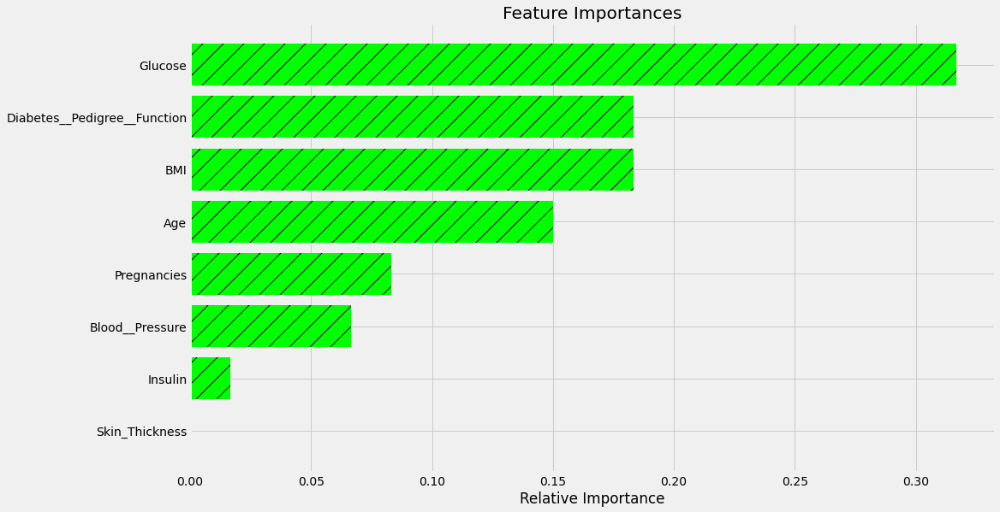

<IPython.core.display.Javascript object>

In [278]:
importances = abc_tuned.feature_importances_
indices = np.argsort(importances)
feature_names = list(X.columns)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="lime", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Second Model Selection- Gradient Boost Classifier

In [279]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(
    pd.DataFrame(
        gbc_tuned.feature_importances_, columns=["Imp"], index=X_train.columns
    ).sort_values(by="Imp", ascending=False)
)

                              Imp
Glucose                      0.24
BMI                          0.16
Age                          0.15
Diabetes__Pedigree__Function 0.13
Insulin                      0.09
Pregnancies                  0.09
Blood__Pressure              0.08
Skin_Thickness               0.06


<IPython.core.display.Javascript object>

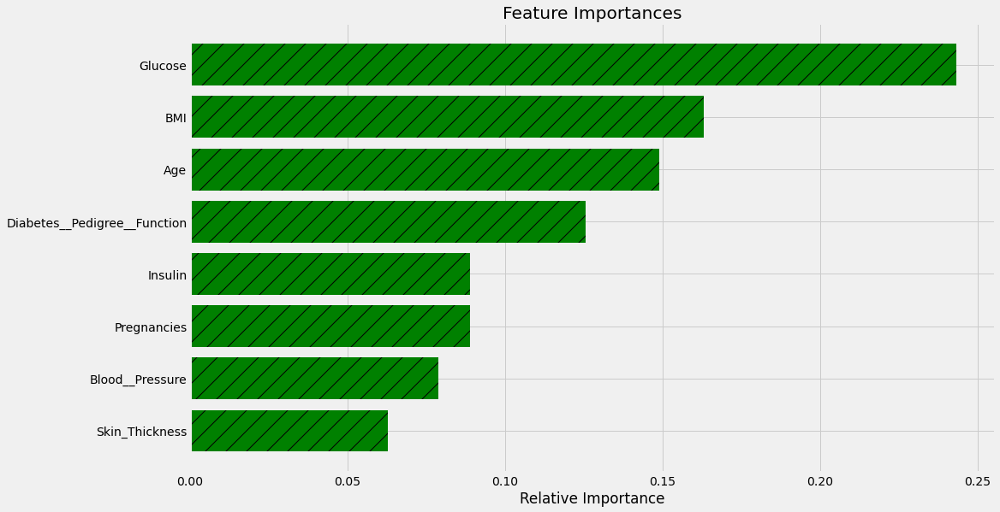

<IPython.core.display.Javascript object>

In [280]:
feature_names = X_train.columns
importances = gbc_tuned.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(15, 9))
plt.title("Feature Importances")
plt.barh(
    range(len(indices)), importances[indices], color="green", align="center", hatch="/"
)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

image.png

## Using Decision Tree for Prediction Diabetes Outcome

In [281]:
# Text report showing the rules of a decision tree -
feature_names = list(X_train.columns)
print(tree.export_text(model, feature_names=feature_names, show_weights=True))

|--- Glucose <= 127.50
|   |--- Age <= 28.50
|   |   |--- Pregnancies <= 7.50
|   |   |   |--- BMI <= 32.30
|   |   |   |   |--- Diabetes__Pedigree__Function <= 0.67
|   |   |   |   |   |--- weights: [94.00, 0.00] class: 0
|   |   |   |   |--- Diabetes__Pedigree__Function >  0.67
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 0.69
|   |   |   |   |   |   |--- weights: [0.00, 1.00] class: 1
|   |   |   |   |   |--- Diabetes__Pedigree__Function >  0.69
|   |   |   |   |   |   |--- weights: [14.00, 0.00] class: 0
|   |   |   |--- BMI >  32.30
|   |   |   |   |--- Diabetes__Pedigree__Function <= 0.14
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 0.11
|   |   |   |   |   |   |--- weights: [2.00, 0.00] class: 0
|   |   |   |   |   |--- Diabetes__Pedigree__Function >  0.11
|   |   |   |   |   |   |--- weights: [0.00, 3.00] class: 1
|   |   |   |   |--- Diabetes__Pedigree__Function >  0.14
|   |   |   |   |   |--- Diabetes__Pedigree__Function <= 1.27
|   |   |   |   |   | 

<IPython.core.display.Javascript object>

## General Models Observations

* We can see that three variables - Glucose, Age, and BMI are the most important factors in identifying persons who are at risk of diabetes. Other variables' importance is not significant. 
* Once the desired performance is achieved from the model, the company can use it to predict the risk factor of diabetes in new patients. This would help to reduce the cost and increase the efficiency of the process.
* Identifying the risk of diabetes at early stages, especially among pregnant women, can help to control the disease and prevent the second health problem.
* As per the decision tree business rules:
    - Women's glucose level <=127 and age <=28 have a lower risk of diabetes.
    - Women's glucose level >100 and age >28 have a higher risk of diabetes.
    - Women's glucose level >127 and BMI <=28 have a lower risk of diabetes.
* Based on the above analysis, we can say that:
    - Middle-aged to older women has a higher risk of diabetes. They should keep the glucose level in check and take proper precautions.
    - Overweight women have a higher risk of diabetes. They should keep the glucose level in check and exercise regularly. 

___

image.png

# Busines Recommendations

image.png

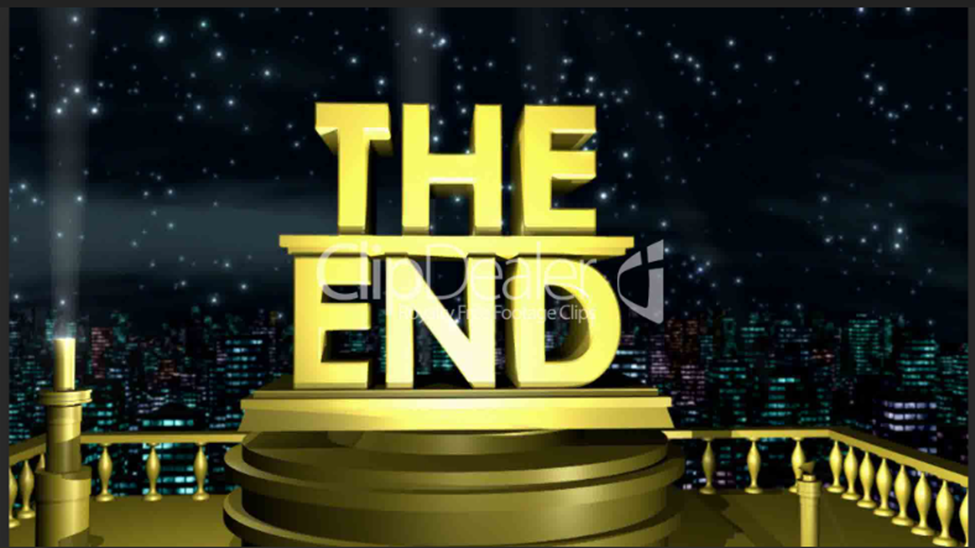

image.png

In [ ]:
import pandas as pd
import numpy as np
!pip3 install plotly
!pip3 install plotly --upgrade